## **Library Imports**

In [ ]:
import pandas as pd
import numpy as np
import math
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import log_loss, classification_report, accuracy_score, precision_score, recall_score, f1_score, multilabel_confusion_matrix, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import OneHotEncoder

from bs4 import BeautifulSoup
from html import unescape

from collections import Counter, defaultdict

from matplotlib import pyplot as plt
import seaborn as sns
from itertools import cycle

import time
import inspect
import sys  
if 'contractions' not in sys.modules:
  !{sys.executable} -m pip install contractions

import contractions

import nltk
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
from nltk.corpus import stopwords, wordnet
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk import pos_tag


import torch
import torch.nn as nn





     |████████████████████████████████| 284 kB 4.3 MB/s 
     |████████████████████████████████| 321 kB 28.6 MB/s 
  Created wheel for pyahocorasick: filename=pyahocorasick-1.4.2-cp37-cp37m-linux_x86_64.whl size=85454 sha256=6ec50ee4f7e9c8d92a6e5917a58dfc449777e080662a78d33610c9bbe7563324
  Stored in directory: /root/.cache/pip/wheels/25/19/a6/8f363d9939162782bb8439d886469756271abc01f76fbd790f
Successfully built pyahocorasick
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


## **Data Preprocessing and Statistics**

Functions for neccessary **text cleaning** including URL and HTML removal, contraction normalization, lowercasing and further noisy input elimination (such as emojis, symbols etc...). An extra preprocessing stage (such as stopword removal, length filtering, lemmatization etc...) can also be applied

In [ ]:
def removeHTML(text):
  soup = BeautifulSoup(text)
  soup = BeautifulSoup(unescape(soup.get_text()), 'lxml')
  return soup.get_text()

def fixContractions(tweet):
  expanded_words = []    
  for word in tweet.split():
    expanded_words.append(contractions.fix(word).lower())
  return expanded_words

def get_pos(tag):
  if tag.startswith('J'):
    return wordnet.ADJ
  elif tag.startswith('V'):
    return wordnet.VERB
  elif tag.startswith('R'):
    return wordnet.ADV
  else:
    return wordnet.NOUN

def normalization(tweet, lemmatizer):
  tagged_tweet = pos_tag(tweet.split())
  clean_tweet = ' '.join([lemmatizer.lemmatize(word, get_pos(tag)) for word, tag in tagged_tweet])
  return clean_tweet

def extra_preprocessing(df, column):
  lemmatizer = WordNetLemmatizer()
  #stemmer = PorterStemmer()
  stop_words = set(stopwords.words('english'))
  # Some words that might be useful for sentiment recognition
  special_word_set = set(['no', 'we', 'i', 'you', 'not'])
  # Lemmatization
  df[column] = df[column].apply(lambda tweet: normalization(tweet, lemmatizer))
  # Stopword removal and length filtering
  df[column] = df[column].apply(lambda tweet: ' '.join([w for w in tweet.split() if (len(w) > 2 and w not in stop_words) or w in special_word_set]))

# All the neccessary cleaning for the data
def preprocessing(df, column, simple_preprocessing = True):
  # Lowercasing all characters in order to treat all words in a same way
  df[column] = df[column].str.lower()
  # Removal of tweet mentions (names appeared in mentions are not so important)
  #df['tweet'] = df['tweet'].str.replace(r'@\S+', '')
  # Retweet removal
  df[column] = df[column].str.replace(r'\s+rt|^rt', '')
  # URL and HTML tag cleaning (some links dont make any sense and are not so important)
  df[column] = df[column].str.replace(r'http\S+|www.\S+', '')
  df[column] = df[column].apply(removeHTML)
  # Contraction fixing
  df[column] = df[column].apply(lambda tweet: ' '.join(fixContractions(tweet)))
  # Non letter character removal
  df[column] = df[column].str.replace(r'-|–|\[|\]|_', '').str.replace(r'[^a-zA-z]+', ' ')
  # Whitespace removal
  df[column] = df[column].str.replace(r'\s+', ' ')
  if not simple_preprocessing:
    extra_preprocessing(df, column)
  # Empty tweet removal
  df = df[df[column] != '']

**Dataset loading** and **preprocessing** using the above fuctions 

In [ ]:
# LOAD TEST SET AS ./vaccine_validation_set.csv OR GIVE THE RIGHT PATH

# Reading the two csv files with pandas
training_set = pd.read_csv('./vaccine_train_set.csv', encoding = 'utf-8')
validation_set = pd.read_csv('./vaccine_validation_set.csv', encoding = 'utf-8')
print('\nBefore cleaning:')
print(training_set.head(10))
print(validation_set.head(10))


preprocessing(training_set, 'tweet', simple_preprocessing = False)
preprocessing(validation_set, 'tweet', simple_preprocessing = False)

print('\nAfter cleaning:')
print(training_set.head(10))
print(validation_set.head(10))


Before cleaning:
   Unnamed: 0                                              tweet  label
0           0  Sip N Shop Come thru right now #Marjais #Popul...      0
1           1  I don't know about you but My family and I wil...      1
2           2  @MSignorile Immunizations should be mandatory....      2
3           3  President Obama spoke in favor of vaccination ...      0
4           4  "@myfoxla: Arizona monitoring hundreds for mea...      0
5           5  Why did I get my whooping cough vaccine the sa...      2
6           6  Prosecutor Ken Ervin: I want to know how reckl...      0
7           7  "@UberFacts: On average, people who complain l...      0
8           8  The legacy of @JennyMcCarthy will be she took ...      2
9           9  “@UberFacts: On average, people who complain l...      0
   Unnamed: 0                                              tweet  label
0           0  @user They had a massive surge in with covid d...      1
1           1  Required vaccines for school: P

Visualization of the results extracted from the **statistical analysis** for the tweets

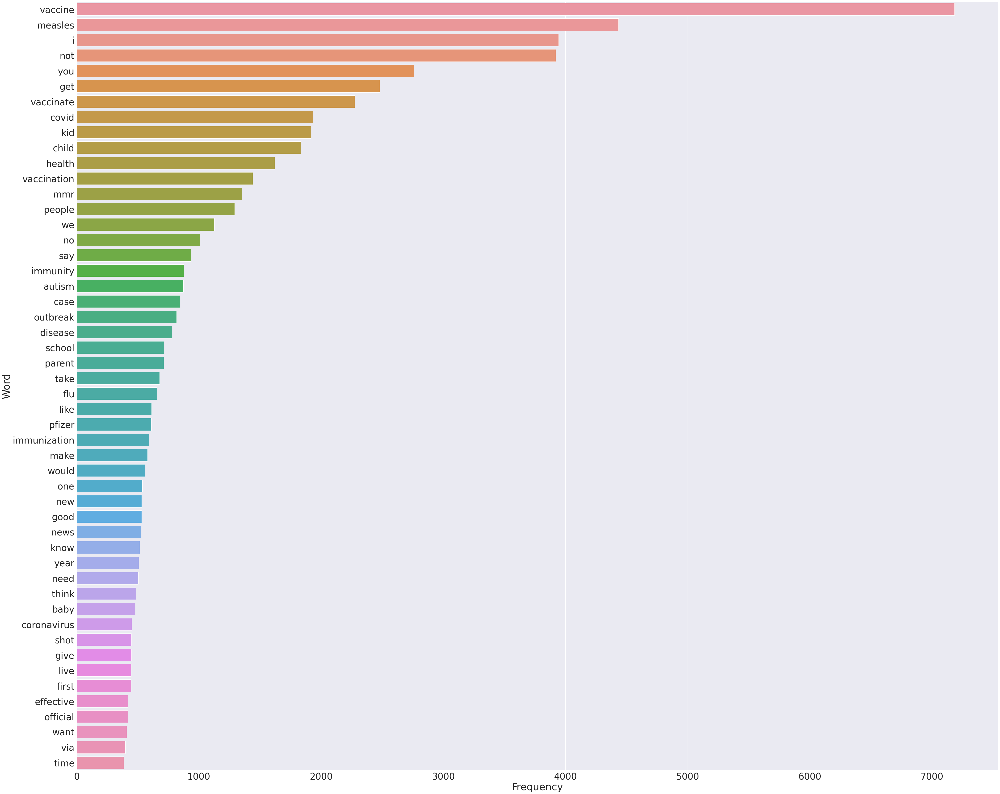

Training set size is 15976
Neutral tweets are 46.68252378567852%
Antivax tweets are 12.975713570355532%
Provax tweets are 40.34176264396595%


In [ ]:
# Visualization of the most common words (for better insights)
def tweetStatistics(tweets):
  all_words = []
  for tweet in tweets:
    for word in tweet.split():
      all_words.append(word)
  # Using pandas to merge the word column and the frequency column for seaborn barplot
  word_freq = pd.DataFrame(Counter(all_words).items(), columns = ['Word','Frequency']).sort_values(by = 'Frequency', ascending = False)
  figure = plt.figure()
  figure.set_figwidth(70)
  figure.set_figheight(60)
  sns.set(font_scale = 3.5)
  bar = sns.barplot(x = 'Frequency', y = 'Word', data = word_freq.head(50))
  plt.show()
  sns.set(font_scale = 1)

tweetStatistics(training_set['tweet'].tolist())
training_size = len(training_set['tweet'].tolist())
print('Training set size is %d' % training_size)
stats = training_set.groupby(['label']).count()
for stat, name in zip(stats['tweet'].tolist(), ['Neutral', 'Antivax', 'Provax']):
  print(name + ' tweets are ' + str(stat/training_size*100) + '%')


## **Training a Feed Forward Neural Net**

Useful functions for  **perfomance visualization**. These functions are used for plotting **confusion matrices**, **learning curves** (loss vs epochs)  and **roc curves**

In [ ]:
def plotConfusionMatrix(matrix, title, ax, targets = None):
    sns.heatmap(matrix, annot = True, cmap = 'Blues', fmt = "d", ax = ax)
    ax.set_title(title + '\n');
    if targets is None:
      ax.xaxis.set_ticklabels(['False', 'True'])
      ax.yaxis.set_ticklabels(['False', 'True'])
    else:
      ax.xaxis.set_ticklabels(targets)
      ax.yaxis.set_ticklabels(targets)
    ax.tick_params(axis = 'both', which = 'major', labelsize = 10, labelbottom = False, bottom = False, top = False, labeltop = True)

def plotConfusionMatrices(targets, class_confusion_matrices, glob_confusion_matrix = None):
    if glob_confusion_matrix is not None:
      fig, axes = plt.subplots(1, len(targets) + 1)
    else:
      fig, axes = plt.subplots(1, len(targets))

    fig.set_figheight(4)
    fig.set_figwidth(20)
    i = 0
    for matrix, target in zip(class_confusion_matrices, targets):
      plotConfusionMatrix(matrix, 'Confusion Matrix for ' + target, axes[i])
      i += 1
      print()

    if glob_confusion_matrix is not None:
      plotConfusionMatrix(glob_confusion_matrix, 'Global Confusion Matrix', axes[-1], targets)
    
    plt.tight_layout()
    plt.show()


def plotLearningCurves(x_axis, y_axis, x_label, y_label, curve_ids, ax, x_best = None, y_best = None):
  if x_best is not None and y_best is not None:
    ax.annotate('Early Stopping Checkpoint ' + str(x_best), xy = (x_best, y_best), arrowprops = dict(facecolor = 'black', shrink = 0.05))
  for y, id in zip(y_axis, curve_ids):
    ax.plot(x_axis, y, label = id, linewidth = 4)
  ax.set_title('Learning Curves')
  ax.set_xlabel(x_label)
  ax.set_ylabel(y_label)
  ax.legend(loc = 'lower right')
 

def plotRocCurves(fpr, tpr, roc_auc, n_classes, lw = 2):
  plt.figure()
  plt.plot(
      fpr['micro'],
      tpr['micro'],
      label = 'micro-average ROC curve (area = {0:0.2f})'.format(roc_auc['micro']),
      color = 'deeppink',
      linestyle = ':',
      linewidth = 4,
  )

  plt.plot(
      fpr['macro'],
      tpr['macro'],
      label = 'macro-average ROC curve (area = {0:0.2f})'.format(roc_auc['macro']),
      color = 'navy',
      linestyle = ':',
      linewidth = 4,
  )

  colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
  for i, color in zip(range(n_classes), colors):
      plt.plot(
          fpr[i],
          tpr[i],
          color = color,
          lw = lw,
          label = 'ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]),
      )

  plt.plot([0, 1], [0, 1], 'k--', lw = lw)
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('Receiver Operating Characteristic Curves')
  plt.legend(loc = 'lower right')
  plt.show()



Some **activation** and **loss** functions, **optimizers** and **scheldulers** that are going to be tested below. The  model is going to use either the **SELU**, or **ReLU** activation function (at hidden layers), either the **Cross Entropy** or **Hinge multinomial** loss function (the last one is an extension of the maximum margin objective function to work with multiclass classfication), either **Stohastic Gradient Decent** (or some variations like **Nesterov** and **Momentum**) or **Adadelta** or **Adam** optimizer and some scheldulers (in order to adjust the learning rate properly and help the training process to avoid big steps) like **Exponential** schelduler, **One Cycle** schelduler **Performance** schelduler etc...

In [ ]:
activation_functions = {
    'SELU': nn.SELU,
    'ReLU': nn.ReLU
}

loss_functions = {
    'CrossEntropy': nn.CrossEntropyLoss,
    'Hinge': nn.MultiMarginLoss
}

optimizers = {
    'SGD': lambda model_params, learning_rate, L2_reg: torch.optim.SGD(model_params, lr = learning_rate, weight_decay = L2_reg),
    'Momentum': lambda model_params, learning_rate, L2_reg: torch.optim.SGD(model_params, lr = learning_rate, momentum = 0.9, weight_decay = L2_reg), # Typical momentum value
    'Nesterov': lambda model_params, learning_rate, L2_reg: torch.optim.SGD(model_params, lr = learning_rate, momentum = 0.9, nesterov = True, weight_decay = L2_reg), # Typical momentum value
    'Adadelta': lambda model_params, learning_rate, L2_reg: torch.optim.Adadelta(model_params, lr = learning_rate, weight_decay = L2_reg),
    'Adam': lambda model_params, learning_rate, L2_reg: torch.optim.Adam(model_params, lr = learning_rate, weight_decay = L2_reg) 
}

# Popular learning rate scheldulers
scheldulers = {
  'Exponential': lambda optimizer, step: torch.optim.lr_scheduler.LambdaLR(optimizer, lambda epoch: 0.1 ** (epoch / step)), # Initial lr* 0.1^(t/step)
  'Power': lambda optimizer, step: torch.optim.lr_scheduler.LambdaLR(optimizer, lambda epoch: 1 / (1 + epoch / step)), # Initial lr/ (1 + t/step)
  'Piecewise': lambda optimizer, milestones:  torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones = milestones, gamma = 0.1), # lr for 1 <= epoch < m1, lr*0.1 for m1 <= epoch < m2 ...
  'Performance': lambda optimizer, patience : torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', patience = patience),
  'OneCycle': lambda optimizer, steps_per_epoch, epochs, max_lr : torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr = max_lr, anneal_strategy = 'linear', steps_per_epoch = steps_per_epoch, epochs = epochs)
}


This is the actual class of the **Feed Forward** neural network. This class has been extended with some extra functionalities in order to automate all the training and evaluation process as much as possible. Initialization requires only the layers with their number of neurons in order to connect them automatically and to do some **weight initialization** according to the given activation function of each layer preventing **vanishing/exploding gradients**. Also there are two functions for **training** but the one with the more options (stats, early stopping etc...) it is going to be used below. Furthermore, these functions support **learning rate schelduling** and they call in every epoch the **batch** training submethod to train all the batches. About the forward pass of the training it has been extended to do some **batch normalization** on the input if needed. Finally, there is one method for making predictions for any given unseen input

In [ ]:
class NeuralNet(nn.Module):
    def __init__(self, layers, D_in, batch_norm_input = False):
        super().__init__()

        # Layers are stored in a ModuleList in order to be found by the optimizer
        self.layers = nn.ModuleList([])
        # All activation functions for each layer
        self.activations = []

        # Batch normalization layer
        self.batch_norm = nn.BatchNorm1d(D_in, affine = False) if batch_norm_input else None
        
        for i in range(len(layers)):
          if i == 0: # The input for the first layer is always a training instance
            self.layers.append(nn.Linear(D_in, layers[0]['neurons']))
          else: # Every intermediate layer as well as the output layer is fed with the output of their previous one
            self.layers.append(nn.Linear(layers[i - 1]['neurons'], layers[i]['neurons']))
          self.activations.append(layers[i]['activation_fun'])
        
        if self.activations[-1] is None: # If softmax is missing at the output layer model is going to use it only for making probability predictions
          self.softmax = nn.LogSoftmax(dim = 1)
          
        # Popular weight initializations for each type of activation function
        weight_init = {
            'ReLU': torch.nn.init.kaiming_uniform_, # HE initialization should be applied to the linear layer
            'SELU': None, # LeCun initialization should be applied but it is the default for the linear layer
            'Softmax': torch.nn.init.xavier_uniform_, # Glorot initialization should be applied to the linear layer
            'LogSoftmax': torch.nn.init.xavier_uniform_ # Glorot initialization should be applied to the linear layer
        }

        for layer, activation_fun in zip(self.layers, self.activations):
          # Initialization of the weights for each layer according to their activation functions in order to avoid vanishing/exploding gradients
          if activation_fun is not None and weight_init[type(activation_fun).__name__] is not None:
            weight_init[type(activation_fun).__name__](layer.weight)
        
    def forward(self, X):
        out = None
        for layer, activation_fun in zip(self.layers, self.activations):
          if out is None: # This is the first time so the initial input will be given to the current layer
            if self.batch_norm is not None: # Input normalization using batch normalization
              X = self.batch_norm(X)
            out = layer(X)
          else: # The previous output will be given as input to the current layer
            out = layer(out)
          if activation_fun is not None: # If an activation function exists it is applied to the output of the same layer
            out = activation_fun(out)
      
        return out
    
    def batchTrain(self, batch_loader, optimizer, loss_fun, schelduler = None):
      total_loss = 0.0
      correct_preds = 0.0
      total = 0.0
      f1_scores = 0.0

      for x_batch, y_batch in batch_loader:
        y_pred = self(x_batch)

        loss = loss_fun(y_pred, y_batch)
        total_loss += loss.item()
        
        # Gradients are restored to zero
        optimizer.zero_grad()
        # Backpropagation starting from the loss calculated in this epoch
        loss.backward()
        # Model's weights update based on the gradients calculated during backprop
        optimizer.step()

        # Some scheldulers can make steps inside the batches such as OneCycle schelduler
        if schelduler is not None:
          schelduler.step()
          #print(schelduler.state_dict())

        # Batch accuracy score calculation
        if self.activations[-1] is None:
          y_pred = self.softmax(y_pred)
        
        # Gathering information for calculating accuracy score
        correct_preds += torch.max(y_pred, 1)[1].eq(y_batch).sum().item()
        total += len(y_batch)

        # F1 score of the batch
        f1_scores += f1_score(y_batch.detach().numpy(), torch.max(y_pred, 1)[1].detach().numpy(), average = 'weighted')

      return [correct_preds / total, total_loss / len(batch_loader), f1_scores / len(batch_loader)] # Accuracy, Loss, F1 score (an average approximation)
    
    def batchEval(self, batch_loader, loss_fun):
          total_loss = 0.0
          correct_preds = 0.0
          total = 0.0
          f1_scores = 0.0

          with torch.no_grad():
            for x_batch, y_batch in batch_loader:
              y_pred = self(x_batch)
                
              loss = loss_fun(y_pred, y_batch)
              total_loss += loss.item() 
              
              # Batch accuracy score calculation
              if self.activations[-1] is None:
                y_pred = self.softmax(y_pred)
          
              correct_preds += torch.max(y_pred, 1)[1].eq(y_batch).sum().item()
              total += len(y_batch)

              # F1 score of the batch
              f1_scores += f1_score(y_batch.detach().numpy(), torch.max(y_pred, 1)[1].detach().numpy(), average = 'weighted')
          
          return [correct_preds / total, total_loss / len(batch_loader), f1_scores / len(batch_loader)]
        
    def trainNN(self, training_set, optimizer, loss_fun, lr_schelduler = None, epochs = 100, batch_size = 64):
      # Switching to training mode
      self.train()

      # Training batches
      dataset = torch.utils.data.TensorDataset(training_set[0], training_set[1])
      batch_loader = torch.utils.data.DataLoader(dataset, batch_size = batch_size, shuffle = True)
      
      # Creating the right schelduling function
      if lr_schelduler is not None:
        if lr_schelduler['name'] != 'Performance':
          schelduler = lr_schelduler['schelduler']
        else:
          raise Exception('Performance schelduling cannot be applied')

      for epoch in range(1, epochs + 1):
        if lr_schelduler is not None and not lr_schelduler['epoch_step']:  # For OneCycle schelduler for example is better to make steps inside the batches
          acc_score, loss_score, f1 = self.batchTrain(batch_loader, optimizer, loss_fun, schelduler)
        else:
          acc_score, loss_score, f1 = self.batchTrain(batch_loader, optimizer, loss_fun)
    
        # Learning rate modification for the next epoch
        if lr_schelduler is not None and lr_schelduler['epoch_step']:
          schelduler.step()
          #print(schelduler.state_dict())
        
        print(f'Epoch {epoch:3}: Accuracy = {acc_score:.5f}, Loss = {loss_score:.5f} , F1 score = {f1:.5f}')

    def trainNNWithOptions(self, training_set, optimizer, loss_fun, validation_set = None, lr_schelduler = None, epochs = 100, batch_size = 64, stats = False, early_stopping_params = None):
      if validation_set is not None and (stats != False or early_stopping_params is not None or (lr_schelduler is not None and lr_schelduler['name'] == 'Performance')): 
        valid_losses = []
        valid_acc_scores = []
        valid_f1_scores = []
        train_losses = []
        train_acc_scores = []
        train_f1_scores = []
        best_score = float('inf')
        best_iter = 1
        counter = 0
        epoch = 1

        # Training batches
        dataset = torch.utils.data.TensorDataset(training_set[0], training_set[1])
        training_batch_loader = torch.utils.data.DataLoader(dataset, batch_size = batch_size, shuffle = True)

        # Validation batches
        dataset = torch.utils.data.TensorDataset(validation_set[0], validation_set[1])
        validation_batch_loader = torch.utils.data.DataLoader(dataset, batch_size = batch_size)

        # Creating the right schelduling function
        if lr_schelduler is not None:
          schelduler = lr_schelduler['schelduler']
        
        for epoch in range(1, epochs + 1): 
          # Switching to training mode
          self.train()
          # Batch training and calculation of the average training batch scores (accuracy score, loss, f1 score)
          if lr_schelduler is not None and not lr_schelduler['epoch_step']:  # For OneCycle schelduler for example is better to make steps inside the batches
            train_acc_score, train_loss, train_f1_score = self.batchTrain(training_batch_loader, optimizer, loss_fun, schelduler)
          else:
            train_acc_score, train_loss, train_f1_score = self.batchTrain(training_batch_loader, optimizer, loss_fun)

          train_acc_scores.append(train_acc_score)
          train_losses.append(train_loss)
          train_f1_scores.append(train_f1_score)

          # Switching to evaluation mode
          self.eval()
          # Calculation of validation batch scores
          valid_acc_score, valid_loss, valid_f1_score =  self.batchEval(validation_batch_loader, loss_fun)

          valid_acc_scores.append(valid_acc_score)
          valid_losses.append(valid_loss)
          valid_f1_scores.append(valid_f1_score)

          if valid_loss < best_score:
            best_score = valid_loss
            best_iter = epoch
            counter = 0
          else: 
            counter += 1

          # If validation set starts increasing by reaching a small patience then maybe the model starts to overfit. So model training has to stop as soon as possible
          if early_stopping_params is not None and counter == early_stopping_params['patience']:
            break
          
          # Learning rate modification for the next epoch
          if lr_schelduler is not None:
            if lr_schelduler['name'] == 'Performance': # Validation loss must be passed to the performance schelduler
              schelduler.step(valid_loss)
            elif lr_schelduler['epoch_step']:
              schelduler.step()
            #print(schelduler.state_dict())
        
        if stats:
          # Score tracing of epochs   
          print(f'Training accuracy scores: {train_acc_scores}')
          print(f'Validation accuracy scores: {valid_acc_scores}')
          print(f'Training f1 scores: {train_f1_scores}')
          print(f'Validation f1 scores: {valid_f1_scores}')
          print(f'Training losses: {train_losses}')
          print(f'Validation losses: {valid_losses}')
          # Learning curve plots
          fig, axes = plt.subplots(1, 2)
          fig.set_figheight(5)
          fig.set_figwidth(25)
          plotLearningCurves(list(range(1, epoch + 1)), [valid_acc_scores, train_acc_scores], 'Number of Iterations', 'Accuracy', ['validation', 'training'], axes[0])
          plotLearningCurves(list(range(1, epoch + 1)), [valid_losses, train_losses], 'Number of Iterations', 'Loss', ['validation', 'training'], axes[1], best_iter, best_score)
          plt.show()
          
          return [train_acc_scores, valid_acc_scores, train_f1_scores, valid_f1_scores, train_losses, valid_losses]
          
      elif validation_set is None and (stats != False or early_stopping_params is not None or (lr_schelduler is not None and lr_schelduler['name'] == 'Performance')): 
        raise Exception('Validation set must not be None in order to calculate stats or to do early stopping or to do performance schelduling')
      else: 
        self.trainNN(training_set, optimizer, loss_fun, lr_schelduler, epochs, batch_size)
    
    def predict(self, X, proba = False):
      # Switching to evaluation mode
      self.eval()
      with torch.no_grad():
          if self.activations[-1] is not None:
            y_pred = self(X)
          else: # Model computes the scores of each class so softmax function must be applied
            y_pred = self.softmax(self(X))

          if proba:  # Probabilities are returned
            return y_pred
          else: # Class estimations are returned
            return torch.max(y_pred, 1)[1]


Functions for **model training** using a custom made **grid search** and **model evaluation** (including all score measurements as well as the creation of confusion matrices for all classes together and for each class as well and also the creation of the roc curves in such a way that the sklearn library recommends)

In [ ]:
# Implemented in such a way that sklearn recommends to create ROC curves
def rocCurves(y_test, y_pred, targets):
  fpr = {}
  tpr = {}
  roc_auc = {}
  n_classes = len(targets)

  # Actual labels must be one-hot encoded
  encoder = OneHotEncoder(sparse = False, dtype = int)
  y_test = encoder.fit_transform(y_test.reshape(len(y_test), 1))

  for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

  # Micro-average ROC curve and ROC area
  fpr['micro'], tpr['micro'], _ = roc_curve(y_test.ravel(), y_pred.ravel())
  roc_auc['micro'] = auc(fpr['micro'], tpr['micro'])
  
  # False positive rates aggregation
  all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

  # All ROC curves are interpolated
  mean_tpr = np.zeros_like(all_fpr)
  for i in range(n_classes):
      mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
  mean_tpr /= n_classes

  fpr['macro'] = all_fpr
  tpr['macro'] = mean_tpr
  roc_auc['macro'] = auc(fpr['macro'], tpr['macro'])
  
  plotRocCurves(fpr, tpr, roc_auc, n_classes)

def modelEvaluation(clf, test_set, targets, cm_plot = False, roc_plot = False):
  y_pred = clf.predict(test_set[0])
  # All metrics in one
  report = classification_report(test_set[1].detach().numpy(), y_pred.detach().numpy(), target_names = targets , digits = 5, output_dict = True)
  print(pd.DataFrame(report).transpose().drop(['support'], axis = 1).drop(['accuracy'], axis = 0).to_string())
  print(f'Accuracy: {report["accuracy"]:.5f} \n' )
  if cm_plot:
    class_confusion_matrices = multilabel_confusion_matrix(test_set[1], y_pred, labels = [i for i in range(len(targets))])
    glob_confusion_matrix = confusion_matrix(test_set[1], y_pred, labels = [i for i in range(len(targets))])
    plotConfusionMatrices(targets, class_confusion_matrices, glob_confusion_matrix)
  if roc_plot:
    # Roc curves need the probabilities of each class
    y_pred = clf.predict(test_set[0], proba = True)
    rocCurves(test_set[1], y_pred, targets)  
  return report

def customGridSearch(param_grid, training_set, validation_set):
  i = 1
  best_score = 0
  best_grid = None
  for num_neuron_list in param_grid['neurons']:
    for activation_name in param_grid['activation_functions']:
      for optimizer_name in param_grid['optimizers']:
        for loss_name in param_grid['loss_functions']:
          for learning_rate in param_grid['learning_rates']:
            # Layer construction
            layers = []
            activation_function = activation_functions[activation_name]()
            for num_neurons in num_neuron_list:
              layers.append({'neurons': num_neurons, 'activation_fun': activation_function})
            # Output layer construction
            if loss_name == 'CrossEntropy':
              layers.append({'neurons': len(param_grid['classes']), 'activation_fun': None})
            else:
              layers.append({'neurons': len(param_grid['classes']), 'activation_fun': nn.LogSoftmax(dim = 1)})

            model = NeuralNet(layers, training_set[0].shape[1], param_grid['input_normalization'])
            
            optimizer = optimizers[optimizer_name](model.parameters(), learning_rate['val'], param_grid['L2_reg'])
            loss_function = loss_functions[loss_name](reduction = 'sum')
            schelduler = None
            # Creation of the schelduler with some default values (e.g steps, etc..)
            if learning_rate['schelduler'] is not None and not optimizer_name.startswith('Ad'): # Adaptive optimizers already adjust the learning rate so they dont need a schelduler
              if learning_rate['schelduler'] == 'Exponential':
                schelduler = {'name':  'Exponential', 'schelduler': scheldulers['Exponential'](optimizer, 5), 'epoch_step': True}
              if learning_rate['schelduler'] == 'Power':
                schelduler = {'name':  'Power', 'schelduler': scheldulers['Power'](optimizer, 5), 'epoch_step': True}
              if learning_rate['schelduler'] == 'Piecewise':
                schelduler = {'name':  'Piecewise', 'schelduler': scheldulers['Piecewise'](optimizer, [0.2 * param_grid['epochs'], 0.5 * param_grid['epochs'], 0.8 * param_grid['epochs']]), 'epoch_step': True} 
              if learning_rate['schelduler'] == 'Performance':
                schelduler = {'name':  'Performance', 'schelduler': scheldulers['Performance'](optimizer, 4), 'epoch_step': True}
              if learning_rate['schelduler'] == 'OneCycle':
                schelduler = {'name':  'OneCycle', 'schelduler': scheldulers['OneCycle'](optimizer, math.ceil(training_set[0].shape[0] / param_grid['batch_size']), param_grid['epochs'], learning_rate['val'] * 100), 'epoch_step': False}
           
            curr_grid = f'Grid Search: {i}, Layers: {num_neuron_list}, Optimizer: {optimizer_name}, Activation: {activation_name}, Loss: {loss_name}, Learning Rate: {learning_rate["val"]}, Schelduler: {learning_rate["schelduler"] if schelduler is not None else None}'
            print(curr_grid)
            
            i += 1
            # Timekeeping the training process
            timestamp_start = time.time()
            train_acc_scores, valid_acc_scores, train_f1_scores, valid_f1_scores, train_losses, valid_losses = model.trainNNWithOptions(training_set, optimizer, loss_function, validation_set, schelduler, stats = True, batch_size = param_grid['batch_size'], epochs = param_grid['epochs'], early_stopping_params = {'patience': param_grid['early_stopping_patience']})
            timestamp_end = time.time()
            # Normalized L2 distance between training and validation loss
            plot_dist = np.linalg.norm(np.array(train_losses) - np.array(valid_losses)) / len(train_losses)
            # Model evaluation
            scores = modelEvaluation(model, validation_set, param_grid['classes'])
            print(f'Total time: {timestamp_end - timestamp_start:.2f} seconds')
            
            # The best model is the one with the highest accuracy and the least distance between learning curves (so the one with the biggest ratio is a good candidate)
            if(scores['accuracy'] / plot_dist > best_score and scores['accuracy'] >= param_grid['accuracy_threshold']):
              best_score = scores['accuracy'] / plot_dist
              best_grid = curr_grid

  print(f'Best grid is: {best_grid}' )



## **Training using TF-IDF vectorizer**

Training using **TF-IDF vectorizer** without scaling because the vector values are already scaled by the **TF-IDF** transformation



In [ ]:
training_tweets = training_set['tweet'].tolist()
validation_tweets = validation_set['tweet'].tolist()

# Vectorizer will only keep some small sample of feature
tfidf_vect = TfidfVectorizer(max_df = 0.75, max_features = 3000)

# The vocabulary dictionary is created by the training tweets 
tfidf_vect.fit(training_tweets)

# TF-IDF represantation of training set for that vocabulary
tfidf_training_tweets = tfidf_vect.transform(training_tweets)

# TF-IDF represantation of validation set for that vocabulary
tfidf_validation_tweets = tfidf_vect.transform(validation_tweets)

# New training and validation sets according to their vectorized versions as torch tensors
tfidf_training_set = [torch.from_numpy(tfidf_training_tweets.todense()).float(), torch.from_numpy(training_set['label'].to_numpy())]
tfidf_validation_set = [torch.from_numpy(tfidf_validation_tweets.todense()).float(), torch.from_numpy(validation_set['label'].to_numpy())]


## **Model Evaluation & Tuning Section**

### **Layer/Neuron architecture selection: Few Layers & Few Neurons vs Few Layers & Many Neurons vs Many Layers & Few Neurons vs Many Layers & Many Neurons**

Grid Search: 1, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5831872809213821, 0.6764521782674011, 0.6907861792689034, 0.7063720580871307, 0.7151977966950426, 0.7216449674511768, 0.723647971957937, 0.7238983475212819, 0.7243365047571357, 0.7269028542814221, 0.7264646970455684, 0.7264646970455684, 0.7267150726089133, 0.7272158237356035, 0.728092138207311, 0.7271532298447672, 0.7275913870806209, 0.7276539809714572, 0.7272784176264396, 0.7275913870806209, 0.7274036054081122, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847, 0.7275287931897847]
Validation accuracy scores

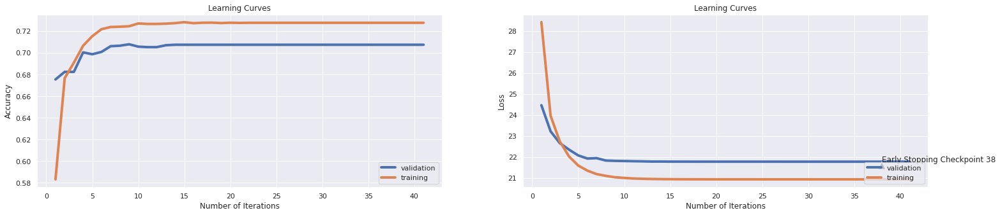

              precision    recall  f1-score
neutral        0.763766  0.807512  0.785030
antivax        0.710145  0.165541  0.268493
provax         0.648574  0.765472  0.702191
macro avg      0.707495  0.579508  0.585238
weighted avg   0.710320  0.707274  0.684596
Accuracy: 0.70727 

Total time: 100.60 seconds
Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46413370055082626, 0.47026790185277917, 0.5224712068102153, 0.6012143214822233, 0.6434651977966951, 0.6546695042563846, 0.6658112168252378, 0.671507260891337, 0.6751377065598397, 0.6830871306960441, 0.6843390085127692, 0.6875312969454181, 0.6924762143214822, 0.6949173760640961, 0.6957936905358038, 0.6989233850776164, 0.7009263895843766, 0.7021156735102654, 0.7054331497245869, 0.706434651977967, 0.7081872809213821, 0.7101276915373059, 0.7160741111667501, 0.7198297446169254, 0.721957936905358, 0.724649474211317, 0.7247746619929895, 0

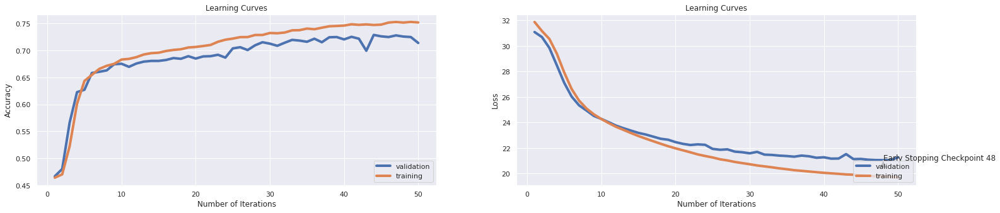

              precision    recall  f1-score
neutral        0.714397  0.861972  0.781277
antivax        0.737864  0.256757  0.380952
provax         0.710291  0.689468  0.699725
macro avg      0.720851  0.602732  0.620651
weighted avg   0.715784  0.713848  0.696436
Accuracy: 0.71385 

Total time: 96.50 seconds
Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.44391587381071607, 0.4672008012018027, 0.5185903855783676, 0.6174261392088132, 0.6561091637456185, 0.6723835753630446, 0.6822734101151727, 0.6913495242864296, 0.6951677516274412, 0.7028668002003005, 0.711379569354031, 0.7175763645468203, 0.7230846269404106, 0.7289684526790186, 0.7334752128192289, 0.7355408112168252, 0.7392338507761642, 0.7419879819729595, 0.7429268903355033, 0.7444917376064096, 0.7452428642964447, 0.746306960440661, 0.7469954932398598, 0.7485603405107661, 0.7511266900350526, 0.746306960440661, 0.7479344016024037

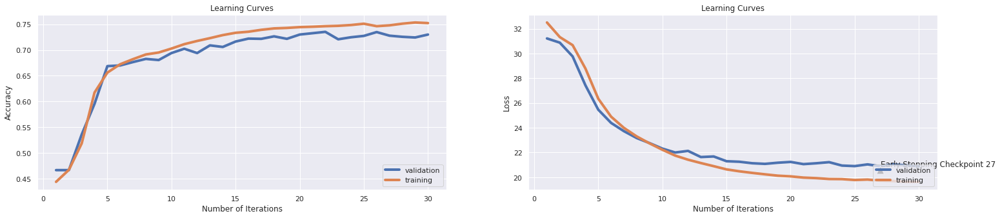

              precision    recall  f1-score
neutral        0.790610  0.790610  0.790610
antivax        0.729323  0.327703  0.452214
provax         0.670664  0.789359  0.725187
macro avg      0.730199  0.635891  0.656004
weighted avg   0.734251  0.730061  0.720312
Accuracy: 0.73006 

Total time: 66.07 seconds
Grid Search: 4, Layers: [675], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5957060590886329, 0.6741362043064597, 0.6971707561342013, 0.7084376564847271, 0.7182023034551828, 0.7223335002503756, 0.7227716574862293, 0.7276539809714572, 0.7270906359539309, 0.7264021031547321, 0.7285302954431647, 0.7284677015523285, 0.7277165748622935, 0.7286554832248373, 0.7284051076614922, 0.7285302954431647, 0.7285302954431647, 0.728342513770656, 0.7284051076614922, 0.728342513770656, 0.728592889334001, 0.7284677015523285, 0.7284051076614922, 0.7284677015523285, 0.7284677015523285, 0.7284677015523285, 0.72846770155232

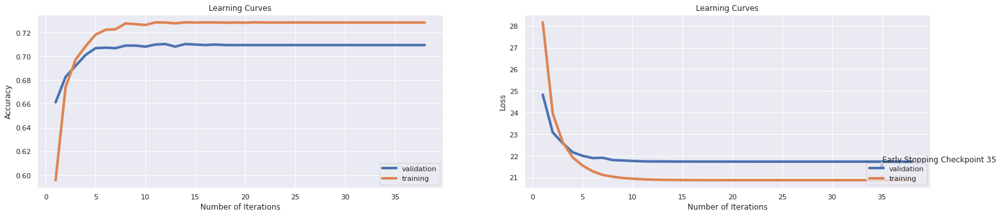

              precision    recall  f1-score
neutral        0.764915  0.806573  0.785192
antivax        0.726027  0.179054  0.287263
provax         0.651013  0.767644  0.704534
macro avg      0.713985  0.584424  0.592330
weighted avg   0.713901  0.709465  0.688052
Accuracy: 0.70947 

Total time: 337.61 seconds
Grid Search: 5, Layers: [675], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4658237356034051, 0.4803455182774161, 0.5525788683024537, 0.6148597896845268, 0.6487856785177767, 0.6622433650475713, 0.6706309464196294, 0.6740110165247872, 0.6802704056084126, 0.685778668002003, 0.6879694541812719, 0.689972458688032, 0.693415122684026, 0.6983600400600901, 0.6974211316975463, 0.7026164246369554, 0.7041812719078618, 0.7065598397596394, 0.7088758137205808, 0.7126940410615924, 0.7166374561842764, 0.7205808713069605, 0.7230846269404106, 0.7228968452679019, 0.7240235353029544, 0.7297821732598898, 0.7312218327491237, 0

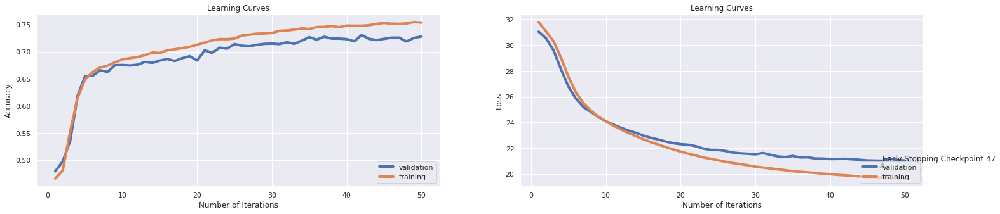

              precision    recall  f1-score
neutral        0.793726  0.784038  0.788852
antivax        0.739837  0.307432  0.434368
provax         0.663957  0.798046  0.724852
macro avg      0.732507  0.629839  0.649357
weighted avg   0.734362  0.727870  0.717042
Accuracy: 0.72787 

Total time: 422.06 seconds
Grid Search: 6, Layers: [675], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4590635953930896, 0.47020530796194293, 0.5554581872809213, 0.6331997996995493, 0.6638082123184778, 0.6751377065598397, 0.6849023535302955, 0.6909739609414122, 0.6979218828242364, 0.7065598397596394, 0.7122558838257386, 0.722458688032048, 0.7243990986479719, 0.7292188282423635, 0.7310340510766149, 0.7364171256885328, 0.7412994491737607, 0.7425513269904858, 0.7446169253880821, 0.7436154231347021, 0.7472458688032048, 0.7485603405107661, 0.7502503755633451, 0.7494366549824737]
Validation accuracy scores: [0.46669588080631025, 0.47

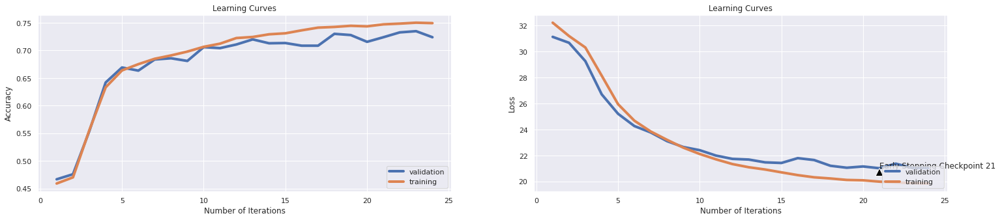

              precision    recall  f1-score
neutral        0.746633  0.832864  0.787395
antivax        0.690323  0.361486  0.474501
provax         0.700745  0.714441  0.707527
macro avg      0.712567  0.636264  0.656474
weighted avg   0.720809  0.723926  0.714575
Accuracy: 0.72393 

Total time: 237.62 seconds
Grid Search: 7, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5763645468202303, 0.6763269904857286, 0.7086880320480721, 0.7315348022033049, 0.7502503755633451, 0.760828743114672, 0.7688407611417125, 0.7722834251377065, 0.775851276915373, 0.7770405608412619, 0.7789183775663495]
Validation accuracy scores: [0.6678352322524101, 0.6678352322524101, 0.7090271691498685, 0.7164767747589833, 0.7248028045574058, 0.7304995617879053, 0.7326906222611744, 0.733567046450482, 0.7322524101665207, 0.738387379491674, 0.7283085013146363]
Training f1 scores: [0.4965332804279252, 0.6325432695471427, 0.

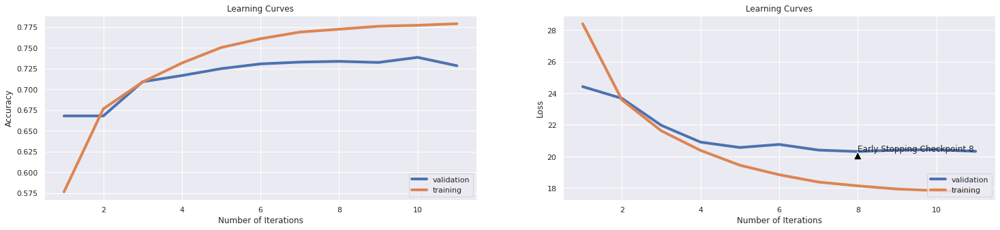

              precision    recall  f1-score
neutral        0.799216  0.766197  0.782359
antivax        0.676471  0.388514  0.493562
provax         0.670027  0.793702  0.726640
macro avg      0.715238  0.649471  0.667520
weighted avg   0.731155  0.728309  0.722411
Accuracy: 0.72831 

Total time: 37.29 seconds
Grid Search: 8, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4668252378567852, 0.4770280420630946, 0.592764146219329, 0.6509764646970456, 0.670756134201302, 0.6816474712068102, 0.6921006509764647, 0.6994241362043064, 0.7055583375062594, 0.7099399098647972, 0.7118177265898848, 0.7212694041061593, 0.7310340510766149, 0.7392964446670005, 0.7477466199298949, 0.7536304456685028, 0.7598272408612919, 0.7657110665998998, 0.7687781672508763, 0.7678392588883325, 0.7725963945918878, 0.775350525788683, 0.7762894341512269, 0.7818602904356535, 0.7821106659989985, 0.7863670505758638, 0.78542814221332, 

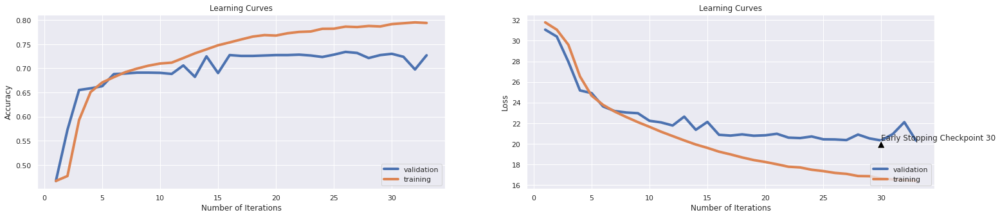

              precision    recall  f1-score
neutral        0.787879  0.781221  0.784536
antivax        0.597156  0.425676  0.497041
provax         0.690640  0.761129  0.724174
macro avg      0.691892  0.656009  0.668584
weighted avg   0.723895  0.726994  0.722883
Accuracy: 0.72699 

Total time: 111.66 seconds
Grid Search: 9, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4668252378567852, 0.4706434651977967, 0.5753630445668503, 0.660678517776665, 0.6836504757135704, 0.6959188783174762, 0.7058087130696044, 0.7137581372058087, 0.7344767150726089, 0.7425513269904858, 0.7503129694541812, 0.7558212318477716, 0.760578367551327, 0.7637080620931397, 0.7671507260891337, 0.7744116174261392, 0.7723460190285428, 0.7781672508763144]
Validation accuracy scores: [0.46669588080631025, 0.5153374233128835, 0.6529360210341806, 0.670464504820333, 0.6748466257668712, 0.6919368974583698, 0.6888694127957932, 0.6

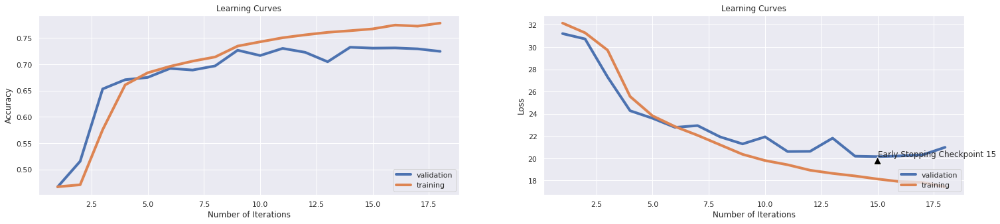

              precision    recall  f1-score
neutral        0.829424  0.730516  0.776835
antivax        0.770642  0.283784  0.414815
provax         0.640486  0.858849  0.733766
macro avg      0.746851  0.624383  0.641805
weighted avg   0.745545  0.724365  0.712495
Accuracy: 0.72436 

Total time: 70.96 seconds
Grid Search: 10, Layers: [660, 270], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5845643465197796, 0.6725713570355534, 0.7064972458688032, 0.735478217325989, 0.75, 0.7620180270405609, 0.7722208312468704, 0.7745368052078118, 0.777541311967952, 0.7787305958938407, 0.7803580370555834, 0.7811091637456185, 0.7816725087631448, 0.7826740110165248, 0.7829243865798698, 0.7825488232348523, 0.7828617926890336, 0.782486229344016, 0.7826114171256885, 0.782486229344016]
Validation accuracy scores: [0.6695880806310254, 0.6958808063102542, 0.7116564417177914, 0.6945661700262927, 0.7283085013146363, 0.72699386503067

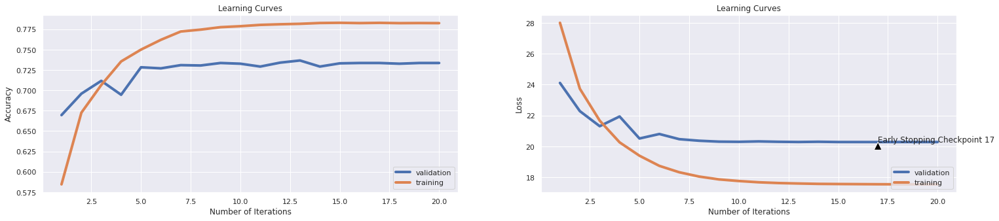

              precision    recall  f1-score
neutral        0.786854  0.786854  0.786854
antivax        0.661290  0.415541  0.510373
provax         0.691562  0.774159  0.730533
macro avg      0.713235  0.658851  0.675920
weighted avg   0.732108  0.733567  0.728261
Accuracy: 0.73357 

Total time: 248.09 seconds
Grid Search: 11, Layers: [660, 270], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46331997996995494, 0.4884827240861292, 0.6050325488232349, 0.6544817225838758, 0.6755132699048573, 0.6844016024036054, 0.696106659989985, 0.7025538307461192, 0.7080620931397096, 0.7139459188783175, 0.7173885828743115, 0.7238983475212819, 0.7316599899849775, 0.7406735102653981, 0.7446795192789184, 0.7556334501752628, 0.7582623935903856, 0.7614546820230346, 0.7655858788182274, 0.7692789183775663, 0.7695292939409114, 0.7746619929894842, 0.7806084126189284, 0.7801076614922383, 0.7806710065097646, 0.7854907361041562, 0.7871181772

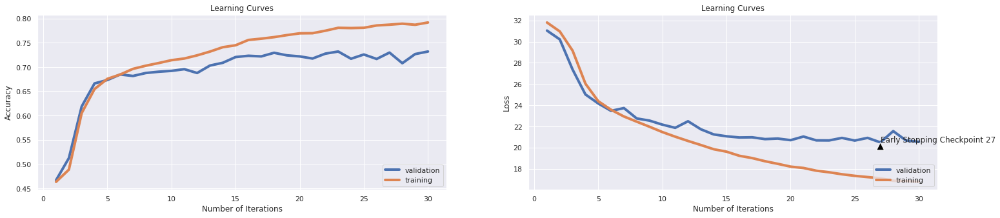

              precision    recall  f1-score
neutral        0.793365  0.785915  0.789623
antivax        0.704698  0.354730  0.471910
provax         0.675325  0.790445  0.728364
macro avg      0.724463  0.643697  0.663299
weighted avg   0.734224  0.731814  0.723688
Accuracy: 0.73181 

Total time: 272.27 seconds
Grid Search: 12, Layers: [660, 270], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.45975212819228845, 0.4690160240360541, 0.5776164246369554, 0.6639959939909865, 0.6851527290936404, 0.6962318477716575, 0.7100650976464697, 0.7174511767651477, 0.732035553329995, 0.7414246369554331, 0.7537556334501753, 0.7542563845768653, 0.7595142714071107, 0.7662118177265899, 0.7720330495743616]
Validation accuracy scores: [0.46669588080631025, 0.47107800175284836, 0.6393514460999123, 0.6792287467134093, 0.677475898334794, 0.6914986853637161, 0.6735319894829097, 0.7195442594215601, 0.7050832602979842, 0.7160385626643295

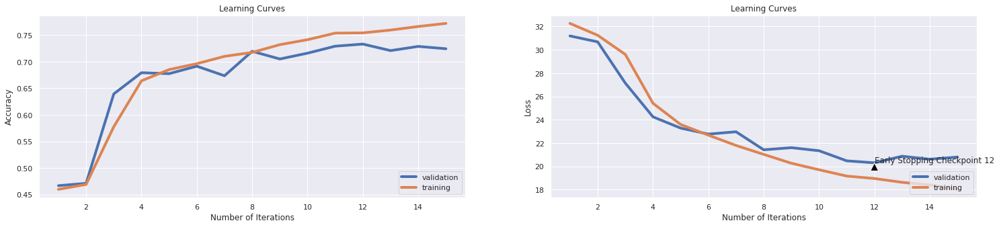

              precision    recall  f1-score
neutral        0.754325  0.818779  0.785232
antivax        0.553746  0.574324  0.563847
provax         0.746032  0.663409  0.702299
macro avg      0.684701  0.685504  0.683793
weighted avg   0.724961  0.724365  0.723045
Accuracy: 0.72436 

Total time: 158.10 seconds
Grid Search: 13, Layers: [230, 120, 50], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5766775162744117, 0.6705683525287932, 0.7016775162744117, 0.7356659989984977, 0.7558212318477716, 0.770405608412619, 0.7824236354531797, 0.7906234351527291, 0.7945042563845769, 0.7965698547821732, 0.800701051577366, 0.8010140210315473, 0.8025788683024537]
Validation accuracy scores: [0.6673970201577564, 0.6485539000876425, 0.724364592462752, 0.7256792287467134, 0.7300613496932515, 0.7239263803680982, 0.7309377738825592, 0.726555652936021, 0.7287467134092901, 0.7304995617879053, 0.7340052585451359, 0.728746713409290

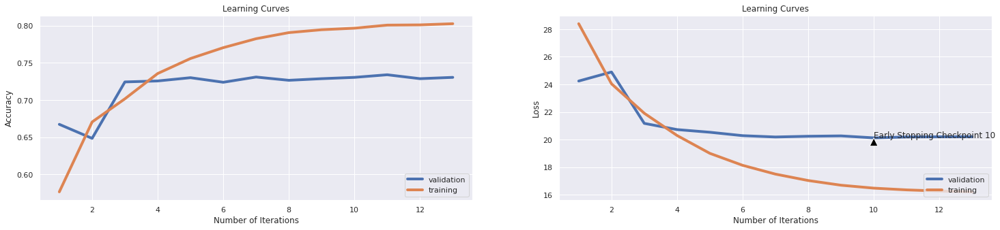

              precision    recall  f1-score
neutral        0.783708  0.785915  0.784810
antivax        0.601732  0.469595  0.527514
provax         0.702950  0.750271  0.725840
macro avg      0.696130  0.668594  0.679388
weighted avg   0.727510  0.730500  0.727636
Accuracy: 0.73050 

Total time: 62.73 seconds
Grid Search: 14, Layers: [230, 120, 50], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4574987481221833, 0.5259138708062093, 0.6458437656484727, 0.674449173760641, 0.6903480220330496, 0.7004256384576866, 0.7083124687030545, 0.7113169754631948, 0.7119429143715573, 0.7178267401101652, 0.7229594391587381, 0.7334126189283926, 0.7459939909864797, 0.7550075112669004, 0.7610165247871807, 0.7640836254381572, 0.769904857285929, 0.7733475212819229, 0.7804206309464197]
Validation accuracy scores: [0.46669588080631025, 0.619193689745837, 0.6726555652936022, 0.6617002629272568, 0.689307624890447, 0.6958808063102542, 0.6

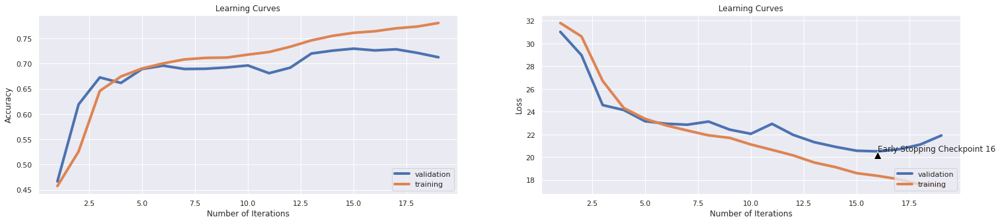

              precision    recall  f1-score
neutral        0.698341  0.869484  0.774571
antivax        0.761905  0.324324  0.454976
provax         0.727711  0.655809  0.689891
macro avg      0.729319  0.616539  0.639813
weighted avg   0.718439  0.712533  0.698940
Accuracy: 0.71253 

Total time: 66.39 seconds
Grid Search: 15, Layers: [230, 120, 50], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4668252378567852, 0.4695167751627441, 0.5832498748122183, 0.6690660991487231, 0.6896594892338508, 0.7013019529293941, 0.721957936905358, 0.739672008012018, 0.7538808212318477, 0.7607035553329995, 0.767463695543315, 0.7715948923385078, 0.7726589884827241, 0.7757886830245369]
Validation accuracy scores: [0.46669588080631025, 0.46669588080631025, 0.6446099912357581, 0.6752848378615249, 0.6814198071866784, 0.694127957931639, 0.7212971078001753, 0.7208588957055214, 0.7248028045574058, 0.6993865030674846, 0.7300613496932515

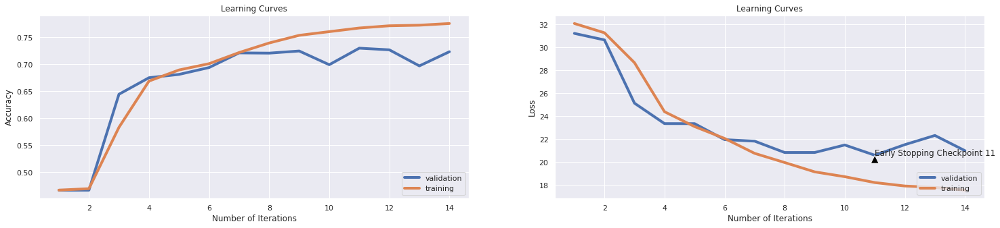

              precision    recall  f1-score
neutral        0.763345  0.805634  0.783920
antivax        0.526012  0.614865  0.566978
provax         0.752463  0.663409  0.705136
macro avg      0.680607  0.694636  0.685344
weighted avg   0.728169  0.723488  0.723983
Accuracy: 0.72349 

Total time: 56.99 seconds
Grid Search: 16, Layers: [690, 360, 150], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5878192288432649, 0.6659364046069104, 0.6981722583875813, 0.7301577366049073, 0.7502503755633451, 0.7669003505257886, 0.7806710065097646, 0.7868052078117176, 0.792563845768653, 0.7975087631447171, 0.8000125187781673, 0.8020155232849274]
Validation accuracy scores: [0.6025416301489921, 0.6840490797546013, 0.6976336546888694, 0.6980718667835232, 0.7239263803680982, 0.7318141980718668, 0.7318141980718668, 0.7344434706397897, 0.7322524101665207, 0.7318141980718668, 0.7348816827344434, 0.731375985977213]
Training f1 sco

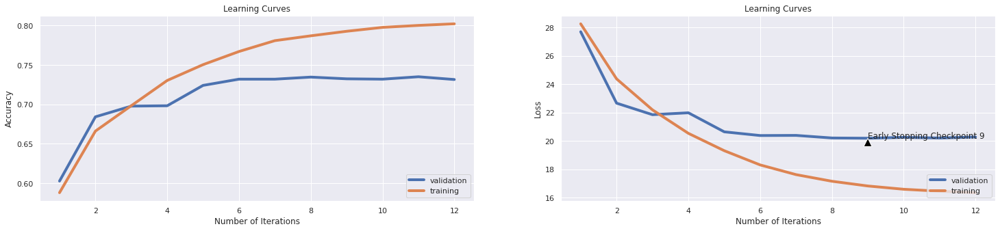

              precision    recall  f1-score
neutral        0.775846  0.796244  0.785913
antivax        0.600000  0.496622  0.543438
provax         0.713983  0.731813  0.722788
macro avg      0.696610  0.674893  0.684046
weighted avg   0.728070  0.731376  0.728985
Accuracy: 0.73138 

Total time: 144.60 seconds
Grid Search: 17, Layers: [690, 360, 150], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46300701051577364, 0.5102653980971458, 0.6395843765648472, 0.6705683525287932, 0.6880946419629445, 0.6975463194792189, 0.7056835252879319, 0.7116925388082124, 0.7115047571357036, 0.7243990986479719, 0.7387330996494742, 0.7471206810215323, 0.7565097646469705, 0.7648973460190286, 0.771156735102654, 0.7767901852779169, 0.7811091637456185, 0.7864922383575363, 0.7871181772658988, 0.7948798197295944, 0.7900600901352028, 0.7987606409614422]
Validation accuracy scores: [0.46669588080631025, 0.5692375109553024, 0.646362839614373

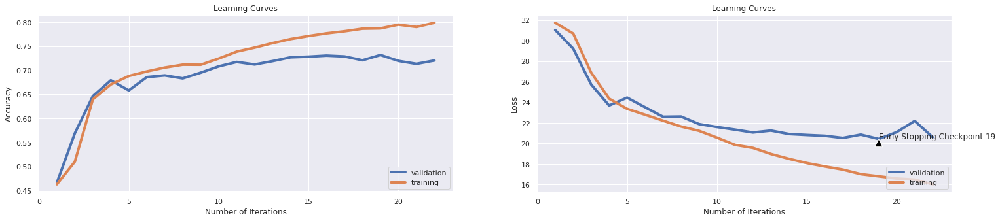

              precision    recall  f1-score
neutral        0.823718  0.723944  0.770615
antivax        0.606218  0.395270  0.478528
provax         0.655681  0.820847  0.729026
macro avg      0.695205  0.646687  0.659389
weighted avg   0.727687  0.720421  0.715943
Accuracy: 0.72042 

Total time: 224.91 seconds
Grid Search: 18, Layers: [690, 360, 150], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4631321982974462, 0.4761517275913871, 0.6024036054081122, 0.6739484226339509, 0.6935403104656985, 0.706434651977967, 0.7217701552328493, 0.7425513269904858, 0.7586379569354031, 0.7656484727090636, 0.76821482223335, 0.7724712068102153, 0.775350525788683, 0.7838632949424136, 0.7783550325488232]
Validation accuracy scores: [0.46669588080631025, 0.4964943032427695, 0.6503067484662577, 0.6822962313759859, 0.6871165644171779, 0.6967572304995618, 0.7239263803680982, 0.7379491673970202, 0.7304995617879053, 0.686240140227870

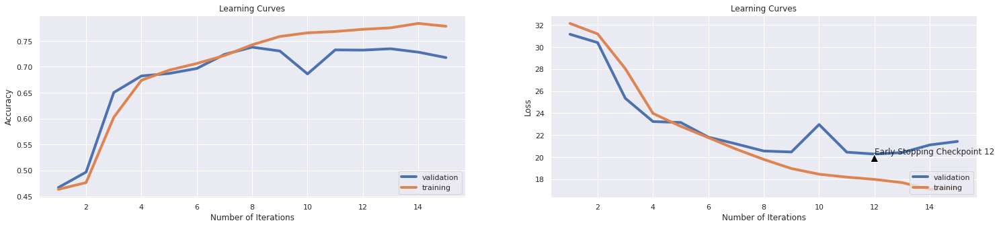

              precision    recall  f1-score
neutral        0.815514  0.730516  0.770679
antivax        0.757009  0.273649  0.401985
provax         0.638002  0.845820  0.727358
macro avg      0.736842  0.616662  0.633340
weighted avg   0.736282  0.717791  0.705371
Accuracy: 0.71779 

Total time: 174.82 seconds
Best grid is: Grid Search: 5, Layers: [675], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None


In [ ]:
param_grid = {
  'neurons': [[75], [675], [220, 90], [660, 270], [230, 120, 50], [690, 360, 150]],
  'activation_functions': ['ReLU'],
  'optimizers': ['SGD'],
  'loss_functions': ['CrossEntropy'],
  'learning_rates': [{'val': 1e-2, 'schelduler' : 'Exponential'}, {'val': 1e-3, 'schelduler' : None}, {'val' : 5e-6, 'schelduler' : 'OneCycle'}],
  'classes': ['neutral', 'antivax', 'provax'],
  'batch_size': 32,
  'epochs': 50,
  'early_stopping_patience': 3,
  'input_normalization' : False,
  'L2_reg': 0.1,
  'accuracy_threshold': 0.7
}

customGridSearch(param_grid, tfidf_training_set, tfidf_validation_set)

### **Activation function evaluation: ReLU vs SELU**

Grid Search: 1, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5857536304456685, 0.6742613920881322, 0.6907861792689034, 0.7013019529293941, 0.7082498748122183, 0.7128818227341012, 0.7167626439659489, 0.7199549323985979, 0.7221457185778668, 0.7204556835252879, 0.7221457185778668, 0.721457185778668, 0.7212694041061593, 0.7220205307961943, 0.7217701552328493, 0.7218953430145217, 0.7217701552328493, 0.7217701552328493, 0.721707561342013, 0.7218953430145217, 0.7218953430145217, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493, 0.7217701552328493]
Validation accuracy scores: [0.6419807186678352, 0.6748466257668712, 0.6831726555652936, 0.679666958808063

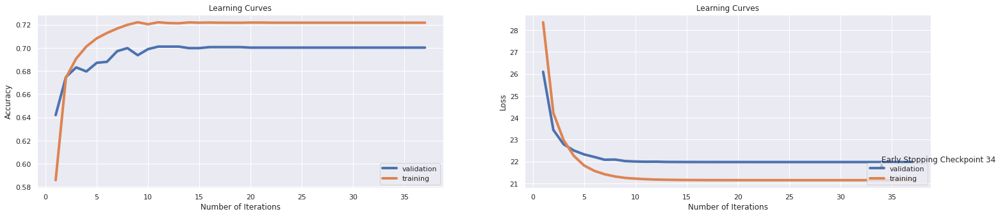

              precision    recall  f1-score
neutral        0.764075  0.802817  0.782967
antivax        0.723404  0.114865  0.198251
provax         0.635305  0.769815  0.696122
macro avg      0.707595  0.562499  0.559113
weighted avg   0.706829  0.700263  0.672073
Accuracy: 0.70026 

Total time: 71.80 seconds
Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46713820731096645, 0.4752754131196795, 0.543565348022033, 0.6082874311467201, 0.6475338007010516, 0.6599273910866299, 0.6676264396594892, 0.674949924887331, 0.6787681522283425, 0.6828993490235353, 0.6872809213820731, 0.6890961442163245, 0.693164747120681, 0.6964822233350025, 0.6967951927891838, 0.700550826239359, 0.7023660490736104, 0.704744616925388, 0.7088758137205808, 0.709877315973961, 0.7146970455683526, 0.716512268402604, 0.7193289934902354, 0.7220831246870305, 0.7258387581372058, 0.7250876314471708, 0.7287180771156735, 0.7307

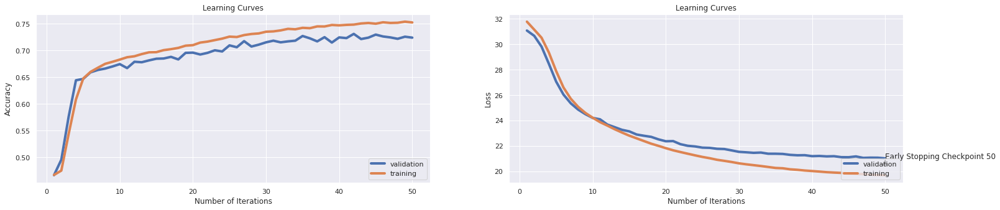

              precision    recall  f1-score
neutral        0.770197  0.805634  0.787517
antivax        0.732143  0.277027  0.401961
provax         0.674242  0.773073  0.720283
macro avg      0.725528  0.618578  0.636587
weighted avg   0.726535  0.723926  0.710371
Accuracy: 0.72393 

Total time: 95.31 seconds
Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4668252378567852, 0.4668252378567852, 0.49280170255383077, 0.5958938407611417, 0.6554832248372559, 0.6714446670005008, 0.6814596895343015, 0.6881572358537806, 0.6912869303955934, 0.6998622934401603, 0.7053705558337506, 0.7172008012018027, 0.7207060590886329, 0.724899849774662, 0.7294066099148723, 0.7350400600901352, 0.7377315973960942, 0.7405483224837256, 0.7439283925888833, 0.7407986980470707, 0.7434276414621933, 0.7476840260390586, 0.746807711567351, 0.7456184276414622, 0.7483099649474211, 0.7475588382573861]
Validation accura

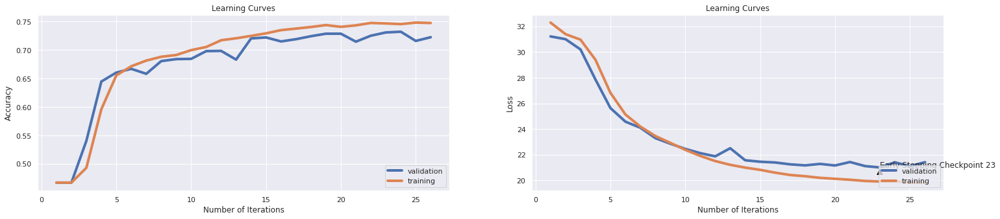

              precision    recall  f1-score
neutral        0.842623  0.723944  0.778788
antivax        0.687075  0.341216  0.455982
provax         0.636885  0.843648  0.725829
macro avg      0.722194  0.636269  0.653533
weighted avg   0.739412  0.722612  0.715543
Accuracy: 0.72261 

Total time: 54.26 seconds
Grid Search: 4, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6101652478718077, 0.6915998998497747, 0.7213945918878317, 0.7412368552829244, 0.7479969954932398, 0.7524411617426139, 0.7589509263895844, 0.7600150225338007, 0.7620806209313971, 0.7649599399098648, 0.7643340010015023, 0.7662744116174262, 0.7650851276915374, 0.7656484727090636, 0.7652103154732098, 0.7653355032548823, 0.7658988482724086]
Validation accuracy scores: [0.6853637160385626, 0.7169149868536372, 0.726555652936021, 0.6945661700262927, 0.7287467134092901, 0.7274320771253286, 0.7278702892199824, 0.7300613496932515, 0.7304

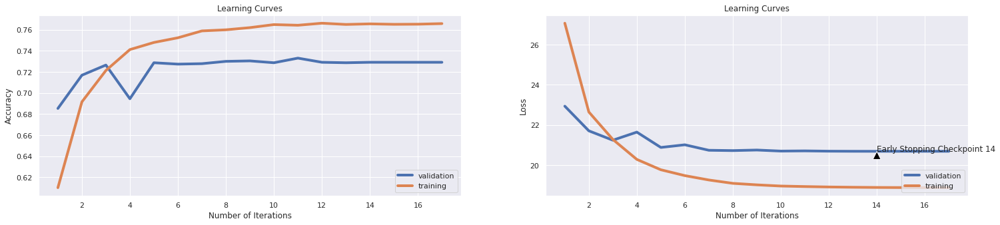

              precision    recall  f1-score
neutral        0.775862  0.802817  0.789109
antivax        0.692810  0.358108  0.472160
provax         0.684518  0.763301  0.721766
macro avg      0.717730  0.641409  0.661012
weighted avg   0.728224  0.729185  0.720818
Accuracy: 0.72918 

Total time: 33.94 seconds
Grid Search: 5, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.48378818227341014, 0.5918252378567852, 0.6499749624436655, 0.6703179769654481, 0.6758888332498748, 0.685778668002003, 0.6917876815222834, 0.6978592889334001, 0.7056209313970957, 0.7124436654982473, 0.7210816224336505, 0.7262143214822233, 0.7342263395092639, 0.7364171256885328, 0.7427391086629945, 0.746306960440661, 0.7491862794191287, 0.7520030045067602, 0.753192288432649, 0.7555082623935904, 0.7601402103154732, 0.761079118678017, 0.7629569354031046, 0.7634576865297947, 0.7671507260891337, 0.7670255383074612, 0.7675262894341512, 0.7

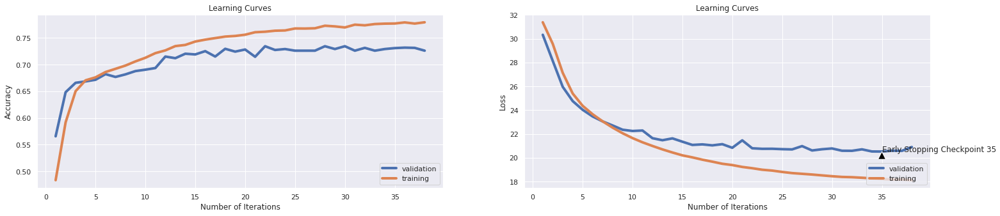

              precision    recall  f1-score
neutral        0.739783  0.832864  0.783569
antivax        0.605578  0.513514  0.555759
provax         0.741587  0.669924  0.703936
macro avg      0.695649  0.672100  0.681088
weighted avg   0.723103  0.725679  0.721880
Accuracy: 0.72568 

Total time: 74.62 seconds
Grid Search: 6, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.46745117676514775, 0.5314221331997997, 0.6447170756134202, 0.6705057586379569, 0.6854656985478217, 0.6944792188282424, 0.7101902854281422, 0.7213319979969955, 0.7343515272909364, 0.7384827240861291, 0.7505633450175263, 0.7493114672008012, 0.7516900350525789, 0.760578367551327]
Validation accuracy scores: [0.46669588080631025, 0.5753724802804557, 0.6595092024539877, 0.6757230499561788, 0.6836108676599474, 0.6862401402278703, 0.7011393514461, 0.7191060473269062, 0.7050832602979842, 0.7217353198948291, 0.7287467134092901, 0.7217353

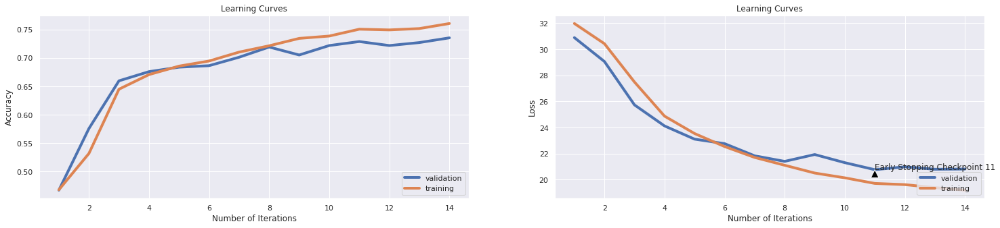

              precision    recall  f1-score
neutral        0.757082  0.828169  0.791031
antivax        0.645740  0.486486  0.554913
provax         0.729306  0.707926  0.718457
macro avg      0.710709  0.674194  0.688134
weighted avg   0.731430  0.735320  0.731114
Accuracy: 0.73532 

Total time: 31.37 seconds
Grid Search: 7, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5732974461692539, 0.6734476715072609, 0.696106659989985, 0.7260265398097145, 0.7411742613920881, 0.7555082623935904, 0.761579869804707, 0.7680896344516775, 0.7695918878317476, 0.7737230846269404, 0.7733475212819229, 0.7751627441161743, 0.7744742113169755, 0.7747871807711567, 0.7756009013520281, 0.7760390585878818, 0.776352028042063, 0.7760390585878818, 0.7762268402603906, 0.7760390585878818, 0.7762268402603906, 0.7761642463695543, 0.7762268402603906, 0.7761016524787181, 0.7762894341512269, 0.7762894341512269, 0.7762268402

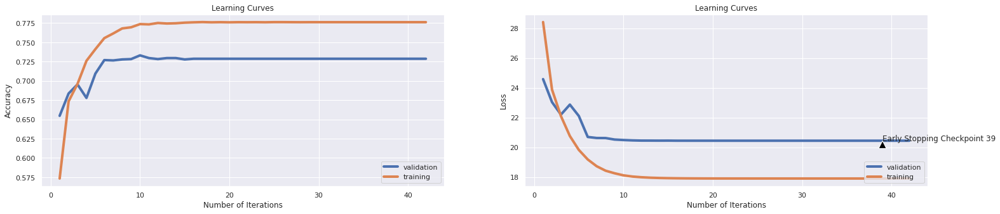

              precision    recall  f1-score
neutral        0.785714  0.784977  0.785345
antivax        0.680473  0.388514  0.494624
provax         0.678742  0.773073  0.722843
macro avg      0.714976  0.648854  0.667604
weighted avg   0.728890  0.728747  0.722410
Accuracy: 0.72875 

Total time: 143.55 seconds
Grid Search: 8, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46507260891337004, 0.5212193289934902, 0.6302578868302454, 0.6649349023535303, 0.677391086629945, 0.6880946419629445, 0.6945418127190787, 0.7025538307461192, 0.7086254381572359, 0.7135703555333, 0.7161992989484226, 0.7248372558838257, 0.7303455182774161, 0.7411742613920881, 0.7466825237856786, 0.7495618427641462, 0.7587631447170756, 0.7598898347521282, 0.7663370055082624, 0.7673385077616425, 0.7724086129193791, 0.7754757135703555, 0.7784176264396595, 0.7816725087631448, 0.7814221331997997, 0.7812969454181272, 0.786930395593390

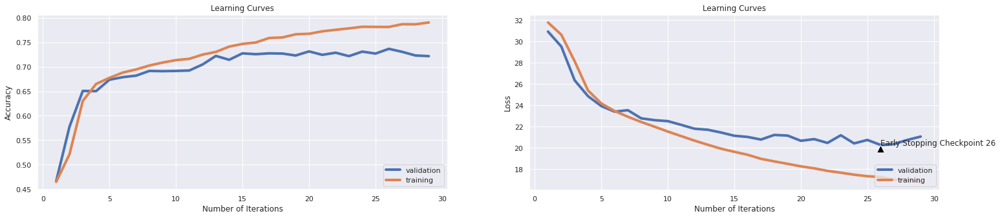

              precision    recall  f1-score
neutral        0.843115  0.701408  0.765761
antivax        0.574380  0.469595  0.516729
provax         0.659445  0.826276  0.733494
macro avg      0.692314  0.665760  0.671995
weighted avg   0.734129  0.721735  0.720436
Accuracy: 0.72174 

Total time: 98.21 seconds
Grid Search: 9, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4514271407110666, 0.46895343014521784, 0.5394967451176765, 0.6495368052078118, 0.6792063094641962, 0.6925388082123185, 0.7054957436154231, 0.7188282423635454, 0.7344767150726089, 0.7402979469203805, 0.7508137205808713, 0.7542563845768653, 0.756134201301953, 0.7662744116174262, 0.7687781672508763, 0.7692789183775663, 0.7702804206309464, 0.7764772158237356]
Validation accuracy scores: [0.46669588080631025, 0.46669588080631025, 0.6380368098159509, 0.6713409290096407, 0.684487291849255, 0.6770376862401403, 0.6669588080631026, 0

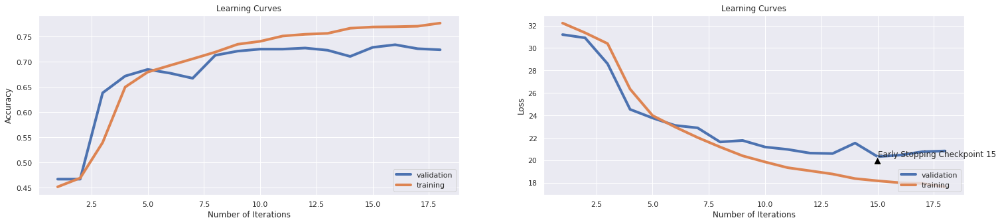

              precision    recall  f1-score
neutral        0.762456  0.804695  0.783006
antivax        0.543544  0.611486  0.575517
provax         0.743030  0.665581  0.702176
macro avg      0.683010  0.693921  0.686900
weighted avg   0.726220  0.723488  0.723470
Accuracy: 0.72349 

Total time: 71.41 seconds
Grid Search: 10, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6049699549323986, 0.6922258387581373, 0.7217701552328493, 0.7484977466199298, 0.764271407110666, 0.7791061592388583, 0.789121181772659, 0.793565348022033, 0.8003254882323485]
Validation accuracy scores: [0.6787905346187555, 0.7230499561787905, 0.7094653812445223, 0.7186678352322524, 0.7221735319894829, 0.7274320771253286, 0.7300613496932515, 0.726555652936021, 0.7269938650306749]
Training f1 scores: [0.539209497343364, 0.6709139225388846, 0.709510436791252, 0.740085508737488, 0.7587071299101263, 0.7738649189047992, 0.785

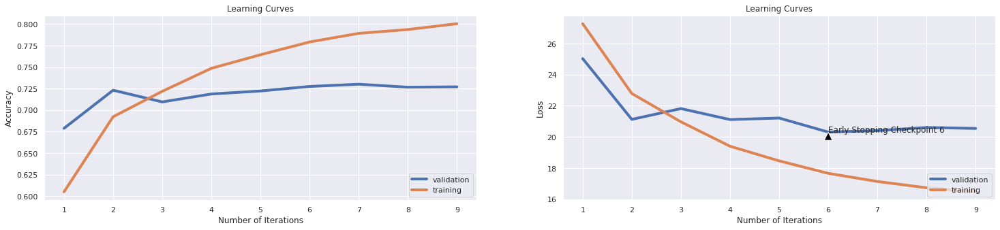

              precision    recall  f1-score
neutral        0.783144  0.776526  0.779821
antivax        0.597345  0.456081  0.517241
provax         0.697000  0.756786  0.725664
macro avg      0.692496  0.663131  0.674242
weighted avg   0.724277  0.726994  0.723904
Accuracy: 0.72699 

Total time: 32.64 seconds
Grid Search: 11, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4752754131196795, 0.6216825237856786, 0.6716950425638458, 0.6905983975963946, 0.6989859789684527, 0.7088132198297447, 0.724649474211317, 0.7368552829243866, 0.7476840260390586, 0.7580120180270405, 0.7613294942413621, 0.7663370055082624, 0.7732223335002504]
Validation accuracy scores: [0.5254163014899211, 0.6617002629272568, 0.6779141104294478, 0.6923751095530236, 0.6919368974583698, 0.6888694127957932, 0.708150744960561, 0.7090271691498685, 0.7296231375985978, 0.7256792287467134, 0.7269938650306749, 0.7195442594215601, 0.71297

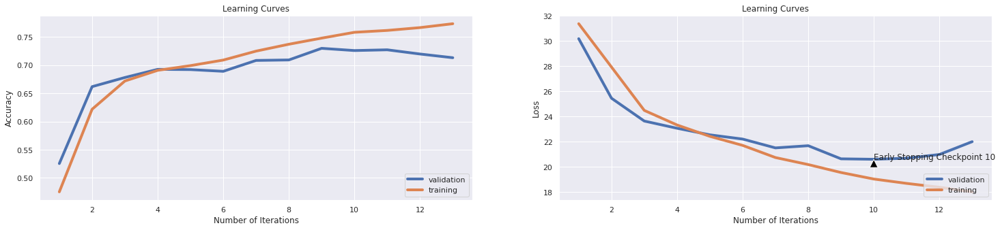

              precision    recall  f1-score
neutral        0.795977  0.780282  0.788051
antivax        0.446121  0.699324  0.544737
provax         0.760982  0.639522  0.694985
macro avg      0.667693  0.706376  0.675924
weighted avg   0.736473  0.712971  0.718930
Accuracy: 0.71297 

Total time: 44.02 seconds
Grid Search: 12, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4603154732098147, 0.5379318978467702, 0.6603655483224837, 0.6893465197796695, 0.7051201802704056, 0.7382323485227842, 0.7493740610916375, 0.7553204807210816, 0.7508763144717076, 0.7637080620931397, 0.7622058087130696, 0.7674011016524788, 0.76721331997997, 0.7655858788182274]
Validation accuracy scores: [0.46669588080631025, 0.6029798422436459, 0.677475898334794, 0.6849255039439088, 0.6744084136722174, 0.6958808063102542, 0.7186678352322524, 0.684487291849255, 0.731375985977213, 0.6932515337423313, 0.7304995617879053, 0.716

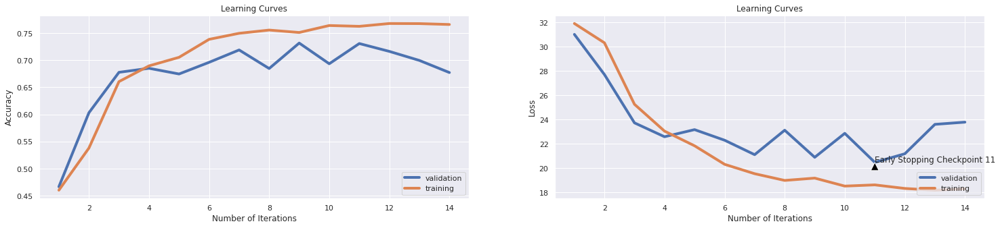

              precision    recall  f1-score
neutral        0.648374  0.898592  0.753247
antivax        0.595041  0.486486  0.535316
provax         0.787234  0.482085  0.597980
macro avg      0.676883  0.622388  0.628848
weighted avg   0.697499  0.677038  0.662314
Accuracy: 0.67704 

Total time: 55.04 seconds
Best grid is: Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None


In [ ]:
param_grid = {
  'neurons': [[75], [220, 90]],
  'activation_functions': ['ReLU', 'SELU'],
  'optimizers': ['SGD'],
  'loss_functions': ['CrossEntropy'],
  'learning_rates': [{'val': 1e-2, 'schelduler' : 'Exponential'}, {'val': 1e-3, 'schelduler' : None}, {'val' : 5e-6, 'schelduler' : 'OneCycle'}],
  'classes': ['neutral', 'antivax', 'provax'],
  'batch_size': 32,
  'epochs': 50,
  'early_stopping_patience': 3,
  'input_normalization' : False,
  'L2_reg': 0.1,
  'accuracy_threshold': 0.7
}

customGridSearch(param_grid, tfidf_training_set, tfidf_validation_set)

### **Optimizer evaluation : Stohastic Gradient Decent vs Nesterov Stohastic Gradient Decent vs Adadelta vs Adam (2 SGDs vs 2 Adaptives)**

Grid Search: 1, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5838132198297447, 0.6753254882323485, 0.6934777165748623, 0.7039934902353531, 0.7154481722583875, 0.717513770655984, 0.7220831246870305, 0.7226464697045568, 0.7238983475212819, 0.7240235353029544, 0.7252128192288433, 0.7253380070105158, 0.7259013520280421, 0.7259013520280421, 0.7257761642463696, 0.7257761642463696, 0.7259639459188784, 0.7259639459188784, 0.725650976464697, 0.7257761642463696, 0.7259639459188784, 0.7257761642463696, 0.7258387581372058, 0.7259013520280421, 0.7258387581372058, 0.7259013520280421, 0.7258387581372058, 0.7258387581372058, 0.7258387581372058, 0.7258387581372058, 0.7258387581372058, 0.7258387581372058, 0.7258387581372058, 0.7258387581372058, 0.7258387581372058, 0.7258387581372058]
Validation accuracy scores: [0.6665205959684487, 0.6503067484662577, 0.6840490797546013, 0.6936897458369851, 0.694566170026292

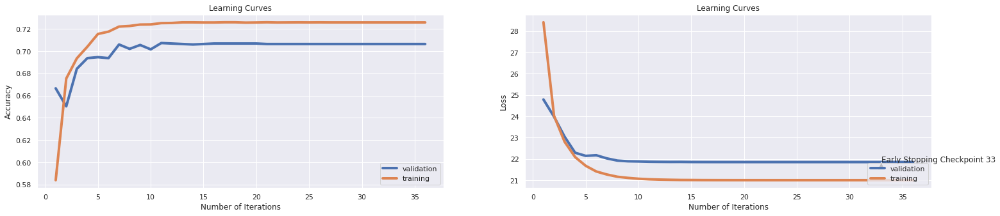

              precision    recall  f1-score
neutral        0.765179  0.804695  0.784439
antivax        0.728814  0.145270  0.242254
provax         0.645512  0.773073  0.703557
macro avg      0.713168  0.574346  0.576750
weighted avg   0.712165  0.706398  0.681469
Accuracy: 0.70640 

Total time: 70.20 seconds
Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46538557836755134, 0.4695793690535804, 0.51821482223335, 0.5937030545818728, 0.6392088132198297, 0.6588007010515774, 0.6658112168252378, 0.672258387581372, 0.6770781171757636, 0.6807711567351027, 0.6863420130195292, 0.6886579869804708, 0.6922258387581373, 0.6944166249374061, 0.6964822233350025, 0.6999248873309964, 0.7017401101652478, 0.7029293940911367, 0.706685027541312, 0.7088758137205808, 0.7119429143715573, 0.7163244867300952, 0.7180771156735103, 0.7202679018527791, 0.722458688032048, 0.7266524787180771, 0.7281547320981472, 0.72

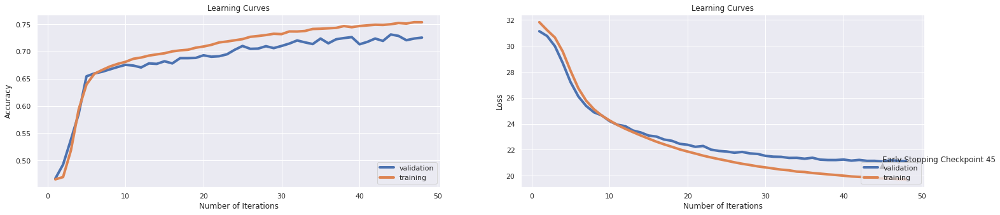

              precision    recall  f1-score
neutral        0.801564  0.769953  0.785441
antivax        0.750000  0.273649  0.400990
provax         0.655083  0.818675  0.727799
macro avg      0.735549  0.620759  0.638077
weighted avg   0.735757  0.725241  0.712310
Accuracy: 0.72524 

Total time: 93.21 seconds
Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4668252378567852, 0.46713820731096645, 0.5291061592388583, 0.6243114672008012, 0.6551076614922383, 0.6721957936905358, 0.6841512268402604, 0.689471707561342, 0.6955433149724587, 0.7026164246369554, 0.707185778668002, 0.7178267401101652, 0.721457185778668, 0.7271532298447672, 0.7310340510766149, 0.735227841762644, 0.7400475713570356, 0.7404857285928893, 0.7416124186279419, 0.7456184276414622, 0.7474336504757135, 0.7454306459689535, 0.7453680520781172, 0.747308462694041, 0.7496244366549825]
Validation accuracy scores: [0.466695880

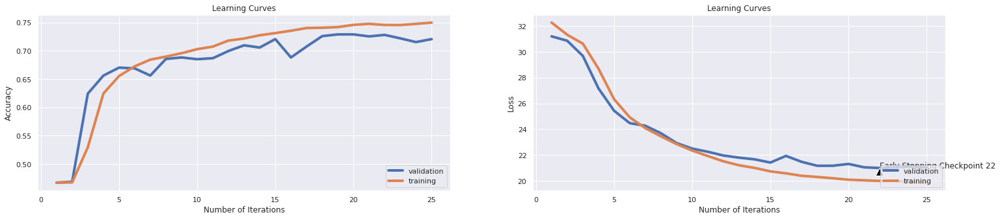

              precision    recall  f1-score
neutral        0.736842  0.841315  0.785620
antivax        0.714286  0.304054  0.426540
provax         0.700000  0.714441  0.707147
macro avg      0.717043  0.619936  0.639769
weighted avg   0.719047  0.720421  0.707372
Accuracy: 0.72042 

Total time: 53.32 seconds
Grid Search: 4, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6366424636955433, 0.6803329994992489, 0.6911617426139208, 0.7113169754631948, 0.7203930896344517, 0.7309714571857787, 0.7401101652478718, 0.7469954932398598, 0.75100150225338, 0.753192288432649, 0.7565097646469705, 0.7570105157736605, 0.7570731096644967, 0.760828743114672, 0.760077616424637, 0.7593264897346019, 0.7584501752628944, 0.7598272408612919, 0.7593890836254381, 0.7598272408612919, 0.7597646469704556]
Validation accuracy scores: [0.6809815950920245, 0.6511831726555652, 0.689307624890447, 0.663453111305872, 0.71866

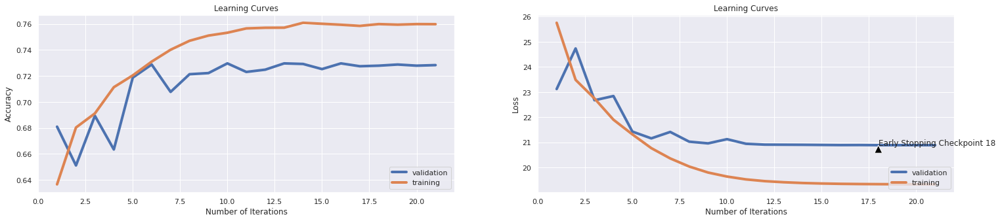

              precision    recall  f1-score
neutral        0.772401  0.809390  0.790463
antivax        0.718750  0.310811  0.433962
provax         0.682081  0.768730  0.722818
macro avg      0.724411  0.629643  0.649081
weighted avg   0.728990  0.728309  0.716920
Accuracy: 0.72831 

Total time: 51.47 seconds
Grid Search: 5, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.5872558838257386, 0.6806459689534301, 0.6982974461692539, 0.714321482223335, 0.7262769153730596, 0.728843264897346, 0.7297195793690536, 0.7321607411116675, 0.7362919379068603, 0.7341637456184277, 0.7341011517275914, 0.7315973960941412]
Validation accuracy scores: [0.6621384750219106, 0.6656441717791411, 0.6989482909728308, 0.7160385626643295, 0.717353198948291, 0.7217353198948291, 0.7182296231375986, 0.7164767747589833, 0.7261174408413672, 0.724364592462752, 0.7138475021910605, 0.733567046450482]
Training f1 scores: [0.50494106

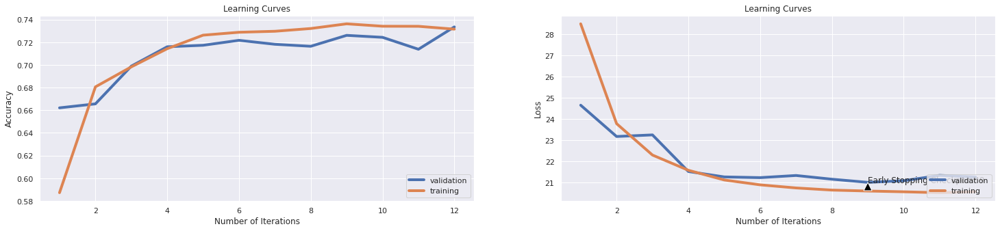

              precision    recall  f1-score
neutral        0.757913  0.831925  0.793196
antivax        0.670157  0.432432  0.525667
provax         0.715835  0.716612  0.716224
macro avg      0.714635  0.660323  0.678362
weighted avg   0.729548  0.733567  0.727429
Accuracy: 0.73357 

Total time: 29.58 seconds
Grid Search: 6, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4592513770655984, 0.46688783174762144, 0.53542814221332, 0.6211817726589884, 0.6580495743615423, 0.6736354531797697, 0.6854031046569855, 0.6925388082123185, 0.6945418127190787, 0.7036179268903355, 0.7100650976464697, 0.7186404606910366, 0.7237105658487731, 0.7278417626439659, 0.73228592889334, 0.7379193790686029, 0.739672008012018, 0.7428017025538307, 0.7432398597896845, 0.7461191787681523, 0.7480595893840761, 0.7478718077115674, 0.7486229344016024, 0.753192288432649, 0.7508137205808713, 0.752691537305959, 0.752128192288432

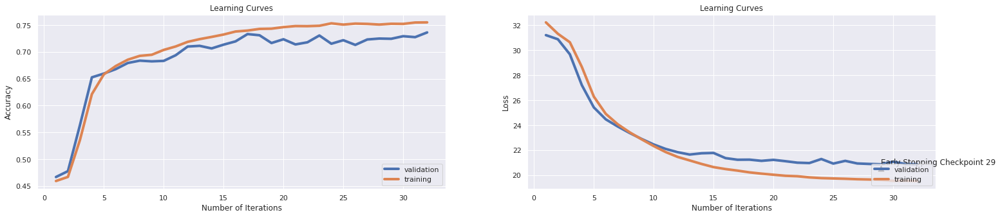

              precision    recall  f1-score
neutral        0.772566  0.819718  0.795444
antivax        0.714286  0.371622  0.488889
provax         0.698397  0.756786  0.726420
macro avg      0.728416  0.649375  0.670251
weighted avg   0.735072  0.736196  0.727823
Accuracy: 0.73620 

Total time: 71.98 seconds
Grid Search: 7, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.4668252378567852, 0.4716449674511768, 0.4858537806710065, 0.5005633450175263, 0.5236604907361042, 0.5492613920881322, 0.5690410615923885, 0.5940160240360541, 0.6116675012518779, 0.6285052578868302, 0.6393965948923385, 0.6470330495743616, 0.6527290936404607, 0.6593640460691037, 0.6623059589384076, 0.6660615923885829, 0.6679394091136706, 0.6693790686029043, 0.6719454181271908, 0.671757636454682, 0.6730095142714071, 0.6735728592889334, 0.674449173760641, 0.674449173760641, 0.6750751126690036, 0.6762643965948923, 0.6762643965948923,

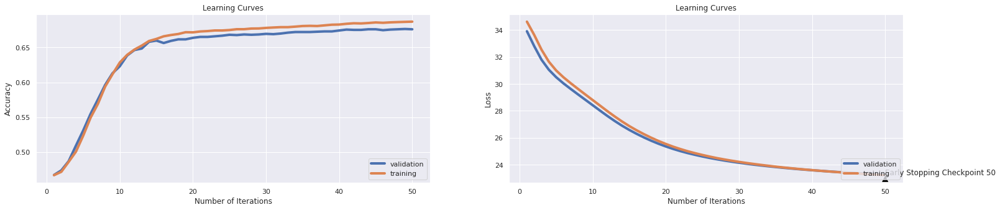

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.744551  0.801878  0.772152
antivax        0.000000  0.000000  0.000000
provax         0.607048  0.748100  0.670233
macro avg      0.450533  0.516659  0.480795
weighted avg   0.592480  0.676161  0.630862
Accuracy: 0.67616 

Total time: 141.39 seconds
Grid Search: 8, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.40348022033049574, 0.4108037055583375, 0.414872308462694, 0.41606159238858287, 0.4225087631447171, 0.42839258888

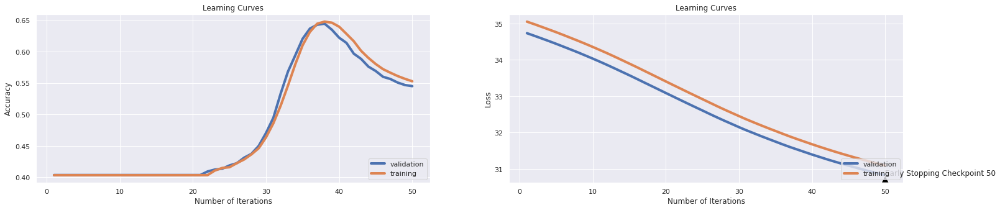

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.517884  0.965258  0.674098
antivax        0.000000  0.000000  0.000000
provax         0.727273  0.234528  0.354680
macro avg      0.415052  0.399929  0.342926
weighted avg   0.535217  0.545136  0.457745
Accuracy: 0.54514 

Total time: 138.02 seconds
Grid Search: 9, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.45968953430145215, 0.4598773159739609, 0.4599399098647972, 0.4599399098647972, 0.46000250375563345, 0.4600650976464697, 0.4600650976464697, 0.46000250375563345, 0.4600650976464697, 0.460127691537306, 0.46000250375563345, 0.4600650976464697, 0.4601902854281422, 0.4601902854281422, 0.46025287931897846, 0.46025287931897846, 0.4603154732098147, 0.4603154732098147, 0.46050325488232347, 0.460628442663996, 0.4607536304456685, 0.46081622433650477, 0.460878818227341, 0.46100400600901353, 0.461129193790686, 0.461129193790686, 0.46112919

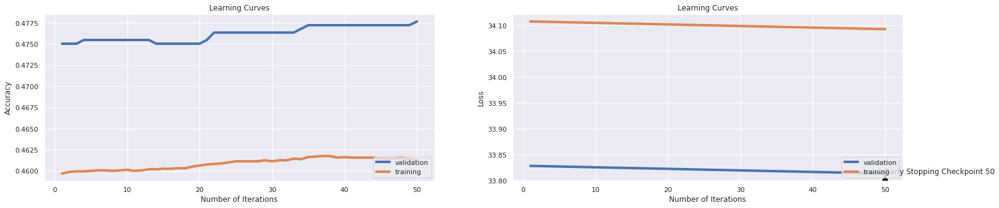

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.487242  0.753052  0.591664
antivax        0.000000  0.000000  0.000000
provax         0.452830  0.312704  0.369942
macro avg      0.313357  0.355252  0.320535
weighted avg   0.410153  0.477651  0.425433
Accuracy: 0.47765 

Total time: 138.62 seconds
Grid Search: 10, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.6542939409113671, 0.6670630946419629, 0.6787681522283425, 0.6877816725087631, 0.6881572358537806, 0.6922884326489734, 0.7025538307461192, 0.6989233850776164, 0.6979844767150726, 0.7021782674011017, 0.7001752628943415, 0.7024286429644466, 0.7043690535803706]
Validation accuracy scores: [0.6669588080631026, 0.6858019281332165, 0.6888694127957932, 0.6928133216476775, 0.7007011393514461, 0.7015775635407537, 0.7094653812445223, 0.7077125328659071, 0.7090271691498685, 0.703330411919369, 0.7107800175284837, 0.7160385626643295, 0.70289219

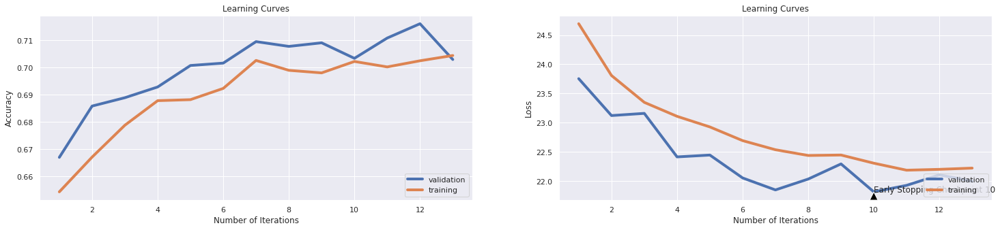

              precision    recall  f1-score
neutral        0.732323  0.816901  0.772304
antivax        0.674603  0.287162  0.402844
provax         0.670455  0.704669  0.687136
macro avg      0.692460  0.602911  0.620761
weighted avg   0.699867  0.702892  0.690008
Accuracy: 0.70289 

Total time: 58.70 seconds
Grid Search: 11, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6366424636955433, 0.6895968953430145, 0.704243865798698, 0.7131321982974461, 0.7187656484727091, 0.7208938407611417, 0.721707561342013, 0.7228968452679019, 0.721206810215323, 0.7238357536304457]
Validation accuracy scores: [0.6875547765118317, 0.696319018404908, 0.7116564417177914, 0.7125328659070991, 0.7138475021910605, 0.7221735319894829, 0.724364592462752, 0.7234881682734443, 0.7199824715162139, 0.7283085013146363]
Training f1 scores: [0.5828232790285874, 0.6473923560895141, 0.671835258136271, 0.6879665735425944, 0.695790211726

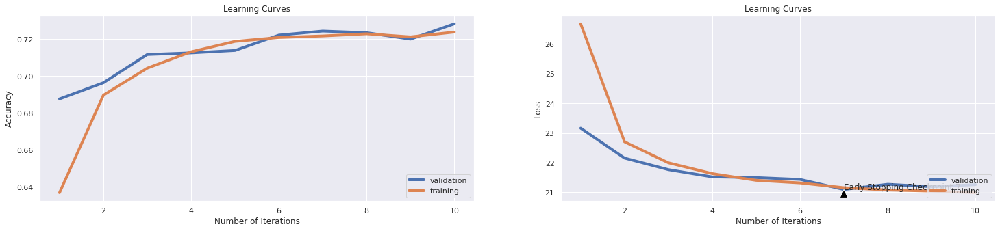

              precision    recall  f1-score
neutral        0.808300  0.768075  0.787675
antivax        0.725806  0.304054  0.428571
provax         0.657941  0.818675  0.729560
macro avg      0.730683  0.630268  0.648602
weighted avg   0.736916  0.728309  0.717640
Accuracy: 0.72831 

Total time: 33.30 seconds
Grid Search: 12, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.44986229344016027, 0.47815473209814724, 0.49655733600400603, 0.5079494241362043, 0.514271407110666, 0.5169003505257886, 0.5188407611417125, 0.521156735102654, 0.5232223335002504, 0.5256634952428643, 0.5259764646970456, 0.5301702553830746, 0.5314221331997997, 0.536179268903355, 0.5389959939909865, 0.5409989984977466, 0.5438783174762143, 0.5463194792188283, 0.5463194792188283, 0.550701051577366, 0.5513895843765648, 0.5542689033550325, 0.5546444667000501, 0.5561467200801202, 0.5592764146219329, 0.5604656985478217, 0.5640335503254882,

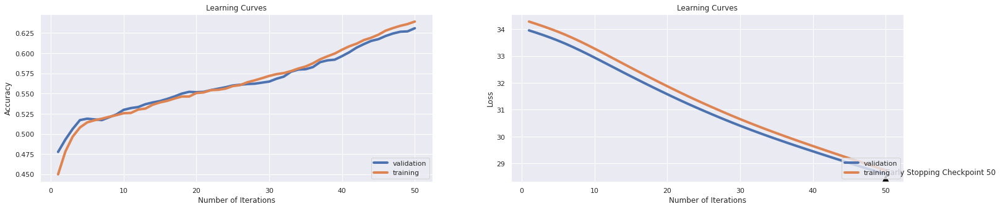

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.613065  0.916432  0.734663
antivax        0.000000  0.000000  0.000000
provax         0.672464  0.503800  0.576040
macro avg      0.428510  0.473411  0.436901
weighted avg   0.557517  0.631025  0.575350
Accuracy: 0.63103 

Total time: 155.30 seconds
Grid Search: 13, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5744867300951427, 0.6742613920881322, 0.7078117175763645, 0.7310966449674512, 0.7487481221832749, 0.7599524286429644, 0.7644591887831748, 0.7684026039058588, 0.7751627441161743, 0.776352028042063, 0.776352028042063, 0.7783550325488232, 0.7784802203304958, 0.7784802203304958, 0.7797946920380571, 0.7794817225838758, 0.7787305958938407, 0.7792313470205308, 0.7794191286930395, 0.7796695042563846, 0.7797320981472209, 0.7796069103655483, 0.7795443164747121, 0.7796069103655483, 0.7795443164747121, 0.7795443164747121, 0.7796069

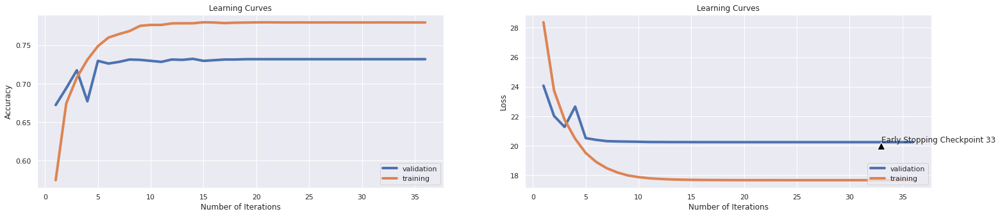

              precision    recall  f1-score
neutral        0.787594  0.786854  0.787224
antivax        0.657609  0.408784  0.504167
provax         0.687621  0.771987  0.727366
macro avg      0.710941  0.655875  0.672919
weighted avg   0.730385  0.731814  0.726350
Accuracy: 0.73181 

Total time: 119.76 seconds
Grid Search: 14, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4631947921882824, 0.49549323985978966, 0.5935778668002003, 0.6539809714571858, 0.6718828242363545, 0.6841512268402604, 0.6937280921382073, 0.699298948422634, 0.7066224336504757, 0.7116925388082124, 0.7117551326990486, 0.7178267401101652, 0.7208938407611417, 0.7257761642463696, 0.7341011517275914, 0.7393590385578368, 0.7497496244366549, 0.758137205808713, 0.7605157736604907, 0.7638332498748123, 0.7672759138708062, 0.7705933900851277, 0.7717826740110165, 0.7768527791687532]
Validation accuracy scores: [0.4697633654688869, 0.501

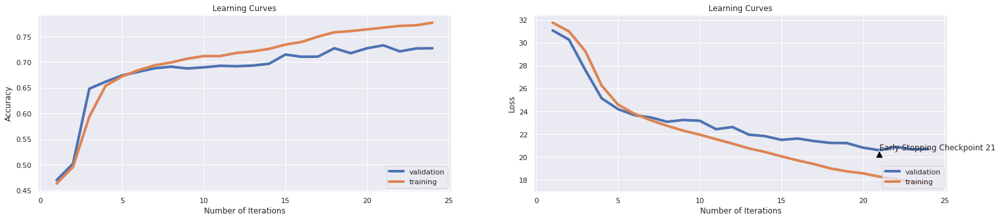

              precision    recall  f1-score
neutral        0.745577  0.830986  0.785968
antivax        0.643836  0.476351  0.547573
provax         0.722603  0.687296  0.704508
macro avg      0.704005  0.664878  0.679349
weighted avg   0.723108  0.726994  0.722169
Accuracy: 0.72699 

Total time: 79.48 seconds
Grid Search: 15, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4640085127691537, 0.47014271407110664, 0.5732348522784176, 0.6604907361041562, 0.6779544316474712, 0.6986730095142714, 0.7022408612919379, 0.714321482223335, 0.7334126189283926, 0.741862794191287, 0.7498748122183275, 0.7590135202804207, 0.7656484727090636, 0.76871557336004, 0.767964446670005, 0.7705933900851277, 0.7683400100150225, 0.7750375563345018]
Validation accuracy scores: [0.46669588080631025, 0.485977212971078, 0.6415425065731815, 0.6735319894829097, 0.6871165644171779, 0.6910604732690623, 0.686678352322524, 0.7191

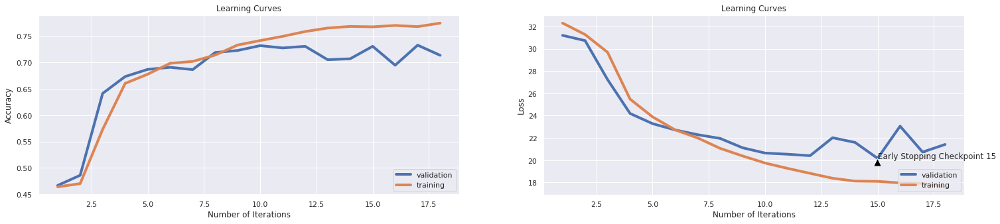

              precision    recall  f1-score
neutral        0.724719  0.847887  0.781480
antivax        0.539877  0.594595  0.565916
provax         0.774648  0.597177  0.674433
macro avg      0.679748  0.679886  0.673943
weighted avg   0.720894  0.713848  0.710316
Accuracy: 0.71385 

Total time: 67.55 seconds
Grid Search: 16, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.507135703555333, 0.4482974461692539, 0.45148973460190284, 0.45505758637956933, 0.45862543815723583, 0.46263144717075616, 0.4651352028042063, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852]
Validation accuracy scores: [0.46669588080631025, 0.46669588080631025, 0.46669588080631025, 0.46669588080631025, 0.46669588080631025, 0.46669588080631025, 0.46669588080631025, 0.46669588080631025, 0.46669588080631025, 0.46669588080631025, 0

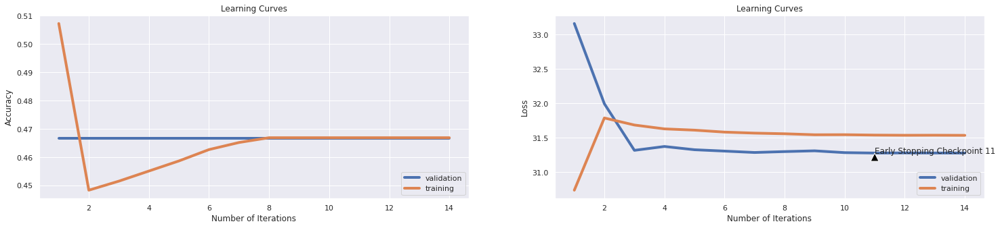

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.466696  1.000000  0.636391
antivax        0.000000  0.000000  0.000000
provax         0.000000  0.000000  0.000000
macro avg      0.155565  0.333333  0.212130
weighted avg   0.217805  0.466696  0.297001
Accuracy: 0.46670 

Total time: 60.88 seconds
Grid Search: 17, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6057210816224337, 0.6942288432648973, 0.720956434651978, 0.7349148723084626, 0.7406109163745619, 0.7459939909864797]
Validation accuracy scores: [0.6783523225241017, 0.6879929886064855, 0.726555652936021, 0.71034180543383, 0.7182296231375986, 0.7191060473269062]
Training f1 scores: [0.5352279654960341, 0.6532526900668125, 0.7012917596759892, 0.7228149614316062, 0.7297166551926716, 0.735438459039618]
Validation f1 scores: [0.637352235672056, 0.6722132949721833, 0.7247776126869997, 0.6880697889369196, 0.707808595720715, 0.7

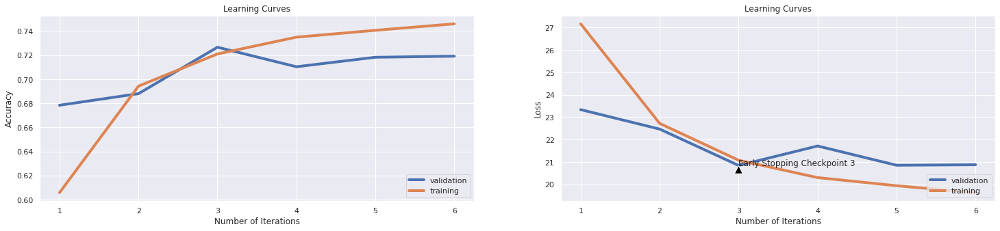

              precision    recall  f1-score
neutral        0.734491  0.833803  0.781003
antivax        0.592885  0.506757  0.546448
provax         0.735366  0.654723  0.692705
macro avg      0.687581  0.665094  0.673385
weighted avg   0.716476  0.719106  0.714942
Accuracy: 0.71911 

Total time: 25.68 seconds
Grid Search: 18, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4618803204807211, 0.46864046069103654, 0.5734852278417626, 0.6617426139208813, 0.6847771657486229, 0.7006134201301953, 0.706685027541312, 0.7215823735603405, 0.7368552829243866, 0.7533174762143214, 0.7596394591887832, 0.7632073109664497, 0.7672759138708062, 0.770906359539309, 0.76921632448673]
Validation accuracy scores: [0.46669588080631025, 0.4991235758106924, 0.6397896581945661, 0.6638913234005258, 0.6687116564417178, 0.6875547765118317, 0.6910604732690623, 0.7217353198948291, 0.7182296231375986, 0.7269938650306749

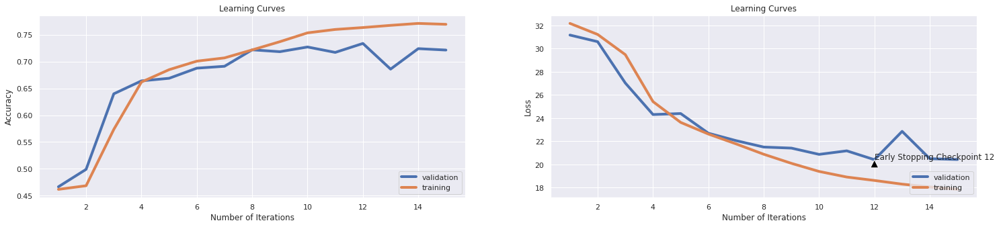

              precision    recall  f1-score
neutral        0.806680  0.748357  0.776425
antivax        0.662577  0.364865  0.470588
provax         0.655172  0.804560  0.722222
macro avg      0.708143  0.639261  0.656412
weighted avg   0.726841  0.721297  0.714879
Accuracy: 0.72130 

Total time: 65.47 seconds
Grid Search: 19, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.45950175262894344, 0.4668252378567852, 0.4668252378567852, 0.48072108162243365, 0.5439409113670506, 0.6106034051076615, 0.6462819228843265, 0.6594892338507762, 0.6659364046069104, 0.6696920380570857, 0.6727591387080621, 0.6751377065598397, 0.6771407110665999, 0.6789559339008513, 0.681835252879319, 0.6840260390585878, 0.6867175763645468, 0.6882198297446169, 0.6890335503254882, 0.6902228342513771, 0.6902854281422133, 0.6919754631947922, 0.6939158738107161, 0.6927891837756635, 0.6946670005007511, 0.6947295943915874, 0.6952929

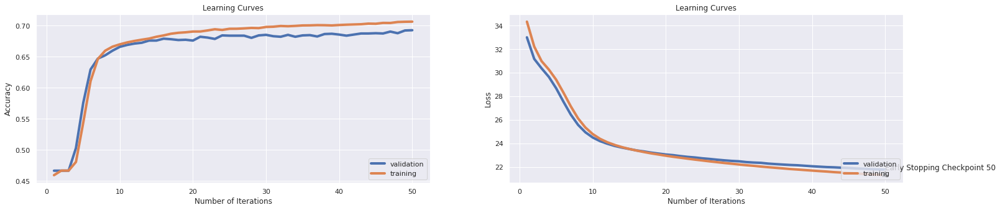

              precision    recall  f1-score
neutral        0.773985  0.787793  0.780828
antivax        0.600000  0.040541  0.075949
provax         0.618846  0.791531  0.694616
macro avg      0.664277  0.539955  0.517131
weighted avg   0.688804  0.692375  0.654603
Accuracy: 0.69238 

Total time: 297.98 seconds
Grid Search: 20, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46713820731096645, 0.467263395092639, 0.46713820731096645, 0.46688783174762144, 0.46688783174762144, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.46688783174762144, 0.46688783174762144, 0.46688783174762144, 0.4670130195292939, 0.4672008012018027, 0.4678893340010015, 0.4683274912368553, 0.

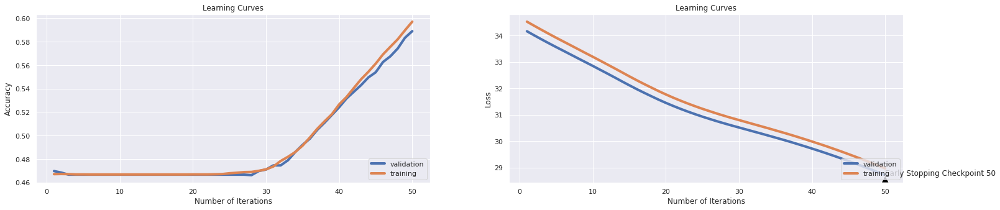

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.569045  0.928638  0.705672
antivax        0.000000  0.000000  0.000000
provax         0.652574  0.385451  0.484642
macro avg      0.407206  0.438030  0.396771
weighted avg   0.528945  0.588957  0.524933
Accuracy: 0.58896 

Total time: 299.59 seconds
Grid Search: 21, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.3992864296444667, 0.4006634952428643, 0.40141462193289934, 0.40304206309464197, 0.40398097145718576, 0.40529544316474714, 0.4065473209814722, 0.407486229344016, 0.40911367050575864, 0.4095518277416124, 0.41117926890335504, 0.41249374061091637, 0.41374561842764146, 0.4151226840260391, 0.4159364046069104, 0.4186905358037056, 0.42213319979969954, 0.42338507761642463, 0.4246369554331497, 0.42545067601402103, 0.4261392088132198, 0.42732849273910867, 0.4279544316474712, 0.4294566850275413, 0.4302078117175764, 0.430771156735102

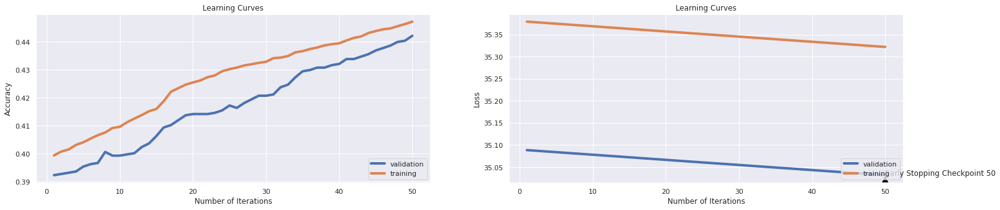

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.470504  0.921127  0.622857
antivax        0.142132  0.094595  0.113590
provax         0.000000  0.000000  0.000000
macro avg      0.204212  0.338574  0.245482
weighted avg   0.238018  0.442156  0.305419
Accuracy: 0.44216 

Total time: 295.88 seconds
Grid Search: 22, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.650100150225338, 0.6923510265398097, 0.702741612418628, 0.7080620931397096, 0.7117551326990486, 0.7088132198297447, 0.7105658487731598, 0.7113169754631948, 0.7141962944416625, 0.7174511767651477, 0.7081246870305459]
Validation accuracy scores: [0.6985100788781771, 0.7024539877300614, 0.6919368974583698, 0.7125328659070991, 0.6998247151621385, 0.7160385626643295, 0.7160385626643295, 0.7142857142857143, 0.7099035933391762, 0.7252410166520596, 0.7191060473269062]
Training f1 scores: [0.6126238113543119, 0.6768625021097412, 0.689

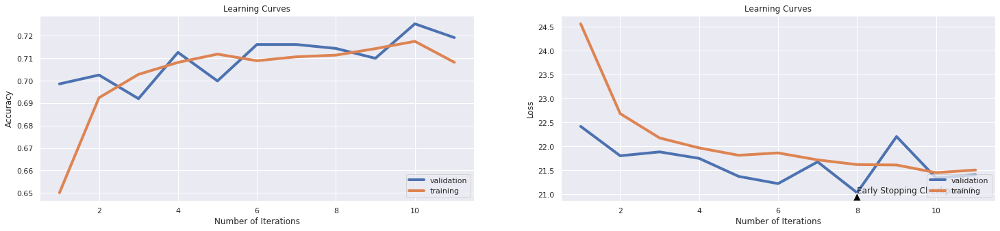

              precision    recall  f1-score
neutral        0.785714  0.764319  0.774869
antivax        0.556452  0.466216  0.507353
provax         0.690381  0.748100  0.718082
macro avg      0.677516  0.659545  0.666768
weighted avg   0.717500  0.719106  0.717251
Accuracy: 0.71911 

Total time: 177.47 seconds
Grid Search: 23, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6444667000500751, 0.7124436654982473, 0.7247746619929895, 0.7300325488232349, 0.7374812218327491, 0.7493740610916375, 0.7570105157736605, 0.765272909364046, 0.7719704556835253, 0.7786680020030045, 0.7860540811216825]
Validation accuracy scores: [0.7085889570552147, 0.717353198948291, 0.7169149868536372, 0.7212971078001753, 0.7204206836108676, 0.7326906222611744, 0.726555652936021, 0.7309377738825592, 0.7300613496932515, 0.7287467134092901, 0.7221735319894829]
Training f1 scores: [0.5944513239099644, 0.6985874872706206, 0.713

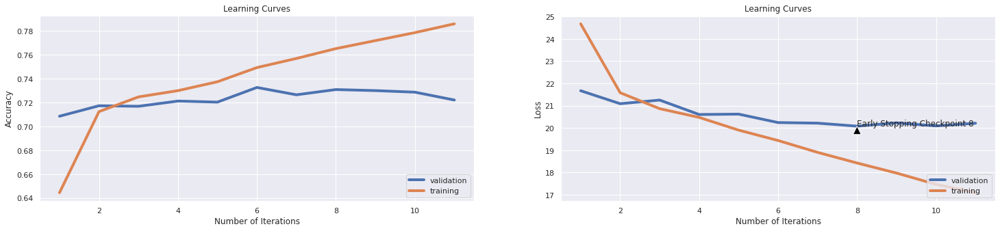

              precision    recall  f1-score
neutral        0.796477  0.764319  0.780067
antivax        0.594340  0.425676  0.496063
provax         0.675573  0.768730  0.719147
macro avg      0.688797  0.652908  0.665092
weighted avg   0.721462  0.722174  0.718642
Accuracy: 0.72217 

Total time: 109.72 seconds
Grid Search: 24, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.40373059589384075, 0.4219454181271908, 0.4570605908863295, 0.5438783174762143, 0.6237481221832749, 0.5759889834752128, 0.5269153730595894, 0.49580620931397096, 0.4839133700550826, 0.4815973960941412, 0.48347521281922884, 0.4859163745618428, 0.49317726589884825, 0.5032548823234853, 0.5167125688532799, 0.528542814221332, 0.5473209814722083, 0.5609664496745118, 0.5791812719078618, 0.5961442163244868, 0.6077240861291938, 0.625, 0.635828743114672, 0.6

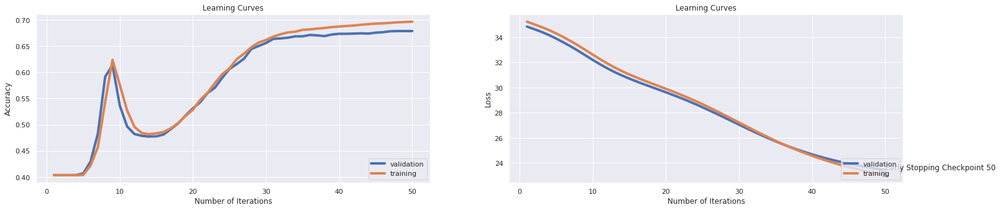

              precision    recall  f1-score
neutral        0.762849  0.794366  0.778289
antivax        0.000000  0.000000  0.000000
provax         0.599318  0.763301  0.671442
macro avg      0.454056  0.519222  0.483244
weighted avg   0.597899  0.678791  0.634214
Accuracy: 0.67879 

Total time: 343.96 seconds
Best grid is: Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
param_grid = {
  'neurons': [[75], [220, 90]],
  'activation_functions': ['ReLU'],
  'optimizers': ['SGD', 'Nesterov', 'Adadelta', 'Adam'],
  'loss_functions': ['CrossEntropy'],
  'learning_rates': [{'val': 1e-2, 'schelduler' : 'Exponential'}, {'val': 1e-3, 'schelduler' : None}, {'val' : 5e-6, 'schelduler' : 'OneCycle'}],
  'classes': ['neutral', 'antivax', 'provax'],
  'batch_size': 32,
  'epochs': 50,
  'early_stopping_patience': 3,
  'input_normalization' : False,
  'L2_reg': 0.1,
  'accuracy_threshold': 0.7
}

customGridSearch(param_grid, tfidf_training_set, tfidf_validation_set)

### **Loss function evaluation: Cross Entropy Loss vs Hinge Multinomial Loss**

Grid Search: 1, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5931397095643465, 0.6799574361542313, 0.6945418127190787, 0.7048698047070606, 0.7133825738607912, 0.7176389584376565, 0.7218953430145217, 0.721957936905358, 0.7237105658487731, 0.7243365047571357, 0.724649474211317, 0.7249624436654982, 0.7253380070105158, 0.7249624436654982, 0.7250250375563345, 0.7253380070105158, 0.7255257886830245, 0.7254631947921882, 0.7255883825738608, 0.7255257886830245, 0.7255257886830245, 0.725650976464697, 0.7257135703555333, 0.725650976464697, 0.7257135703555333, 0.7257135703555333, 0.7257135703555333, 0.7257135703555333, 0.7257135703555333, 0.7257135703555333, 0.7257135703555333, 0.7257135703555333, 0.7257135703555333, 0.7257135703555333, 0.7257135703555333, 0.7257135703555333]
Validation accuracy scores: [0.6678352322524101, 0.6792287467134093, 0.6849255039439088, 0.6914986853637161, 0.6971954425942156,

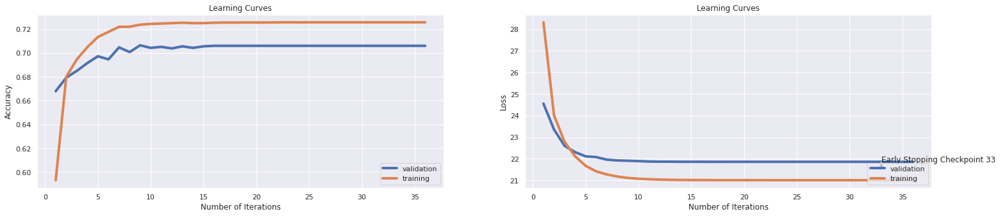

              precision    recall  f1-score
neutral        0.766756  0.805634  0.785714
antivax        0.728814  0.145270  0.242254
provax         0.643116  0.770901  0.701235
macro avg      0.712895  0.573935  0.576401
weighted avg   0.711934  0.705960  0.681126
Accuracy: 0.70596 

Total time: 70.17 seconds
Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4668252378567852, 0.47227090635953933, 0.5260390585878818, 0.6015898848272409, 0.6451552328492739, 0.660177766649975, 0.6688783174762143, 0.6742613920881322, 0.6812719078617927, 0.6832749123685529, 0.6879068602904357, 0.6913495242864296, 0.691662493740611, 0.6959814722083125, 0.6983600400600901, 0.6991737606409615, 0.7016149223835754, 0.7038057085628443, 0.7074987481221833, 0.7117551326990486, 0.7144466700050075, 0.7162618928392589, 0.7198297446169254, 0.721957936905358, 0.7235227841762644, 0.7269028542814221, 0.7289058587881823, 0.

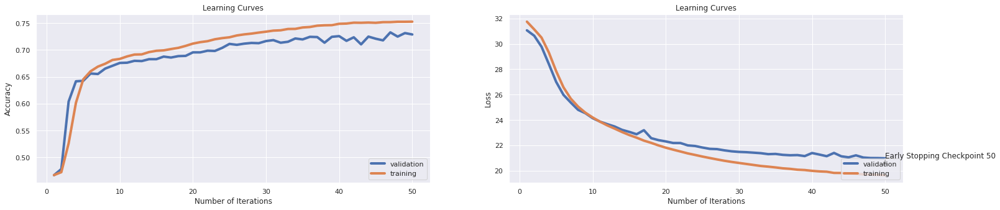

              precision    recall  f1-score
neutral        0.780421  0.800939  0.790547
antivax        0.706767  0.317568  0.438228
provax         0.678030  0.777416  0.724330
macro avg      0.721739  0.631974  0.651035
weighted avg   0.729543  0.728747  0.718123
Accuracy: 0.72875 

Total time: 97.73 seconds
Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.436029043565348, 0.4669504256384577, 0.49987481221832747, 0.6041562343515273, 0.6558587881822734, 0.6691286930395594, 0.6808337506259389, 0.6895968953430145, 0.6946044066099148, 0.7013019529293941, 0.7099399098647972, 0.7168878317476214, 0.7245868803204807, 0.7282173259889835, 0.7337881822734101, 0.7371056584877316, 0.7366675012518779, 0.7398597896845268, 0.742864296444667, 0.7435528292438658, 0.7482473710565849, 0.7477466199298949, 0.74899849774662]
Validation accuracy scores: [0.46669588080631025, 0.46669588080631025, 0.570990

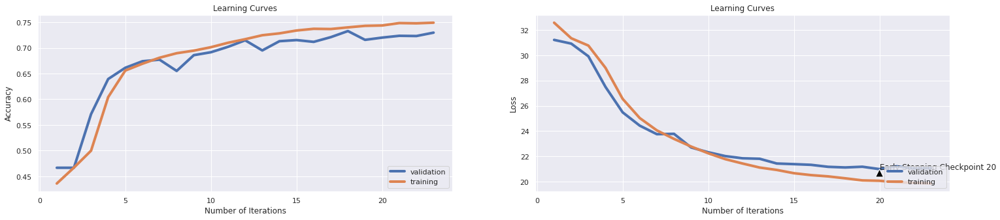

              precision    recall  f1-score
neutral        0.783178  0.786854  0.785012
antivax        0.670455  0.398649  0.500000
provax         0.684363  0.769815  0.724578
macro avg      0.712665  0.651773  0.669863
weighted avg   0.728675  0.729623  0.723652
Accuracy: 0.72962 

Total time: 49.76 seconds
Grid Search: 4, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.618365047571357, 0.6792063094641962, 0.6897220831246871, 0.6948547821732599, 0.700050075112669, 0.7009889834752128, 0.7022408612919379, 0.703242363545318, 0.7039308963445168, 0.704243865798698, 0.7036179268903355, 0.7039308963445168, 0.7043064596895343, 0.7044316474712068, 0.7044942413620431, 0.7044942413620431]
Validation accuracy scores: [0.6678352322524101, 0.6752848378615249, 0.679666958808063, 0.6717791411042945, 0.679666958808063, 0.6827344434706398, 0.6831726555652936, 0.6840490797546013, 0.6818580192813322, 0.6840490797546013

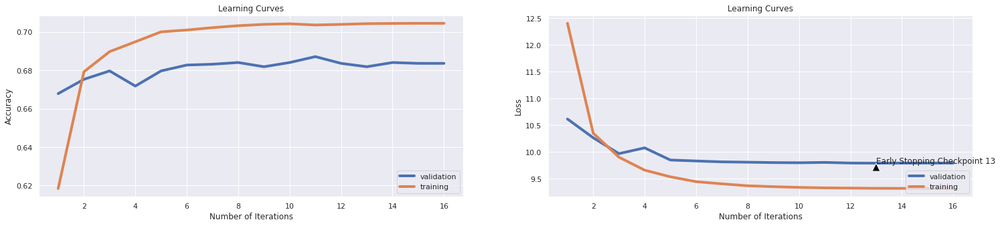

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.799020  0.765258  0.781775
antivax        0.000000  0.000000  0.000000
provax         0.590333  0.808903  0.682547
macro avg      0.463117  0.524721  0.488107
weighted avg   0.611154  0.683611  0.640322
Accuracy: 0.68361 

Total time: 32.46 seconds
Grid Search: 5, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.5369303955933901, 0.6017150726089133, 0.6266274411617426, 0.6431522283425137, 0.657235853780671, 0.6638082123184778, 0.6761392088132199, 0.6796444667000501, 0.6827741612418627, 0.6832749123685529, 0.6862794191286931, 0.6887205808713069, 0.6910365548322484, 0.692663995993991, 0.6932273410115173, 0.69635703555333, 0.6967325988983475, 0.69635703555333, 0.6993615423134703, 0.6986104156234352, 0.7006134201301953, 0.7035553329994992, 0.7024286429644466, 0.7023660490736104, 0.704243865798698, 0.7053705558337506, 0.7056835252879319, 0.706121682523

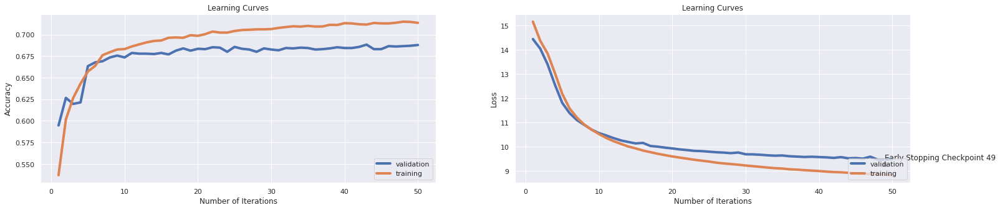

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.819487  0.750235  0.783333
antivax        0.000000  0.000000  0.000000
provax         0.589901  0.837134  0.692101
macro avg      0.469796  0.529123  0.491811
weighted avg   0.620531  0.687993  0.644906
Accuracy: 0.68799 

Total time: 97.13 seconds
Grid Search: 6, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.5105157736604907, 0.5932023034551828, 0.6287556334501753, 0.6539809714571858, 0.6713820731096645, 0.6799574361542313, 0.6855908863294943, 0.6910365548322484, 0.6949799699549324, 0.6962318477716575, 0.7001752628943415, 0.700550826239359, 0.7050575863795694, 0.7043690535803706, 0.706434651977967, 0.7068728092138208, 0.7060590886329494, 0.7102528793189785, 0.7098147220831247, 0.7101276915373059, 0.7098147220831247, 0.711880320480721, 0.7150100150225338, 0.714822233350025, 0.7157611417125689, 0.717013019529294, 0.7192038057085628, 0.719078

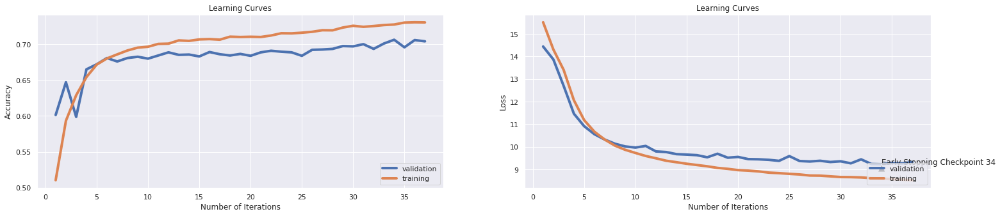

              precision    recall  f1-score
neutral        0.744681  0.821596  0.781250
antivax        0.746269  0.168919  0.275482
provax         0.654808  0.739414  0.694544
macro avg      0.715252  0.576643  0.583759
weighted avg   0.708615  0.703769  0.680652
Accuracy: 0.70377 

Total time: 77.49 seconds
Grid Search: 7, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5870055082623936, 0.6726965448172258, 0.6984852278417626, 0.7318477716574863, 0.7454306459689535, 0.7586379569354031, 0.7661492238357537, 0.770405608412619, 0.7732849273910867, 0.774849774661993, 0.7779168753129695, 0.7778542814221332, 0.7791061592388583, 0.7792313470205308, 0.7804206309464197, 0.7796069103655483, 0.7799824737105658, 0.7804206309464197, 0.7805458187280921, 0.7803580370555834, 0.7806710065097646, 0.7806710065097646, 0.7806084126189284, 0.7806710065097646, 0.7806710065097646, 0.7806710065097646, 0.780733600

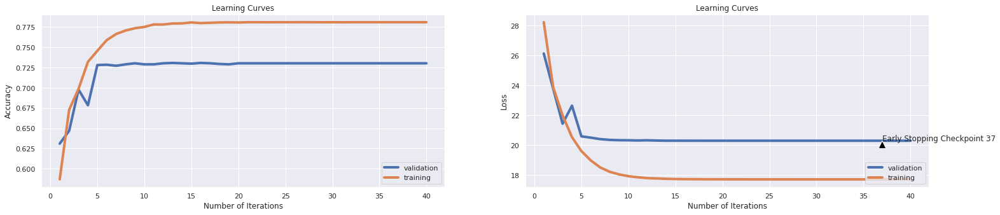

              precision    recall  f1-score
neutral        0.784572  0.783099  0.783835
antivax        0.666667  0.405405  0.504202
provax         0.685274  0.773073  0.726531
macro avg      0.712171  0.653859  0.671522
weighted avg   0.729203  0.730061  0.724436
Accuracy: 0.73006 

Total time: 134.81 seconds
Grid Search: 8, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.47583875813720583, 0.4728968452679019, 0.5751126690035052, 0.6436529794692039, 0.6698798197295944, 0.681334501752629, 0.6922258387581373, 0.7002378567851778, 0.7058713069604406, 0.7120055082623936, 0.7148848272408613, 0.7229594391587381, 0.7336629944917376, 0.7398597896845268, 0.7494366549824737, 0.7535678517776665, 0.7590761141712569, 0.760828743114672, 0.7662118177265899, 0.7693415122684026, 0.7705307961942914, 0.7752879318978467, 0.7776039058587881, 0.7779794692038057, 0.7809839759639459]
Validation accuracy scores: [0.4666

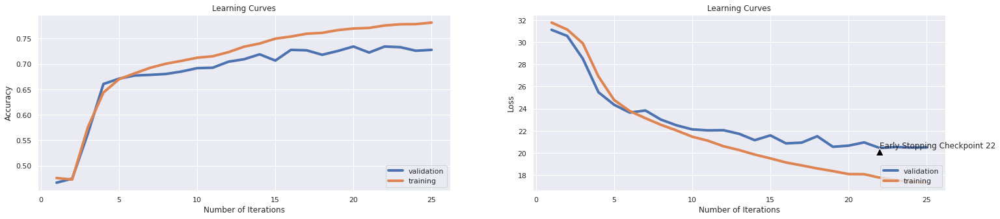

              precision    recall  f1-score
neutral        0.824339  0.731455  0.775124
antivax        0.661376  0.422297  0.515464
provax         0.658537  0.820847  0.730788
macro avg      0.714750  0.658200  0.673792
weighted avg   0.736284  0.727432  0.723550
Accuracy: 0.72743 

Total time: 84.07 seconds
Grid Search: 9, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4668252378567852, 0.4744616925388082, 0.5808087130696044, 0.661179268903355, 0.6798948422633951, 0.6967951927891838, 0.7061842764146219, 0.7206434651977967, 0.7386079118678017, 0.7479969954932398, 0.7516900350525789, 0.7573860791186781, 0.7619554331497246, 0.7689659489233851, 0.7738482724086129, 0.7684651977966951, 0.7742238357536304, 0.7797946920380571, 0.7796695042563846]
Validation accuracy scores: [0.46669588080631025, 0.49605609114811566, 0.6003505696757231, 0.6695880806310254, 0.6625766871165644, 0.6871165644171779, 0

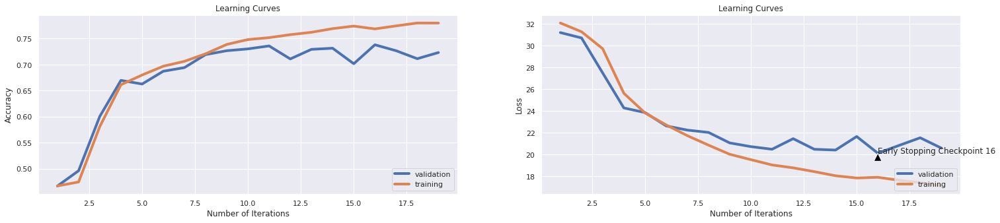

              precision    recall  f1-score
neutral        0.739094  0.827230  0.780682
antivax        0.611570  0.500000  0.550186
provax         0.732311  0.674267  0.702092
macro avg      0.694325  0.667166  0.677653
weighted avg   0.719815  0.723050  0.719066
Accuracy: 0.72305 

Total time: 74.92 seconds
Grid Search: 10, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5983975963945919, 0.6775162744116174, 0.6911617426139208, 0.7039308963445168, 0.7088758137205808, 0.715322984476715, 0.7186404606910366, 0.7198923385077617, 0.7215197796695042, 0.7238357536304457]
Validation accuracy scores: [0.6437335670464505, 0.6761612620508326, 0.6836108676599474, 0.6822962313759859, 0.6862401402278703, 0.6783523225241017, 0.6779141104294478, 0.6875547765118317, 0.6871165644171779, 0.6818580192813322]
Training f1 scores: [0.528973396554313, 0.633632333071445, 0.6475787015470038, 0.6604315803589759, 0.664896

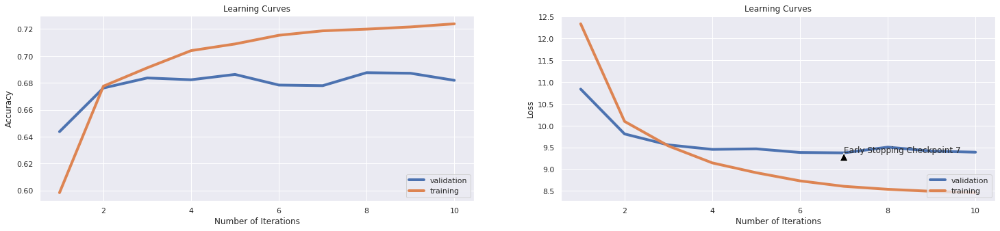

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.801595  0.754930  0.777563
antivax        0.000000  0.000000  0.000000
provax         0.587959  0.816504  0.683636
macro avg      0.463185  0.523811  0.487066
weighted avg   0.611398  0.681858  0.638796
Accuracy: 0.68186 

Total time: 35.58 seconds
Grid Search: 11, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.5242864296444667, 0.5958938407611417, 0.6359539308963446, 0.6589258888332499, 0.6706935403104657, 0.6790811216825238, 0.6853405107661492, 0.6919128693039559, 0.6974211316975463, 0.7008637956935403, 0.7049323985978968, 0.7041186780170255, 0.7094391587381071, 0.7105658487731598, 0.7130696044066099, 0.7158863294942414, 0.7170756134201302, 0.7182023034551828, 0.7183900851276915, 0.7189534301452178, 0.7213319979969955]
Validation accuracy scores: [0.5670464504820333, 0.6257668711656442, 0.6481156879929886, 0.6568799298860648, 0.6665205959

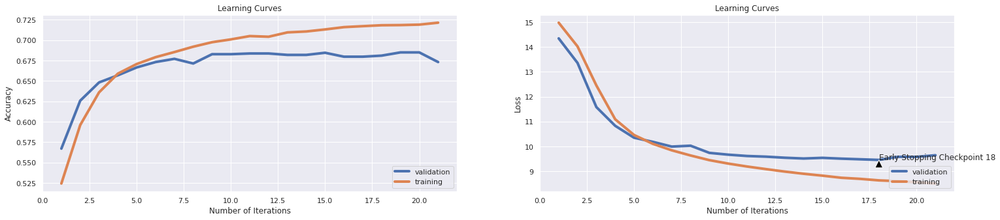

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.726083  0.833803  0.776224
antivax        0.000000  0.000000  0.000000
provax         0.611898  0.703583  0.654545
macro avg      0.445994  0.512462  0.476923
weighted avg   0.585818  0.673094  0.626431
Accuracy: 0.67309 

Total time: 72.01 seconds
Grid Search: 12, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.48685528292438657, 0.5803705558337506, 0.6285052578868302, 0.6622433650475713, 0.6765147721582374, 0.6885953930896345, 0.6967325988983475, 0.7039308963445168, 0.7043690535803706, 0.7082498748122183, 0.7122558838257386, 0.7146970455683526, 0.714822233350025, 0.7120681021532298]
Validation accuracy scores: [0.4938650306748466, 0.591148115687993, 0.661262050832603, 0.6673970201577564, 0.6779141104294478, 0.677475898334794, 0.684487291849255, 0.6787905346187555, 0.6748466257668712, 0.6836108676599474, 0.6818580192813322, 0.6695880806

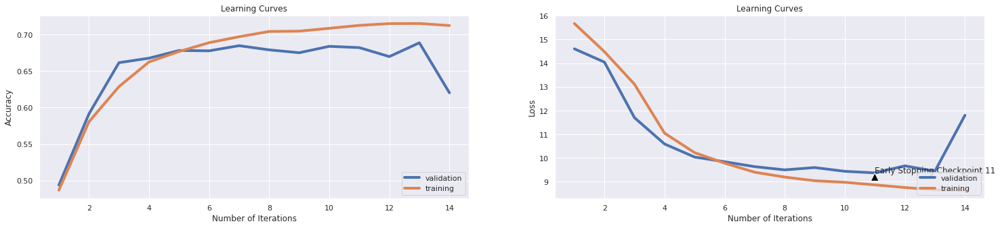

              precision    recall  f1-score
neutral        0.926829  0.499531  0.649176
antivax        0.000000  0.000000  0.000000
provax         0.516979  0.958740  0.671738
macro avg      0.481269  0.486090  0.440305
weighted avg   0.641197  0.620070  0.574077
Accuracy: 0.62007 

Total time: 54.68 seconds
Best grid is: Grid Search: 6, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
param_grid = {
  'neurons': [[75], [220, 90]],
  'activation_functions': ['ReLU'],
  'optimizers': ['SGD'],
  'loss_functions': ['CrossEntropy', 'Hinge'],
  'learning_rates': [{'val': 1e-2, 'schelduler' : 'Exponential'}, {'val': 1e-3, 'schelduler' : None}, {'val' : 5e-6, 'schelduler' : 'OneCycle'}],
  'classes': ['neutral', 'antivax', 'provax'],
  'batch_size': 32,
  'epochs': 50,
  'early_stopping_patience': 3,
  'input_normalization' : False,
  'L2_reg': 0.1,
  'accuracy_threshold': 0.7
}

customGridSearch(param_grid, tfidf_training_set, tfidf_validation_set)

### **Putting all together now**

Grid Search: 1, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6089133700550826, 0.6938532799198798, 0.7200175262894342, 0.7412994491737607, 0.7516274411617426, 0.7555708562844267, 0.760828743114672, 0.7629569354031046, 0.7637080620931397, 0.7656484727090636, 0.765272909364046, 0.7659614421632449, 0.7658988482724086, 0.7654606910365548, 0.7652103154732098, 0.7667125688532799, 0.7655232849273911, 0.7657736604907361, 0.7660866299449174, 0.7660866299449174, 0.7662744116174262, 0.7659614421632449, 0.7659614421632449, 0.7661492238357537, 0.7660240360540811, 0.7662118177265899, 0.7662118177265899, 0.7662118177265899, 0.7662118177265899, 0.7662118177265899, 0.7662118177265899, 0.7662118177265899, 0.7662118177265899, 0.7662118177265899]
Validation accuracy scores: [0.6726555652936022, 0.6814198071866784, 0.7186678352322524, 0.7217353198948291, 0.7226117440841368, 0.7248028045574058, 0.730061349693251

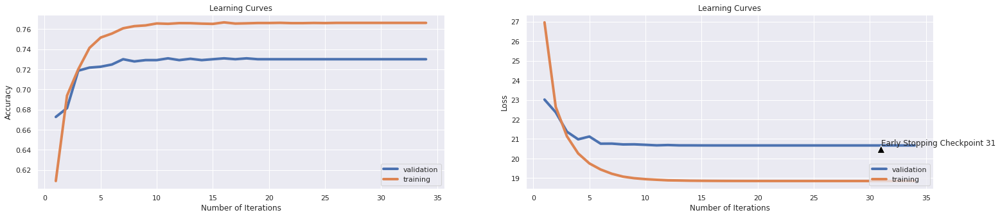

              precision    recall  f1-score
neutral        0.776867  0.800939  0.788719
antivax        0.703226  0.368243  0.483370
provax         0.684159  0.764387  0.722051
macro avg      0.721417  0.644523  0.664714
weighted avg   0.729899  0.730061  0.722206
Accuracy: 0.73006 

Total time: 66.99 seconds
Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4762769153730596, 0.5697921882824236, 0.6450300450676014, 0.6688157235853781, 0.6765773660490736, 0.6847145718577867, 0.6912869303955934, 0.6980470706059089, 0.704243865798698, 0.7150100150225338, 0.7197671507260891, 0.7260265398097145, 0.7306584877315974, 0.7378567851777666, 0.7397971957936905, 0.7453054581872809, 0.7476214321482223, 0.7540686029043565, 0.7541937906860291, 0.7557586379569354, 0.7591387080620932, 0.760077616424637, 0.7659614421632449, 0.7644591887831748, 0.7657110665998998, 0.7680270405608413, 0.7684651977966951, 0.

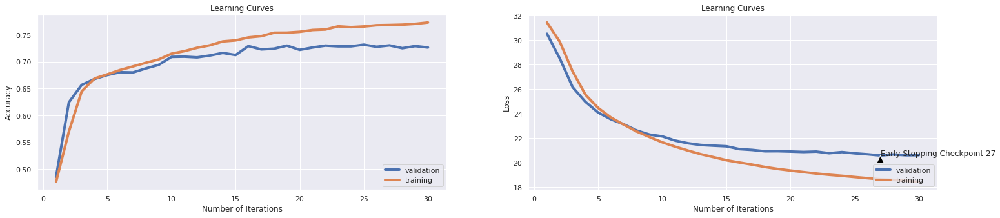

              precision    recall  f1-score
neutral        0.791188  0.775587  0.783310
antivax        0.724638  0.337838  0.460829
provax         0.665455  0.794788  0.724394
macro avg      0.727093  0.636071  0.656178
weighted avg   0.731810  0.726556  0.717702
Accuracy: 0.72656 

Total time: 58.88 seconds
Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.45850025037556336, 0.5224086129193791, 0.6323860791186781, 0.6669379068602904, 0.6834001001502253, 0.6931021532298448, 0.7097521281922884, 0.722458688032048, 0.7334752128192289, 0.742864296444667, 0.7489359038557837, 0.7516900350525789, 0.7549449173760641, 0.7586379569354031, 0.7583249874812218, 0.7598272408612919, 0.7615172759138709, 0.7628317476214321, 0.7647095643465198, 0.7625187781672509, 0.7655858788182274]
Validation accuracy scores: [0.46669588080631025, 0.5486415425065732, 0.6240140227870289, 0.6700262927256793, 0.67528

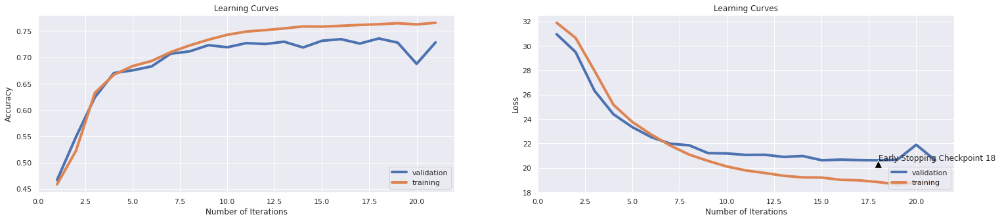

              precision    recall  f1-score
neutral        0.808040  0.754930  0.780583
antivax        0.698718  0.368243  0.482301
provax         0.662246  0.813246  0.730019
macro avg      0.723001  0.645473  0.664301
weighted avg   0.735018  0.728309  0.721485
Accuracy: 0.72831 

Total time: 44.79 seconds
Grid Search: 4, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6247496244366549, 0.6857160741111668, 0.6969829744616926, 0.7126940410615924, 0.7227090635953931, 0.7313470205307961, 0.7359163745618428, 0.7402979469203805, 0.7400475713570356, 0.7403605408112168, 0.741862794191287, 0.7412368552829244]
Validation accuracy scores: [0.5907099035933392, 0.6726555652936022, 0.6858019281332165, 0.6919368974583698, 0.694127957931639, 0.7028921998247152, 0.7055214723926381, 0.7068361086765995, 0.7059596844872918, 0.7068361086765995, 0.7059596844872918, 0.7090271691498685]
Training f1 scores: [0.56898098635

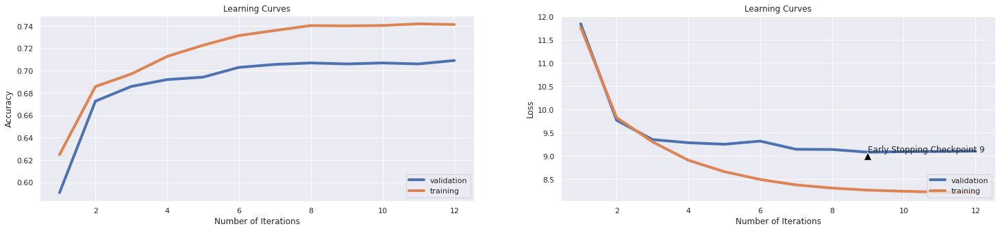

              precision    recall  f1-score
neutral        0.793468  0.775587  0.784425
antivax        0.753846  0.165541  0.271468
provax         0.631803  0.806732  0.708631
macro avg      0.726372  0.582620  0.588175
weighted avg   0.723082  0.709027  0.687299
Accuracy: 0.70903 

Total time: 24.23 seconds
Grid Search: 5, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.5901352028042063, 0.6444667000500751, 0.6688157235853781, 0.6803955933900852, 0.6858412618928392, 0.6914747120681022, 0.6972333500250375, 0.6981722583875813, 0.7033049574361542, 0.7044942413620431, 0.7070605908863294, 0.7078117175763645, 0.711880320480721, 0.7158237356034051, 0.7177015523284928, 0.718014521782674, 0.7232724086129194, 0.729093640460691, 0.73178517776665, 0.7349148723084626, 0.7391086629944917, 0.7436154231347021, 0.746306960440661, 0.7467451176765147, 0.7512518778167251, 0.7524411617426139, 0.7546945418127191, 0.75744867300

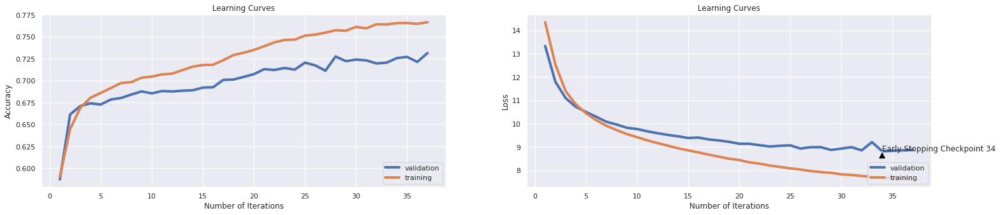

              precision    recall  f1-score
neutral        0.763877  0.814085  0.788182
antivax        0.700565  0.418919  0.524313
provax         0.698969  0.736156  0.717081
macro avg      0.721137  0.656387  0.676525
weighted avg   0.729468  0.731376  0.725259
Accuracy: 0.73138 

Total time: 72.32 seconds
Grid Search: 6, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.5480095142714071, 0.6347646469704556, 0.6698798197295944, 0.6781422133199799, 0.6941036554832248, 0.69635703555333, 0.7013645468202303, 0.709877315973961, 0.7182023034551828, 0.7257135703555333, 0.7369804707060591, 0.7406109163745619, 0.746807711567351, 0.7525663495242865, 0.7555708562844267, 0.7566975463194792, 0.7589509263895844, 0.7562593890836254, 0.7608913370055083]
Validation accuracy scores: [0.6511831726555652, 0.6529360210341806, 0.6621384750219106, 0.6761612620508326, 0.6840490797546013, 0.6840490797546013, 0.6871165644171779

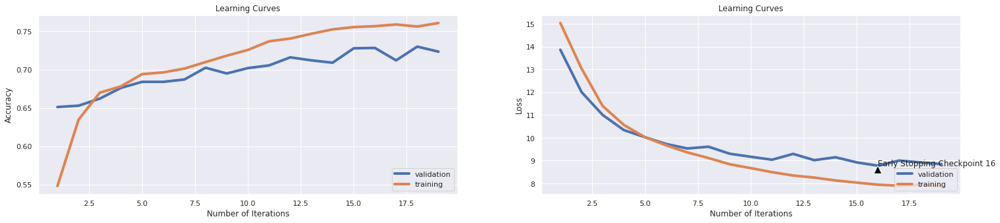

              precision    recall  f1-score
neutral        0.750636  0.830986  0.788770
antivax        0.780000  0.263514  0.393939
provax         0.685942  0.747014  0.715177
macro avg      0.738859  0.613838  0.632629
weighted avg   0.728335  0.723488  0.707854
Accuracy: 0.72349 

Total time: 39.90 seconds
Grid Search: 7, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6429018527791688, 0.6740736104156234, 0.6997371056584877, 0.7107536304456685, 0.7275913870806209, 0.7396094141211818, 0.7524411617426139, 0.7613294942413621, 0.7674011016524788, 0.7760390585878818, 0.7797946920380571, 0.7806710065097646, 0.7848022033049574, 0.7867426139208813, 0.7869929894842264, 0.7868678017025539, 0.7885578367551327, 0.7893089634451678, 0.7884326489734602, 0.7893715573360041, 0.7898097145718578, 0.7893089634451678, 0.7888708062093139, 0.7895593390085127]
Validation accuracy scores: [0.6367221735319895, 

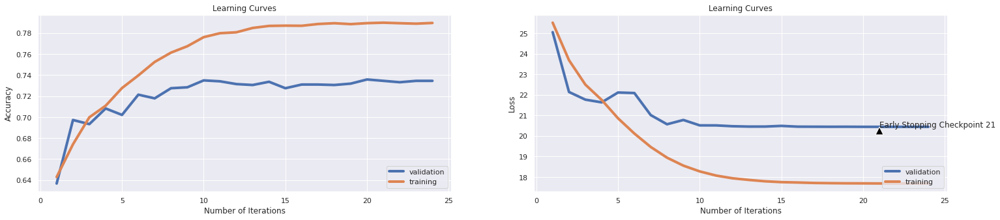

              precision    recall  f1-score
neutral        0.781567  0.796244  0.788837
antivax        0.663102  0.418919  0.513458
provax         0.697030  0.764387  0.729156
macro avg      0.713899  0.659850  0.677150
weighted avg   0.732082  0.734443  0.729031
Accuracy: 0.73444 

Total time: 53.39 seconds
Grid Search: 8, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6278793189784677, 0.7021782674011017, 0.7282173259889835, 0.7380445668502754, 0.7394842263395093, 0.7407986980470707]
Validation accuracy scores: [0.6822962313759859, 0.7142857142857143, 0.7248028045574058, 0.7125328659070991, 0.7129710780017529, 0.7239263803680982]
Training f1 scores: [0.5638834178011705, 0.6717616858452158, 0.7107597341779274, 0.7240905129816975, 0.7259770692245473, 0.728181717142132]
Validation f1 scores: [0.642405514993944, 0.7018390786591852, 0.7188022532427643, 0.6947576133357894, 0.7091323911736899, 0.71

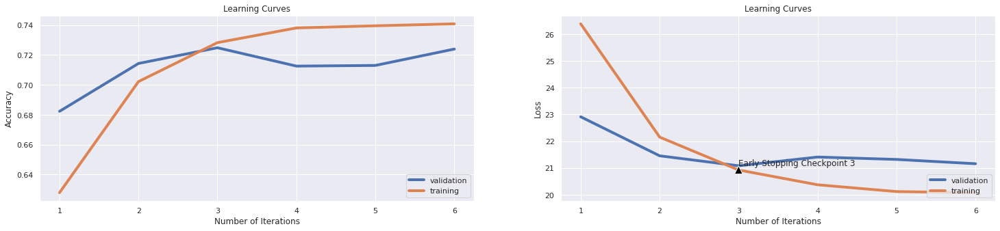

              precision    recall  f1-score
neutral        0.840132  0.715493  0.772819
antivax        0.690909  0.385135  0.494577
provax         0.641322  0.842562  0.728297
macro avg      0.724121  0.647730  0.665231
weighted avg   0.740538  0.723926  0.718759
Accuracy: 0.72393 

Total time: 14.04 seconds
Grid Search: 9, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.460127691537306, 0.5429394091136706, 0.6487230846269404, 0.6743865798698047, 0.6860916374561843, 0.699799699549324, 0.7130070105157736, 0.7276539809714572, 0.7381697546319479, 0.7442413620430646, 0.7511892839258888, 0.7563219829744617, 0.758137205808713, 0.7563219829744617, 0.7607035553329995, 0.7657736604907361, 0.7655858788182274, 0.7650851276915374]
Validation accuracy scores: [0.47020157756354075, 0.6476774758983348, 0.6630148992112183, 0.6761612620508326, 0.6840490797546013, 0.6932515337423313, 0.7112182296231376, 0.71

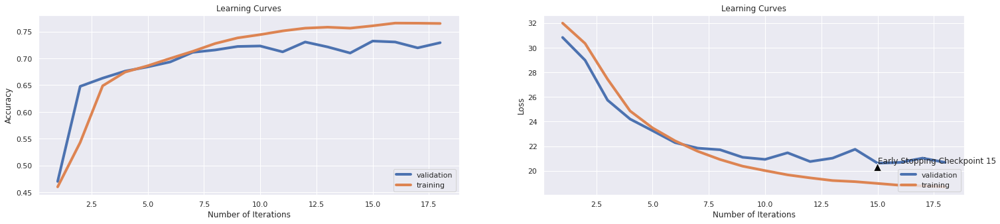

              precision    recall  f1-score
neutral        0.798263  0.776526  0.787244
antivax        0.762712  0.304054  0.434783
provax         0.662234  0.811075  0.729136
macro avg      0.741069  0.630552  0.650388
weighted avg   0.738751  0.729185  0.718074
Accuracy: 0.72918 

Total time: 41.07 seconds
Grid Search: 10, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6397095643465198, 0.6705057586379569, 0.6937280921382073, 0.7105658487731598, 0.724899849774662, 0.7377315973960942, 0.7503755633450175, 0.761579869804707, 0.7648347521281923, 0.7694667000500751, 0.7727215823735604, 0.774849774661993, 0.7747871807711567]
Validation accuracy scores: [0.661262050832603, 0.6814198071866784, 0.6897458369851008, 0.6546888694127958, 0.7028921998247152, 0.7055214723926381, 0.7226117440841368, 0.7296231375985978, 0.7278702892199824, 0.7287467134092901, 0.7252410166520596, 0.7318141980718668, 0.73225241

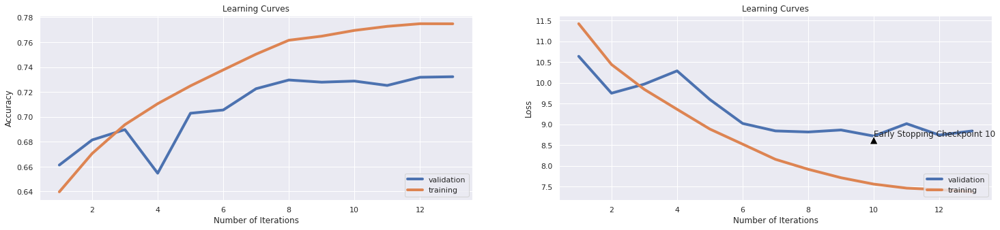

              precision    recall  f1-score
neutral        0.826722  0.743662  0.782996
antivax        0.678571  0.385135  0.491379
provax         0.661765  0.830619  0.736639
macro avg      0.722353  0.653139  0.670338
weighted avg   0.740930  0.732252  0.726461
Accuracy: 0.73225 

Total time: 29.89 seconds
Grid Search: 11, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6383324987481221, 0.6880320480721082, 0.7082498748122183, 0.7242113169754631, 0.7379819729594391, 0.739922383575363, 0.7421131697546319, 0.7433024536805208, 0.7444917376064096]
Validation accuracy scores: [0.6752848378615249, 0.6555652936021035, 0.6998247151621385, 0.7050832602979842, 0.7011393514461, 0.7099035933391762, 0.7129710780017529, 0.7138475021910605, 0.7164767747589833]
Training f1 scores: [0.5851676149379692, 0.644683957293305, 0.6716385502438738, 0.7001093886509044, 0.7189461526060573, 0.7231347387444707, 0.72700520425569

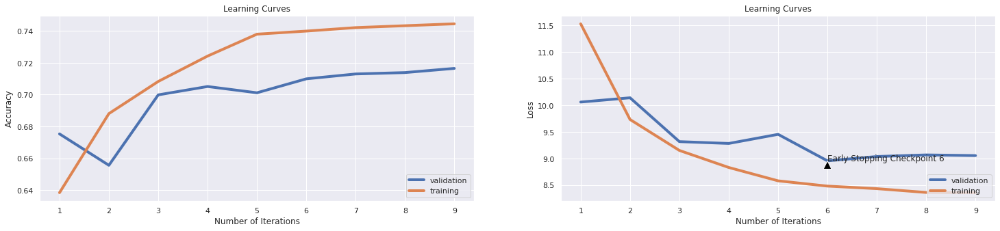

              precision    recall  f1-score
neutral        0.718477  0.850704  0.779020
antivax        0.686486  0.429054  0.528067
provax         0.720096  0.653637  0.685259
macro avg      0.708353  0.644465  0.664115
weighted avg   0.714981  0.716477  0.708627
Accuracy: 0.71648 

Total time: 20.32 seconds
Grid Search: 12, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.5419379068602904, 0.6372058087130696, 0.6651852779168753, 0.678893340010015, 0.6895968953430145, 0.6977966950425638, 0.7013019529293941, 0.7094391587381071, 0.7144466700050075, 0.7262143214822233, 0.7361667501251877, 0.7421131697546319, 0.747308462694041, 0.7506885327991988, 0.7545067601402103, 0.7579494241362043, 0.7601402103154732, 0.7595768652979469]
Validation accuracy scores: [0.605170902716915, 0.6459246275197196, 0.6673970201577564, 0.6757230499561788, 0.6801051709027169, 0.6822962313759859, 0.6897458369851008, 0.690622261

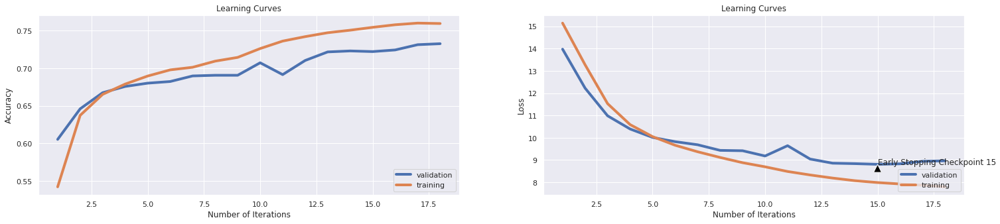

              precision    recall  f1-score
neutral        0.783380  0.787793  0.785581
antivax        0.627193  0.483108  0.545802
provax         0.701933  0.749186  0.724790
macro avg      0.704169  0.673362  0.685391
weighted avg   0.730249  0.732691  0.729944
Accuracy: 0.73269 

Total time: 41.57 seconds
Grid Search: 13, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.46657486229344014, 0.5498247371056585, 0.5359914872308462, 0.5550200300450676, 0.5822483725588382, 0.6157986980470707, 0.6376439659489234, 0.6491612418627942, 0.6609914872308462, 0.667313470205308, 0.6688157235853781, 0.6706309464196294, 0.6724461692538808, 0.6737606409614422, 0.6742613920881322, 0.675200300450676, 0.6764521782674011, 0.6777666499749625, 0.6788307461191788, 0.6797070605908864, 0.6807711567351027, 0.6812719078617927, 0.6832123184777166, 0.6834001001502253, 0.6854656985478217, 0.6855908863294943, 0.68759389083625

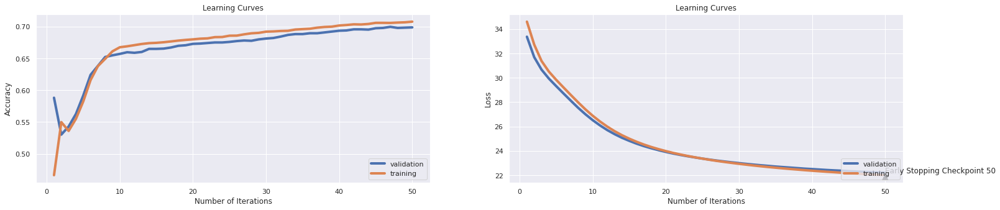

              precision    recall  f1-score
neutral        0.755989  0.800000  0.777372
antivax        0.716418  0.162162  0.264463
provax         0.637868  0.753529  0.690891
macro avg      0.703425  0.571897  0.577575
weighted avg   0.703183  0.698510  0.675939
Accuracy: 0.69851 

Total time: 137.18 seconds
Grid Search: 14, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.3621056584877316, 0.4631947921882824, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.46688783174762144, 0.4669504256384577, 0.467764146219329, 0.4684526790185278, 0.46870305458187284, 0.4692663995993991, 0.4693289934902354, 0.47026790185277917, 0.47101902854281424, 0.47233350025037557, 0.47383575363044567, 0.47565097646469706, 0.4779043565348022, 0.47990736104156234, 0.48197295943915874, 0.4843515272909364, 0.489

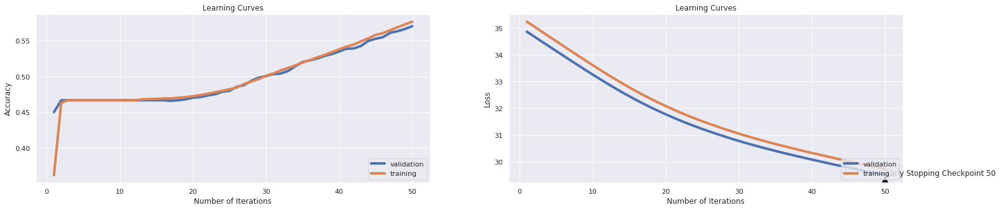

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.542091  0.949296  0.690102
antivax        0.000000  0.000000  0.000000
provax         0.695444  0.314875  0.433483
macro avg      0.412512  0.421390  0.374528
weighted avg   0.533668  0.570114  0.497019
Accuracy: 0.57011 

Total time: 140.57 seconds
Grid Search: 15, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.129757

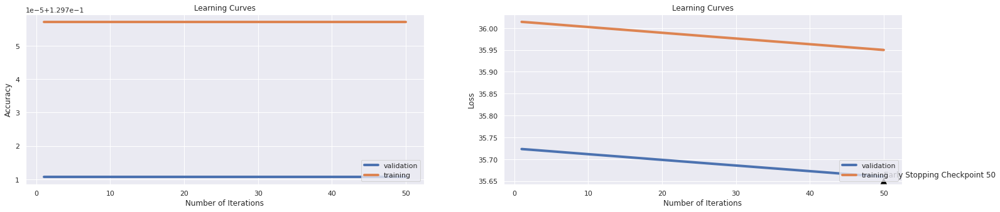

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.000000  0.000000  0.000000
antivax        0.129711  1.000000  0.229635
provax         0.000000  0.000000  0.000000
macro avg      0.043237  0.333333  0.076545
weighted avg   0.016825  0.129711  0.029786
Accuracy: 0.12971 

Total time: 139.17 seconds
Grid Search: 16, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.5481347020530796, 0.6105408112168252, 0.617864296444667, 0.6481597396094141, 0.6593014521782674, 0.6633700550826239, 0.6685027541311968, 0.671757636454682, 0.6733224837255883, 0.6770781171757636, 0.6782048072108162, 0.6795818728092138, 0.6806459689534301, 0.6810841261892839, 0.6826489734601903, 0.6825237856785178, 0.6832749123685529, 0.6844016024036054, 0.6852153229844767, 0.6859038557836755, 0.6862168252378568, 0.6875312969454181, 0.6878442663995994, 0.6879694541812719, 0.6881572358537806, 0.6887831747621432, 0.689221331997997, 0.68

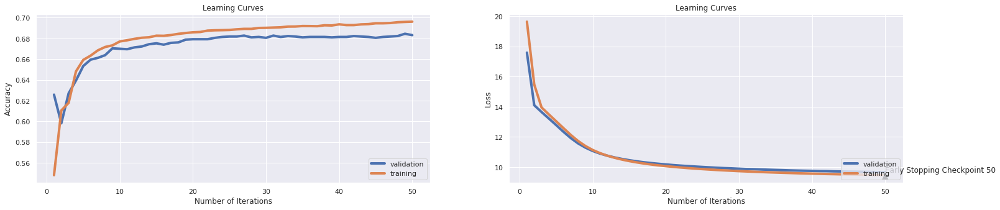

              precision    recall  f1-score
neutral        0.782983  0.769014  0.775936
antivax        1.000000  0.010135  0.020067
provax         0.597729  0.800217  0.684308
macro avg      0.793571  0.526455  0.493437
weighted avg   0.736365  0.683173  0.640911
Accuracy: 0.68317 

Total time: 140.52 seconds
Grid Search: 17, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.14014772158237357, 0.22026790185277917, 0.42013019529293943, 0.46782674011016523, 0.4705182774161242, 0.4735227841762644, 0.478843264897346, 0.4838507761642464, 0.48842013019529296, 0.4943665498247371, 0.4991862794191287, 0.503943415122684, 0.5097646469704556, 0.5134576865297947, 0.5172759138708062, 0.521907861792689, 0.5262268402603906, 0.5304832248372559, 0.5344892338507762, 0.5409364046069104, 0.5490736104156234, 0.5579619429143715, 0.5657861792689034, 0.574298948422634, 0.5818102153229845, 0.5865673510265398, 0.592764146219329, 

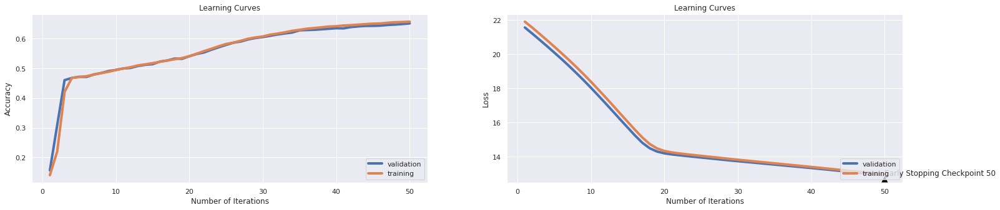

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.649513  0.876995  0.746304
antivax        0.000000  0.000000  0.000000
provax         0.654028  0.599349  0.625496
macro avg      0.434514  0.492115  0.457267
weighted avg   0.567087  0.651183  0.600743
Accuracy: 0.65118 

Total time: 139.20 seconds
Grid Search: 18, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12969454181271908, 0.12969454181271908, 0.12963194792188282, 0.12969454181271908, 0.12969454181271908, 0.12969454181271908, 0.12969454181271908, 0.12969454181271908, 0.12969454181271908, 0.12963194792188282, 0.12963194792188282, 0.12963194792188282, 0.12963194792188282, 0.12963194792188282, 0.1296319479218

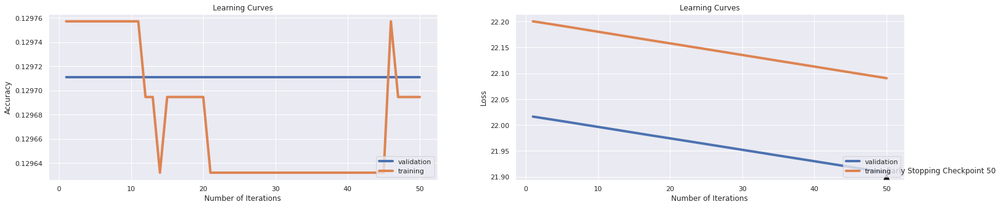

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.000000  0.000000  0.000000
antivax        0.129711  1.000000  0.229635
provax         0.000000  0.000000  0.000000
macro avg      0.043237  0.333333  0.076545
weighted avg   0.016825  0.129711  0.029786
Accuracy: 0.12971 

Total time: 140.96 seconds
Grid Search: 19, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.6616174261392088, 0.6800826239359039, 0.6947295943915874, 0.7049949924887331, 0.7041186780170255, 0.7108162243365047, 0.7128818227341012, 0.7143840761141712, 0.7138833249874812, 0.7174511767651477, 0.7158237356034051]
Validation accuracy scores: [0.6783523225241017, 0.6849255039439088, 0.6971954425942156, 0.7059596844872918, 0.7195442594215601, 0.708150744960561, 0.7059596844872918, 0.7226117440841368, 0.7020157756354075, 0.7212971078001753, 0.7256792287467134]
Training f1 scores: [0.6356030024087949, 0.6603284599755542, 0.6768056

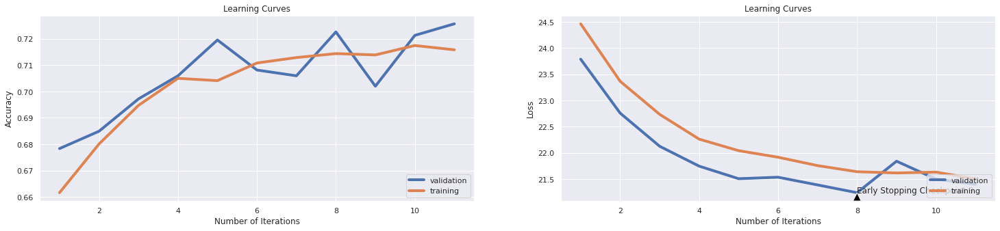

              precision    recall  f1-score
neutral        0.785647  0.781221  0.783427
antivax        0.641791  0.435811  0.519115
provax         0.680039  0.754615  0.715389
macro avg      0.702492  0.657215  0.672644
weighted avg   0.724365  0.725679  0.721683
Accuracy: 0.72568 

Total time: 33.88 seconds
Grid Search: 20, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6527916875312969, 0.7174511767651477, 0.7274661992989484, 0.7319103655483225, 0.7346644967451177, 0.7386705057586379, 0.7369178768152228, 0.7414872308462694]
Validation accuracy scores: [0.7147239263803681, 0.7296231375985978, 0.7274320771253286, 0.7269938650306749, 0.7309377738825592, 0.7248028045574058, 0.7274320771253286, 0.7221735319894829]
Training f1 scores: [0.6093769363677016, 0.6988506635176153, 0.7131860721213975, 0.7196175700114769, 0.7224504600094138, 0.7265056237556314, 0.7245255373032903, 0.7288961620139569]
Validati

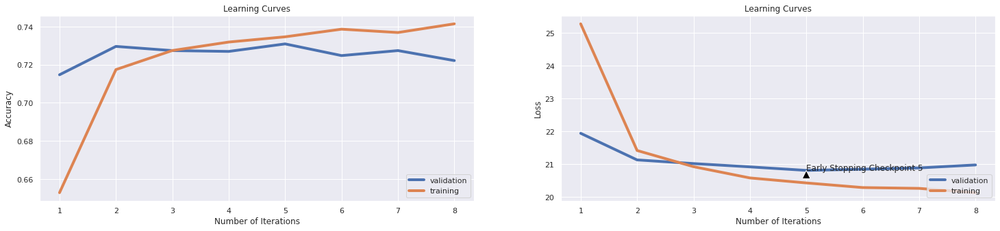

              precision    recall  f1-score
neutral        0.752604  0.814085  0.782138
antivax        0.613043  0.476351  0.536122
provax         0.711111  0.694897  0.702910
macro avg      0.692253  0.661778  0.673723
weighted avg   0.717755  0.722174  0.718251
Accuracy: 0.72217 

Total time: 22.66 seconds
Grid Search: 21, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.3985353029544316, 0.4034176264396595, 0.41211817726589883, 0.4233224837255884, 0.4526790185277917, 0.5010640961442163, 0.5639083625438157, 0.6283800701051577, 0.6695042563845769, 0.6802704056084126, 0.6696920380570857, 0.6563595393089634, 0.6429018527791688, 0.628693039559339, 0.6203054581872809, 0.6128567851777666, 0.6089133700550826, 0.6072233350025038, 0.6042814221331998, 0.6043440160240361, 0.6061592388582875, 0.6086629944917376, 0.6109789684526791, 0.613420130195293, 0.618365047571357, 0.6214321482223335, 0.6267526289434151, 

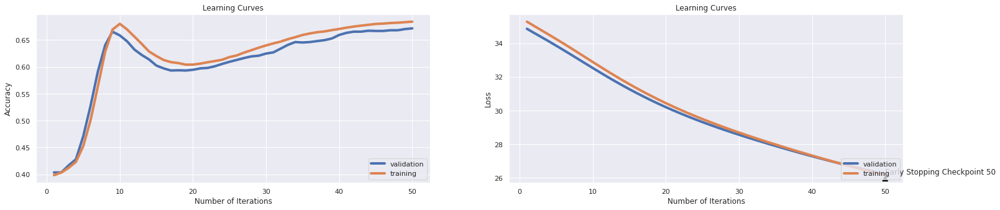

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.703819  0.847887  0.769165
antivax        0.000000  0.000000  0.000000
provax         0.630631  0.684039  0.656250
macro avg      0.444817  0.510642  0.475138
weighted avg   0.582988  0.671779  0.623824
Accuracy: 0.67178 

Total time: 136.62 seconds
Grid Search: 22, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.6507260891337006, 0.6700676014021032, 0.6767025538307461, 0.6802704056084126, 0.685778668002003, 0.689972458688032, 0.6922258387581373, 0.6896594892338508, 0.696106659989985, 0.6969203805708563]
Validation accuracy scores: [0.6577563540753725, 0.6730937773882559, 0.6879929886064855, 0.6879929886064855, 0.6998247151621385, 0.6967572304995618, 0.7002629272567923, 0.7138475021910605, 0.6884312007011394, 0.7059596844872918]
Training f1 scores: [0.6133531143313653, 0.6338707373871273, 0.6421727913315227, 0.6487757032233252, 0.6574773568660633

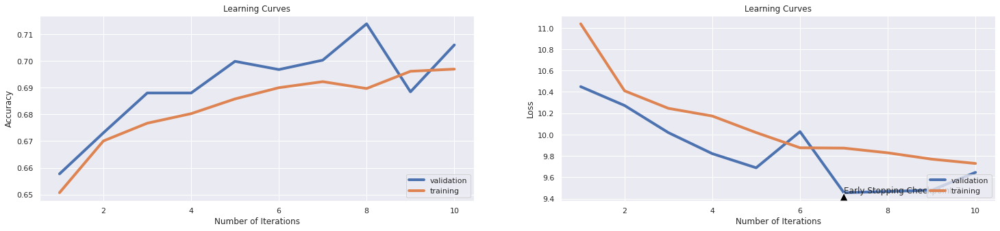

              precision    recall  f1-score
neutral        0.745866  0.804695  0.774164
antivax        0.713043  0.277027  0.399027
provax         0.660118  0.729642  0.693141
macro avg      0.706342  0.603788  0.622111
weighted avg   0.707001  0.705960  0.692804
Accuracy: 0.70596 

Total time: 28.81 seconds
Grid Search: 23, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6698798197295944, 0.7149474211316975, 0.7210190285428142, 0.7255883825738608, 0.7289684526790186, 0.7299073610415624, 0.7294692038057086]
Validation accuracy scores: [0.6958808063102542, 0.7230499561787905, 0.7226117440841368, 0.7252410166520596, 0.7164767747589833, 0.7177914110429447, 0.7208588957055214]
Training f1 scores: [0.6289977755632169, 0.6917168821457025, 0.7025074033698288, 0.7087784094361491, 0.7138532292379108, 0.7137001560013101, 0.7132570672178262]
Validation f1 scores: [0.6667268529928638, 0.7155091990427148, 0.7161804972

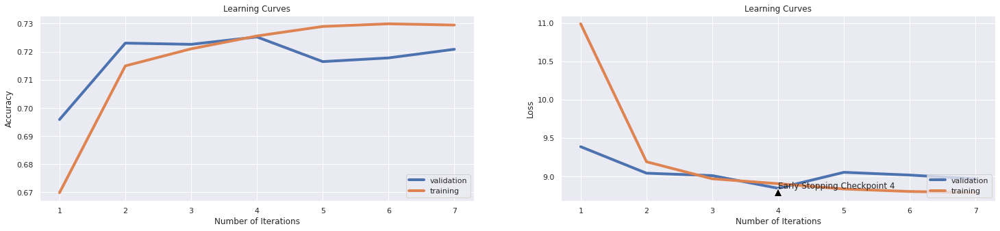

              precision    recall  f1-score
neutral        0.797044  0.759624  0.777885
antivax        0.748031  0.320946  0.449173
provax         0.650000  0.804560  0.719068
macro avg      0.731692  0.628377  0.648709
weighted avg   0.731341  0.720859  0.711509
Accuracy: 0.72086 

Total time: 19.50 seconds
Grid Search: 24, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.4913620430645969, 0.5288557836755132, 0.5635953930896345, 0.5953930896344517, 0.614171256885328, 0.6328242363545318, 0.645906359539309, 0.653292438657987, 0.6594892338507762, 0.6649349023535303, 0.6688783174762143, 0.6728843264897346, 0.6745743615423134, 0.6750125187781673, 0.6756384576865297, 0.6765147721582374, 0.6772033049574362, 0.6790185277916875, 0.6795192789183776, 0.6804581872809213, 0.6812719078617927, 0.6846519779669504, 0.6853405107661492, 0.6869679519278918, 0.6887205808713069, 0.6898472709063596, 0.690473209814722, 0.6910365

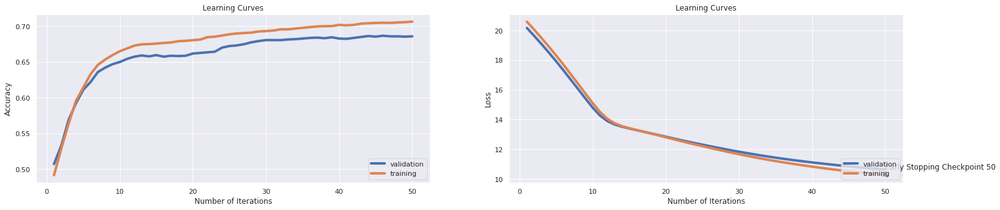

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.754885  0.798122  0.775901
antivax        0.000000  0.000000  0.000000
provax         0.618512  0.776330  0.688493
macro avg      0.457799  0.524817  0.488131
weighted avg   0.601929  0.685802  0.639981
Accuracy: 0.68580 

Total time: 133.45 seconds
Grid Search: 25, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5757386079118678, 0.6760140210315473, 0.692663995993991, 0.7017401101652478, 0.711379569354031, 0.7180771156735103, 0.7208312468703054, 0.720956434651978, 0.7232098147220831, 0.7227090635953931, 0.7252128192288433, 0.7238357536304457, 0.7243365047571357, 0.7247746619929895, 0.7240861291937907, 0.7249624436654982, 0.7244616925388082, 0.7247120681021533, 0.7243365047571357, 0.7245242864296445, 0.7243990986479719, 0.7243990986479719, 0.7243990986479719, 0.7243990986479719, 0.7243990986479719, 0.7243990986479719, 0.7243990986479

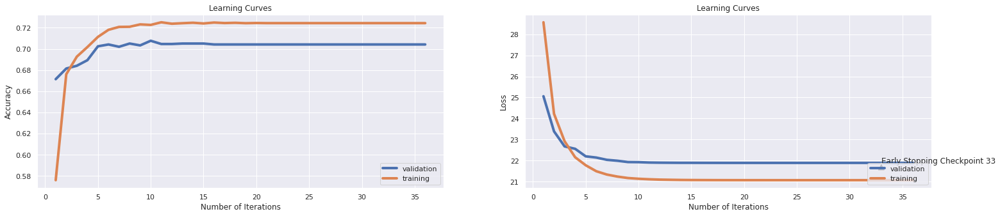

              precision    recall  f1-score
neutral        0.763345  0.805634  0.783920
antivax        0.719298  0.138514  0.232295
provax         0.643052  0.768730  0.700297
macro avg      0.708565  0.570959  0.572170
weighted avg   0.709082  0.704207  0.678618
Accuracy: 0.70421 

Total time: 70.63 seconds
Grid Search: 26, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4668252378567852, 0.4700801201802704, 0.5197796695042564, 0.592764146219329, 0.6406484727090636, 0.656484727090636, 0.6656234351527291, 0.6727591387080621, 0.676201802704056, 0.6823985978968453, 0.6849649474211317, 0.689221331997997, 0.691662493740611, 0.6955433149724587, 0.695605908863295, 0.6996119178768152, 0.7015523284927391, 0.7050575863795694, 0.706685027541312, 0.707686529794692, 0.711379569354031, 0.7146970455683526, 0.7195167751627441, 0.7200175262894342, 0.7223335002503756, 0.7248372558838257, 0.7272158237356035, 0.730658

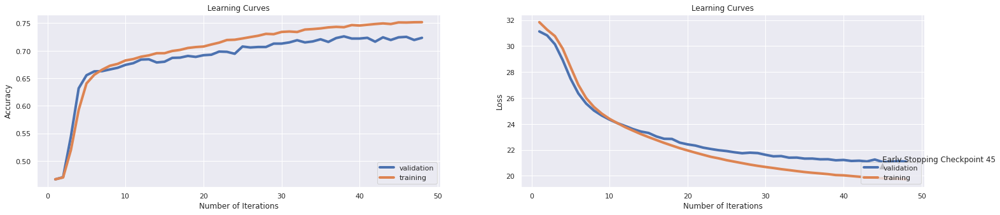

              precision    recall  f1-score
neutral        0.794455  0.780282  0.787305
antivax        0.737864  0.256757  0.380952
provax         0.656664  0.807818  0.724440
macro avg      0.729661  0.614952  0.630899
weighted avg   0.731503  0.723488  0.709225
Accuracy: 0.72349 

Total time: 93.59 seconds
Grid Search: 27, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4519904857285929, 0.4670756134201302, 0.5113920881321983, 0.6099148723084626, 0.6553580370555834, 0.6726965448172258, 0.6837756634952429, 0.6872809213820731, 0.6939158738107161, 0.699549323985979, 0.7051827741612419, 0.7167000500751126, 0.721707561342013, 0.7269028542814221, 0.729594391587381, 0.7347896845267902, 0.7374186279419128, 0.7406735102653981, 0.7399849774661993, 0.7435528292438658, 0.746306960440661, 0.7453054581872809, 0.7498122183274912, 0.7490610916374562, 0.7475588382573861, 0.7496870305458188, 0.7474962443665498,

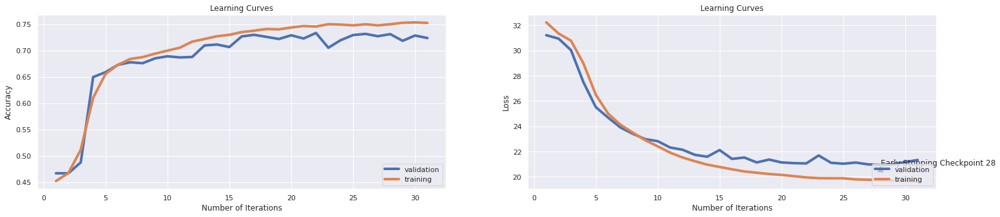

              precision    recall  f1-score
neutral        0.841876  0.724883  0.779011
antivax        0.695035  0.331081  0.448513
provax         0.638072  0.847991  0.728205
macro avg      0.724994  0.634652  0.651910
weighted avg   0.740575  0.723488  0.715637
Accuracy: 0.72349 

Total time: 66.41 seconds
Grid Search: 28, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6074111166750125, 0.6743865798698047, 0.6883450175262894, 0.6927891837756635, 0.6979218828242364, 0.7008012018027041, 0.7020530796194292, 0.703492739108663, 0.7029919879819729, 0.7026164246369554, 0.7038057085628443, 0.7033675513269905, 0.7031797696544817, 0.7034301452178268, 0.703743114672008, 0.7033049574361542, 0.7034301452178268, 0.7033049574361542, 0.7033049574361542, 0.7033049574361542, 0.7033049574361542, 0.7033049574361542, 0.703242363545318, 0.703242363545318, 0.703242363545318, 0.703242363545318, 0.703242363545318, 0.70324

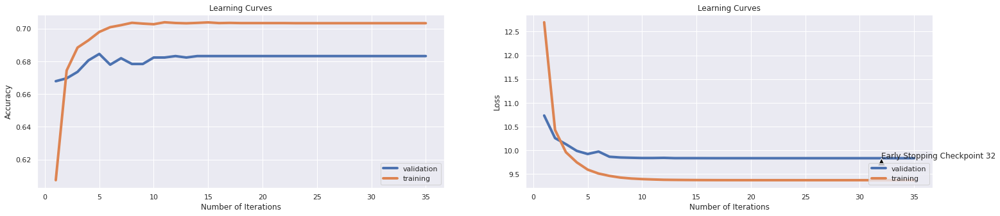

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.796676  0.765258  0.780651
antivax        0.000000  0.000000  0.000000
provax         0.590945  0.807818  0.682569
macro avg      0.462541  0.524359  0.487740
weighted avg   0.610307  0.683173  0.639807
Accuracy: 0.68317 

Total time: 69.76 seconds
Grid Search: 29, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.5348022033049574, 0.6070981472208312, 0.628192288432649, 0.6490986479719579, 0.6652478718077116, 0.6716950425638458, 0.675450676014021, 0.6789559339008513, 0.6838382573860792, 0.6852779168753129, 0.6879694541812719, 0.6905358037055583, 0.6940410615923885, 0.6945418127190787, 0.6981722583875813, 0.6976715072608913, 0.6982974461692539, 0.7004882323485228, 0.6990485728592889, 0.7004256384576866, 0.7028042063094642, 0.7036179268903355, 0.7043064596895343, 0.7052453680520782, 0.7054957436154231, 0.7060590886329494, 0.7073109664496745, 0.709689

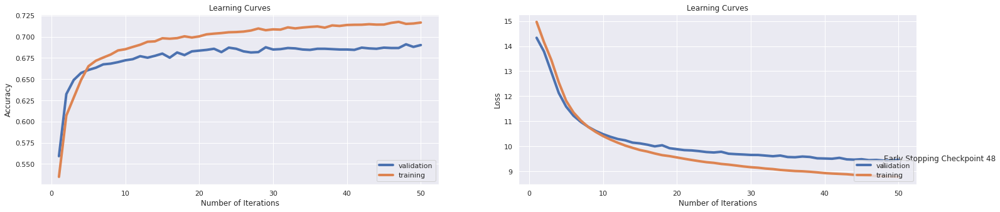

              precision    recall  f1-score
neutral        0.818088  0.747418  0.781158
antivax        0.800000  0.013514  0.026578
provax         0.594325  0.841477  0.696629
macro avg      0.737471  0.534136  0.501455
weighted avg   0.725433  0.690184  0.649166
Accuracy: 0.69018 

Total time: 96.76 seconds
Grid Search: 30, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.5018778167250876, 0.5927015523284928, 0.6265648472709063, 0.6561091637456185, 0.6708813219829745, 0.6761392088132199, 0.6836504757135704, 0.6887831747621432, 0.6942288432648973, 0.6967325988983475, 0.6999248873309964, 0.7017401101652478, 0.7028042063094642, 0.7052453680520782, 0.7035553329994992, 0.7079994992488733, 0.7066224336504757, 0.7093765648472709, 0.7093139709564347, 0.7090010015022534, 0.7121932899349024, 0.7121932899349024]
Validation accuracy scores: [0.5587204206836108, 0.6003505696757231, 0.6393514460999123, 0.66389132340

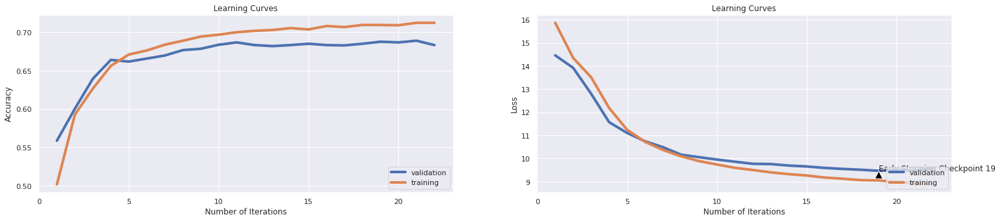

              precision    recall  f1-score
neutral        0.730549  0.837559  0.780402
antivax        1.000000  0.013514  0.026667
provax         0.627247  0.719870  0.670374
macro avg      0.785932  0.523647  0.492481
weighted avg   0.723808  0.683173  0.638228
Accuracy: 0.68317 

Total time: 46.98 seconds
Grid Search: 31, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6333875813720581, 0.6798948422633951, 0.6947295943915874, 0.7059339008512769, 0.720956434651978, 0.7310966449674512, 0.7400475713570356, 0.7459939909864797, 0.7515022533800702, 0.7543815723585378, 0.7564471707561342, 0.757135703555333, 0.7578868302453681, 0.7593890836254381, 0.7592013019529293, 0.7593890836254381, 0.7598272408612919, 0.7600150225338007, 0.7593890836254381, 0.7602028042063095, 0.7597020530796195, 0.7596394591887832, 0.7600150225338007, 0.7599524286429644]
Validation accuracy scores: [0.6700262927256793, 0

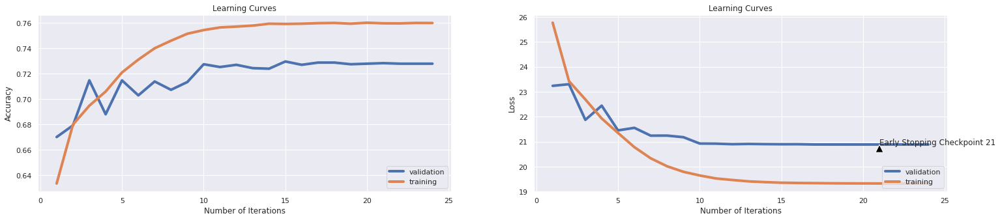

              precision    recall  f1-score
neutral        0.772686  0.807512  0.789715
antivax        0.723077  0.317568  0.441315
provax         0.680462  0.767644  0.721429
macro avg      0.725408  0.630908  0.650819
weighted avg   0.729030  0.727870  0.716964
Accuracy: 0.72787 

Total time: 53.11 seconds
Grid Search: 32, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.5993365047571357, 0.6802078117175764, 0.6999248873309964, 0.7133199799699549, 0.720956434651978, 0.7274661992989484, 0.7310966449674512, 0.7315973960941412]
Validation accuracy scores: [0.6739702015775635, 0.6814198071866784, 0.7160385626643295, 0.7142857142857143, 0.7252410166520596, 0.686678352322524, 0.7094653812445223, 0.7116564417177914]
Training f1 scores: [0.5230367997366177, 0.6359560414368806, 0.6638146406566121, 0.6863399611724491, 0.698023530169512, 0.7065388341902853, 0.7104260611315298, 0.7119666036775347]
Validat

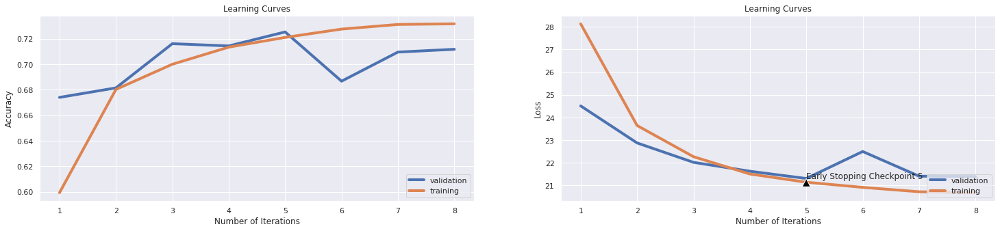

              precision    recall  f1-score
neutral        0.797271  0.768075  0.782401
antivax        0.770492  0.158784  0.263305
provax         0.635146  0.824104  0.717391
macro avg      0.734303  0.583654  0.587699
weighted avg   0.728365  0.711656  0.688831
Accuracy: 0.71166 

Total time: 18.57 seconds
Grid Search: 33, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4668252378567852, 0.467513770655984, 0.5326114171256885, 0.6250625938908363, 0.6582999499248874, 0.6730721081622434, 0.685027541311968, 0.6892839258888332, 0.6968577866800201, 0.702741612418628, 0.7110040060090135, 0.7175763645468203, 0.7223335002503756, 0.728843264897346, 0.7341011517275914, 0.7383575363044567, 0.7386705057586379, 0.7430520781171758, 0.7457436154231347, 0.7454306459689535, 0.7479344016024037, 0.7488107160741112, 0.746807711567351, 0.7492488733099649, 0.74899849774662, 0.75100150225338, 0.7525663495242865,

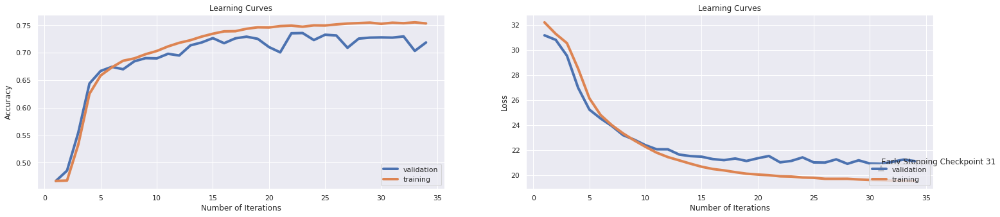

              precision    recall  f1-score
neutral        0.718332  0.857277  0.781678
antivax        0.699346  0.361486  0.476615
provax         0.721445  0.672096  0.695897
macro avg      0.713041  0.630286  0.651396
weighted avg   0.717126  0.718230  0.707487
Accuracy: 0.71823 

Total time: 79.42 seconds
Grid Search: 34, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6335127691537306, 0.6645593390085127, 0.6774536805207811, 0.6881572358537806, 0.6954181271907862, 0.706434651977967, 0.7135703555333, 0.7174511767651477, 0.7242739108662994, 0.7259639459188784, 0.7272158237356035]
Validation accuracy scores: [0.6673970201577564, 0.661262050832603, 0.6822962313759859, 0.6783523225241017, 0.686678352322524, 0.6919368974583698, 0.6971954425942156, 0.6971954425942156, 0.696319018404908, 0.6989482909728308, 0.7011393514461]
Training f1 scores: [0.57927957324875, 0.6207407696418489, 0.633910831015505

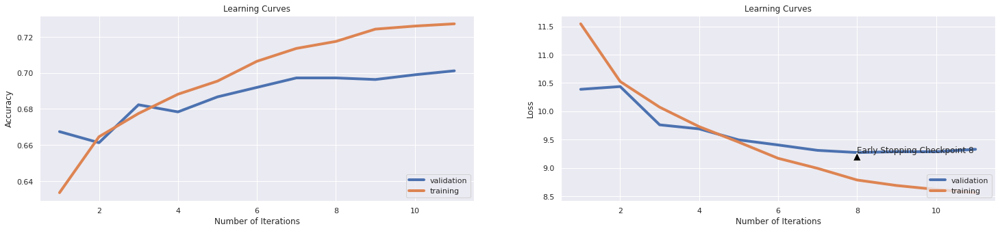

              precision    recall  f1-score
neutral        0.816973  0.750235  0.782183
antivax        0.794872  0.104730  0.185075
provax         0.608696  0.836048  0.704483
macro avg      0.740180  0.563671  0.557247
weighted avg   0.730047  0.701139  0.673372
Accuracy: 0.70114 

Total time: 24.30 seconds
Grid Search: 35, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6130445668502754, 0.6787681522283425, 0.690473209814722, 0.6935403104656985, 0.6977341011517276, 0.6986730095142714, 0.700300450676014, 0.7030545818728092, 0.7036805207811717, 0.7078117175763645, 0.7093139709564347, 0.7101902854281422, 0.7157611417125689, 0.717764146219329, 0.7124436654982473, 0.7160115172759138, 0.7192038057085628, 0.7193915873810716]
Validation accuracy scores: [0.6700262927256793, 0.6709027169149868, 0.6805433829973707, 0.6722173531989483, 0.6827344434706398, 0.6827344434706398, 0.6858019281332165, 0.6849255039439

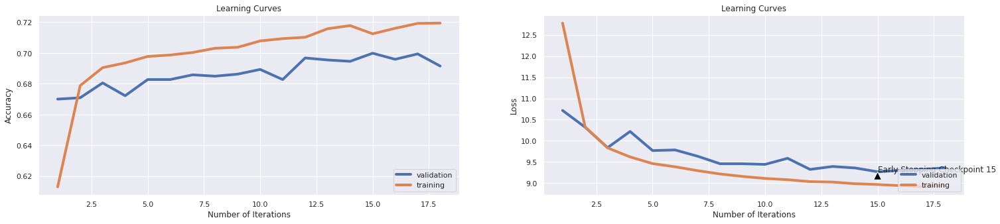

              precision    recall  f1-score
neutral        0.830250  0.716432  0.769153
antivax        0.823529  0.094595  0.169697
provax         0.592175  0.854506  0.699556
macro avg      0.748651  0.555177  0.546135
weighted avg   0.733293  0.691499  0.663308
Accuracy: 0.69150 

Total time: 40.03 seconds
Grid Search: 36, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4810966449674512, 0.5696670005007511, 0.6209313970956435, 0.6491612418627942, 0.6701301952929394, 0.6784551827741613, 0.6857160741111668, 0.6898472709063596, 0.692914371557336, 0.6969203805708563, 0.6988607911867801, 0.7015523284927391, 0.7043690535803706, 0.707436154231347, 0.7046194291437156, 0.7088132198297447, 0.7082498748122183, 0.7095017526289434, 0.7078743114672008, 0.7105658487731598, 0.7103154732098147, 0.7124436654982473, 0.7136329494241362, 0.7156985478217326, 0.7156985478217326, 0.7197045568352529, 0.717764146219329, 

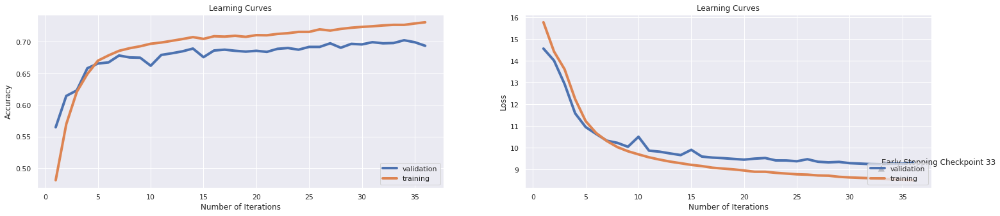

              precision    recall  f1-score
neutral        0.726754  0.836620  0.777826
antivax        0.829268  0.114865  0.201780
provax         0.648276  0.714441  0.679752
macro avg      0.734766  0.555308  0.553120
weighted avg   0.708378  0.693690  0.663525
Accuracy: 0.69369 

Total time: 81.07 seconds
Grid Search: 37, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4693289934902354, 0.4850400600901352, 0.5164621932899349, 0.5496369554331497, 0.5747371056584877, 0.5999624436654982, 0.6194291437155733, 0.6344516775162744, 0.6412744116174262, 0.6467200801201802, 0.6554206309464197, 0.6604907361041562, 0.6647471206810215, 0.667313470205308, 0.6695042563845769, 0.6705683525287932, 0.671757636454682, 0.6720706059088633, 0.6728843264897346, 0.6738232348522785, 0.6747621432148222, 0.6748873309964948, 0.6753254882323485, 0.676139208813219

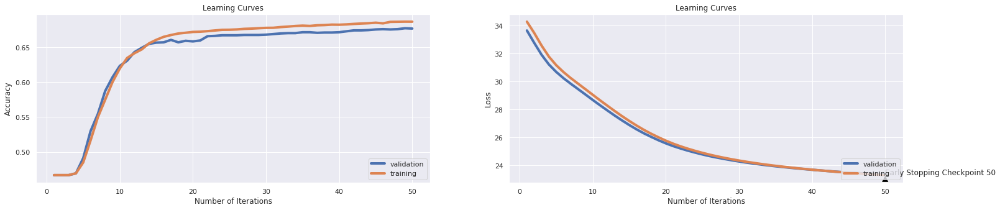

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.748025  0.800000  0.773140
antivax        0.000000  0.000000  0.000000
provax         0.605424  0.751357  0.670543
macro avg      0.451150  0.517119  0.481227
weighted avg   0.593445  0.676599  0.631448
Accuracy: 0.67660 

Total time: 142.16 seconds
Grid Search: 38, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.1298197295943916, 0.12969454181271908, 0.13244867300951427, 0.14828492739108662, 0.20455683525287932, 0.29844767150726087, 0.367613920881322, 0.39784677015523284, 0.40348022033049574, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.40348022033049574, 0.40348022033049574, 0.4129944917376064, 0.42113169754631946, 0.4243239859789685, 0.42826740110165246, 0.43289934902353533, 0.43878317476214324, 0.4475463194792188, 0.46219328993490233, 0.48253630445668505, 0.5036304456685028, 0.5324236354531797, 0.5570230345518278,

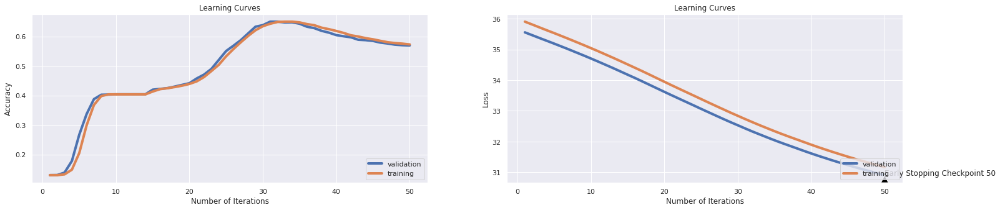

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.536340  0.949296  0.685424
antivax        0.000000  0.000000  0.000000
provax         0.725441  0.312704  0.437026
macro avg      0.420593  0.420666  0.374150
weighted avg   0.543091  0.569238  0.496265
Accuracy: 0.56924 

Total time: 140.17 seconds
Grid Search: 39, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.3370055082623936, 0.33957185778668003, 0.34007260891337004, 0.3404481722583876, 0.34063595393089635, 0.3409489233850776, 0.34157486229344014, 0.34245117676514775, 0.34295192789183776, 0.3437656484727091, 0.34470455683525286, 0.34514271407110664, 0.34595643465197795, 0.34651977966950426, 0.34695793690535803, 0.3471457185778668, 0.3475838758137206, 0.3482098147220831, 0.3485227841762644, 0.3497120681021532, 0.35008763144717076, 0.3507135703555333, 0.35133950926389584, 0.3520280420630946, 0.3523410115172759, 0.35309213820731095,

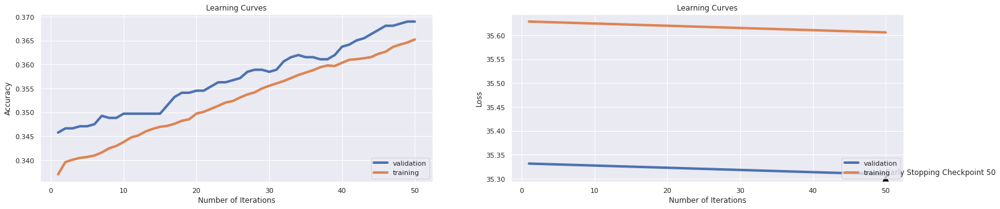

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.477082  0.693897  0.565417
antivax        0.140518  0.347973  0.200194
provax         0.000000  0.000000  0.000000
macro avg      0.205867  0.347290  0.255204
weighted avg   0.240879  0.368975  0.289845
Accuracy: 0.36897 

Total time: 138.30 seconds
Grid Search: 40, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.46670005007511267, 0.4668252378567852, 0.4670756134201302, 0.48854531797696543, 0.5691036554832248, 0.6242488733099649, 0.6425888833249875, 0.6546069103655483, 0.6586755132699048, 0.6637456184276415, 0.6664997496244367, 0.6672508763144717, 0.6695668502754131, 0.6723209814722083, 0.6736354531797697, 0.6746369554331497, 0.6748247371056585, 0.6750125187781673, 0.6763269904857286, 0.6767025538307461, 0.6773284927391087, 0.6774536805207811, 0.6777040560841262, 0.6791437155733601, 0.679394091136705, 0.6803329994992489, 0.6799574361542313, 

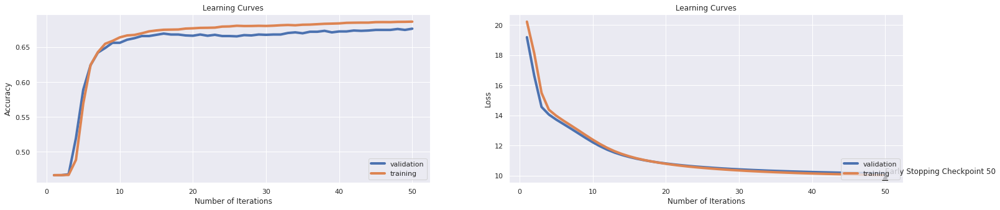

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.784124  0.760563  0.772164
antivax        0.000000  0.000000  0.000000
provax         0.586869  0.795874  0.675576
macro avg      0.456998  0.518812  0.482580
weighted avg   0.602804  0.676161  0.633024
Accuracy: 0.67616 

Total time: 143.59 seconds
Grid Search: 41, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4655733600400601, 0.46670005007511267, 0.4667626439659489, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4670130195292939, 0.4670756134201302, 0.4675763645468202, 0.46770155232849275, 0.4678893340010015, 0.468014521782674, 0.468014521782674, 0.4680771156735103, 0.4683274912368553, 0.46839008512769154,

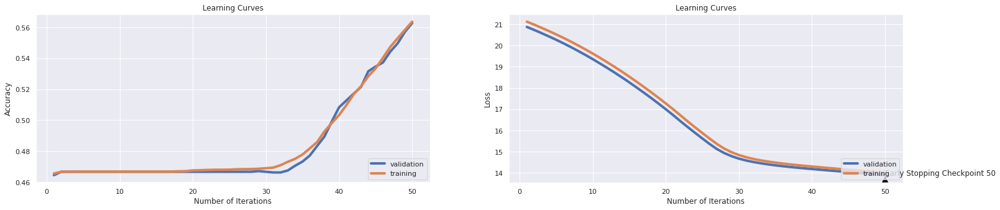

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.531217  0.958685  0.683629
antivax        0.000000  0.000000  0.000000
provax         0.730556  0.285559  0.410617
macro avg      0.420591  0.414748  0.364749
weighted avg   0.542764  0.562664  0.484769
Accuracy: 0.56266 

Total time: 142.14 seconds
Grid Search: 42, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.2784176264396595, 0.278542814221332, 0.27898097145718576, 0.27954431647471206, 0.27973209814722083, 0.28029544316474714, 0.2807336004006009, 0.2811717576364547, 0.28160991487230846, 0.28179769654481723, 0.2827991987981973, 0.2862418627941913, 0.2864922383575363, 0.28693039559339006, 0.2873059589384076, 0.2877441161742614, 0.28874561842764146, 0.2892463695543315, 0.29031046569854785, 0.29081121682523786, 0.2909364046069104, 0.29124937406109164, 0.29181271907861794, 0.2922508763144717, 0.2931897846770155, 0.29331497245868804, 0.294128

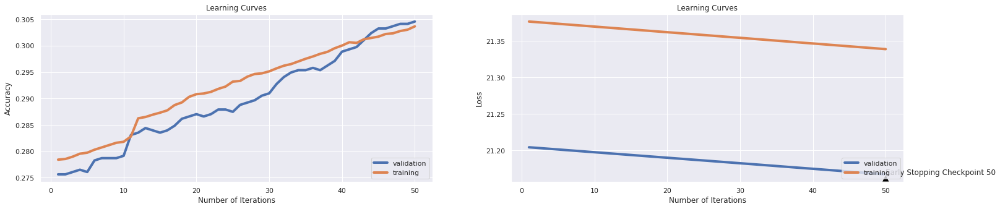

              precision    recall  f1-score
neutral        0.518325  0.185915  0.273670
antivax        0.151060  0.577703  0.239496
provax         0.424479  0.353963  0.386027
macro avg      0.364621  0.372527  0.299731
weighted avg   0.432811  0.304557  0.314584
Accuracy: 0.30456 

Total time: 141.24 seconds
Grid Search: 43, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.6551702553830746, 0.6730095142714071, 0.681835252879319, 0.6812719078617927, 0.6865923885828743, 0.6887831747621432, 0.6910365548322484, 0.6978592889334001, 0.6959188783174762, 0.6979218828242364, 0.7036179268903355, 0.7041812719078618, 0.7011141712568854, 0.7049949924887331, 0.7028668002003005, 0.7068102153229845, 0.7052453680520782, 0.7097521281922884]
Validation accuracy scores: [0.6695880806310254, 0.6840490797546013, 0.6853637160385626, 0.689307624890447, 0.689307624890447, 0.6971954425942156, 0.6923751095530236, 0.7050832602

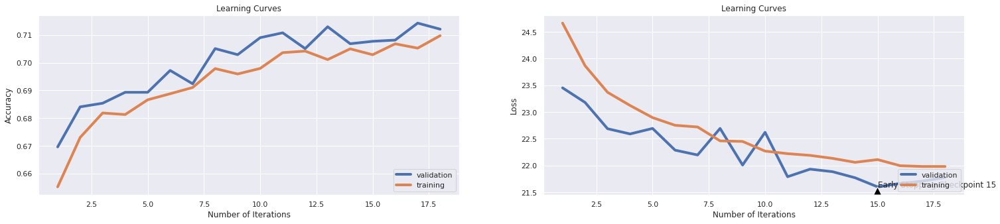

              precision    recall  f1-score
neutral        0.764126  0.800000  0.781651
antivax        0.718750  0.233108  0.352041
provax         0.657330  0.764387  0.706827
macro avg      0.713402  0.599165  0.613507
weighted avg   0.715138  0.712095  0.695728
Accuracy: 0.71209 

Total time: 87.97 seconds
Grid Search: 44, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6331997996995493, 0.6864046069103655, 0.6957936905358038, 0.7095017526289434, 0.7131321982974461, 0.717513770655984, 0.7207060590886329, 0.7275287931897847, 0.7228342513770656, 0.7240235353029544, 0.7257135703555333, 0.7242113169754631, 0.7270906359539309, 0.7282173259889835, 0.729093640460691, 0.7281547320981472, 0.7292814221331998, 0.7279669504256384]
Validation accuracy scores: [0.6831726555652936, 0.6849255039439088, 0.696319018404908, 0.7129710780017529, 0.7042068361086766, 0.7156003505696757, 0.7204206836108676, 0.7138475021

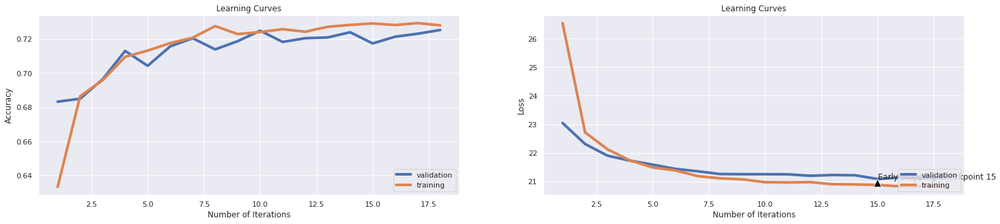

              precision    recall  f1-score
neutral        0.773017  0.796244  0.784459
antivax        0.754237  0.300676  0.429952
provax         0.672915  0.779587  0.722334
macro avg      0.733390  0.625502  0.645582
weighted avg   0.730181  0.725241  0.713402
Accuracy: 0.72524 

Total time: 58.84 seconds
Grid Search: 45, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.1299449173760641, 0.14102403605408112, 0.22827991987981974, 0.360478217325989, 0.42682774161241865, 0.4455433149724587, 0.468264897346019, 0.5057586379569354, 0.5436905358037055, 0.5885077616424637, 0.6228092138207311, 0.6502879318978467, 0.6613044566850276, 0.6614296444667, 0.6534176264396595, 0.6420881321982974, 0.6293189784677016, 0.6166750125187782, 0.6066599899849775, 0.596457185778668, 0.5901977966950426, 0.5828743114672008, 0.5784301452178268, 0.5754256384576866

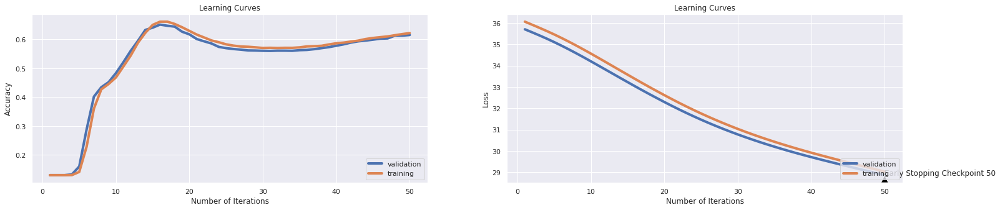

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.592570  0.928638  0.723482
antivax        0.000000  0.000000  0.000000
provax         0.676998  0.450597  0.541069
macro avg      0.423190  0.459745  0.421517
weighted avg   0.549782  0.615250  0.556018
Accuracy: 0.61525 

Total time: 158.53 seconds
Grid Search: 46, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.6451552328492739, 0.6605533299949925, 0.6631822734101152, 0.6700676014021032, 0.6760766149223836, 0.6763269904857286, 0.6796444667000501, 0.6798948422633951, 0.6829619429143715, 0.6841512268402604, 0.6822108162243365, 0.6873435152729094, 0.6864046069103655, 0.6856534802203305]
Validation accuracy scores: [0.6538124452234881, 0.663453111305872, 0.6687116564417178, 0.6682734443470639, 0.6625766871165644, 0.6748466257668712, 0.6757230499561788, 0.6730937773882559, 0.6739702015775635, 0.6809815950920245, 0.6779141104294478, 0.677914110429447

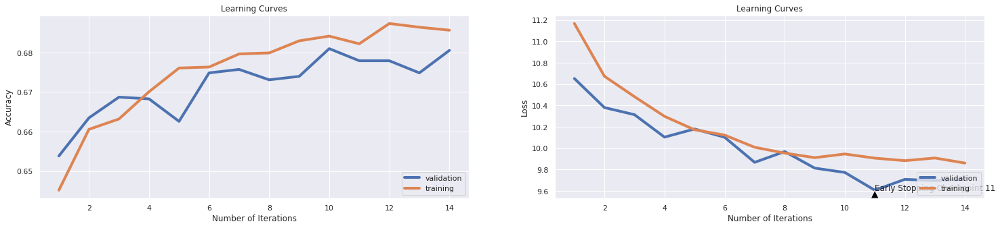

              precision    recall  f1-score
neutral        0.781818  0.767136  0.774408
antivax        0.500000  0.010135  0.019868
provax         0.595451  0.795874  0.681227
macro avg      0.625756  0.524382  0.491834
weighted avg   0.670047  0.680543  0.638928
Accuracy: 0.68054 

Total time: 71.85 seconds
Grid Search: 47, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6516024036054081, 0.6859664496745118, 0.6879694541812719, 0.690473209814722, 0.6911617426139208, 0.6912869303955934, 0.6926014021031547, 0.6920380570856285, 0.6927265898848273, 0.6967325988983475, 0.6945418127190787, 0.695605908863295, 0.6983600400600901, 0.6984852278417626, 0.699549323985979, 0.6967951927891838]
Validation accuracy scores: [0.6849255039439088, 0.6805433829973707, 0.6805433829973707, 0.6805433829973707, 0.6853637160385626, 0.6814198071866784, 0.6836108676599474, 0.6875547765118317, 0.6836108676599474, 0.6853637160385626,

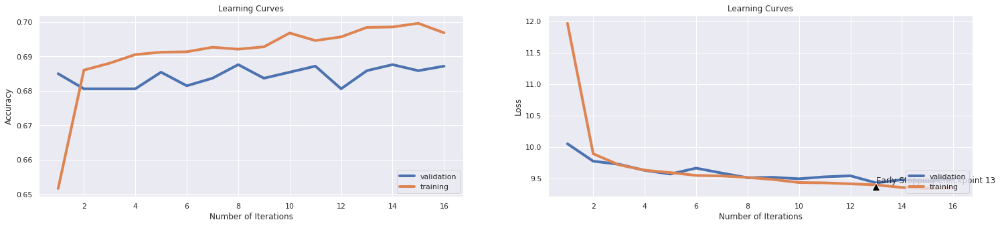

              precision    recall  f1-score
neutral        0.774315  0.769953  0.772128
antivax        0.923077  0.040541  0.077670
provax         0.608264  0.799131  0.690756
macro avg      0.768552  0.536542  0.513518
weighted avg   0.726594  0.687117  0.649208
Accuracy: 0.68712 

Total time: 55.71 seconds
Grid Search: 48, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.4624436654982474, 0.4981847771657486, 0.5259764646970456, 0.549949924887331, 0.5694792188282424, 0.5841261892839259, 0.5943915873810716, 0.6059714571857787, 0.6121056584877316, 0.6171757636454682, 0.6174261392088132, 0.6189909864797196, 0.6154857285928893, 0.6142338507761642, 0.6119178768152228, 0.6103530295443165, 0.6099774661992989, 0.6089759639459189, 0.6095393089634452, 0.6121056584877316, 0.6172383575363044, 0.6227466199298949, 0.6285052578868302, 0.636579869804707, 0.6393965948923385, 0.6464697045568353, 0.6519779669504256, 0.65686

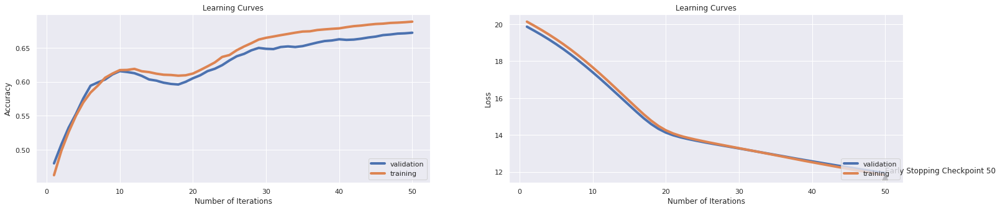

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.712783  0.827230  0.765754
antivax        0.000000  0.000000  0.000000
provax         0.624283  0.709012  0.663955
macro avg      0.445689  0.512081  0.476570
weighted avg   0.584609  0.672217  0.625342
Accuracy: 0.67222 

Total time: 147.47 seconds
Grid Search: 49, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6037180771156735, 0.6972959439158738, 0.7274036054081122, 0.7458688032048072, 0.7654606910365548, 0.7784176264396595, 0.7876189283925888, 0.796507260891337]
Validation accuracy scores: [0.6954425942156004, 0.6757230499561788, 0.7248028045574058, 0.7322524101665207, 0.7304995617879053, 0.7291849255039439, 0.7269938650306749, 0.7287467134092901]
Training f1 scores: [0.53681833884923, 0.6761300494298703, 0.7153660240088382, 0.737793386230958, 0.7591741917742835, 0.7731515581127365, 0.7835452159094477, 0.7924519103649058]
V

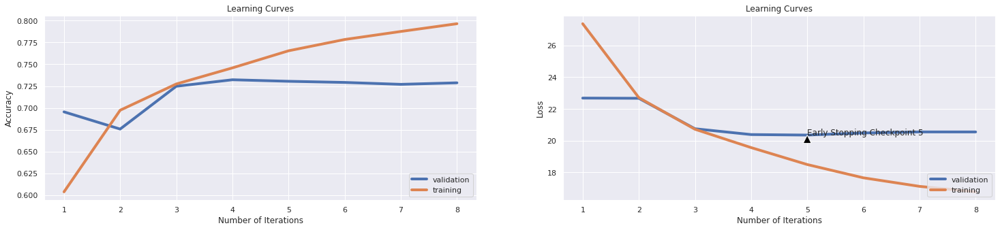

              precision    recall  f1-score
neutral        0.801390  0.757746  0.778958
antivax        0.568841  0.530405  0.548951
provax         0.699700  0.758958  0.728125
macro avg      0.689977  0.682370  0.685345
weighted avg   0.730184  0.728747  0.728608
Accuracy: 0.72875 

Total time: 27.83 seconds
Grid Search: 50, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46738858287431145, 0.578492739108663, 0.6633700550826239, 0.684526790185278, 0.6974837255883826, 0.7107536304456685, 0.729594391587381, 0.7448673009514272, 0.7496870305458188, 0.7565097646469705, 0.7622058087130696, 0.76721331997997, 0.7732223335002504]
Validation accuracy scores: [0.46669588080631025, 0.6411042944785276, 0.6446099912357581, 0.6831726555652936, 0.6923751095530236, 0.703330411919369, 0.7191060473269062, 0.7261174408413672, 0.7199824715162139, 0.7283085013146363, 0.7147239263803681, 0.7248028045574058, 0.7221735

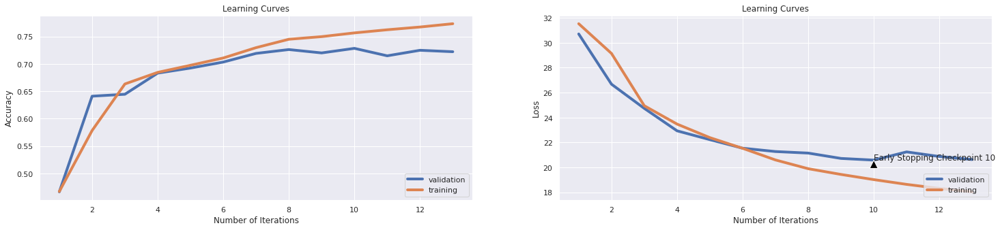

              precision    recall  f1-score
neutral        0.812823  0.738028  0.773622
antivax        0.616162  0.412162  0.493927
provax         0.662489  0.803474  0.726202
macro avg      0.697158  0.651222  0.664584
weighted avg   0.726640  0.722174  0.718204
Accuracy: 0.72217 

Total time: 43.92 seconds
Grid Search: 51, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4591261892839259, 0.5637205808713069, 0.6663119679519279, 0.6901602403605408, 0.7125062593890836, 0.7341011517275914, 0.7487481221832749, 0.7570731096644967, 0.7587631447170756]
Validation accuracy scores: [0.46669588080631025, 0.6384750219106047, 0.6761612620508326, 0.6901840490797546, 0.7085889570552147, 0.7164767747589833, 0.7226117440841368, 0.6560035056967572, 0.717353198948291]
Training f1 scores: [0.29593596163864677, 0.46950561559190856, 0.6233668289251811, 0.6457512499286084, 0.6818226660834015, 0.7199630360435578

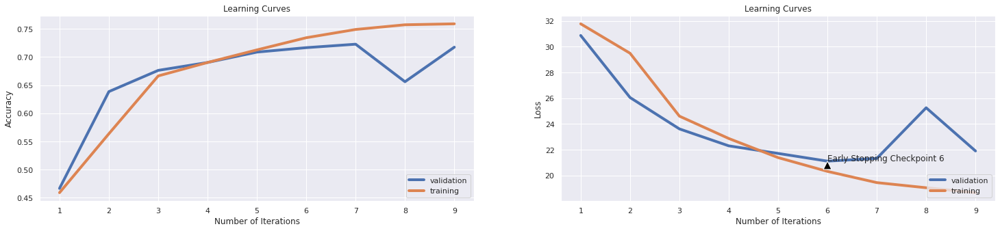

              precision    recall  f1-score
neutral        0.800193  0.778404  0.789148
antivax        0.462882  0.716216  0.562334
provax         0.756345  0.647123  0.697484
macro avg      0.673140  0.713914  0.682989
weighted avg   0.738743  0.717353  0.722733
Accuracy: 0.71735 

Total time: 34.90 seconds
Grid Search: 52, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6081622433650475, 0.6726339509263896, 0.6999874812218327, 0.7361041562343515, 0.7566975463194792, 0.7701552328492739, 0.7772283425137707, 0.7839258888332499, 0.7850525788683025, 0.7879944917376064]
Validation accuracy scores: [0.656441717791411, 0.654250657318142, 0.7094653812445223, 0.7212971078001753, 0.7261174408413672, 0.7191060473269062, 0.7326906222611744, 0.7296231375985978, 0.7296231375985978, 0.7296231375985978]
Training f1 scores: [0.5446500150008885, 0.6275921414357157, 0.6621499329179136, 0.7175919375756663, 0.74456

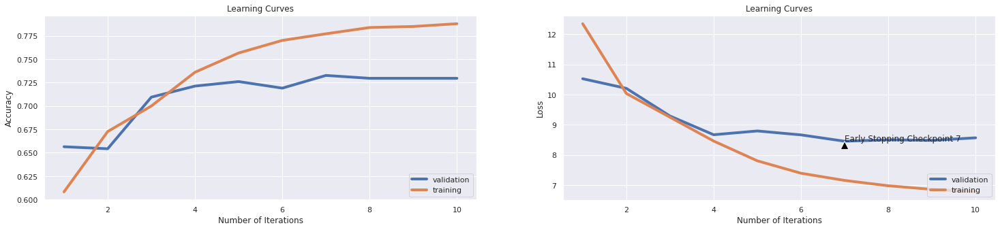

              precision    recall  f1-score
neutral        0.772025  0.798122  0.784857
antivax        0.600806  0.503378  0.547794
provax         0.713826  0.723127  0.718447
macro avg      0.695553  0.674876  0.683699
weighted avg   0.726328  0.729623  0.727305
Accuracy: 0.72962 

Total time: 34.78 seconds
Grid Search: 53, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.5725463194792189, 0.661179268903355, 0.6813970956434652, 0.6915998998497747, 0.6986104156234352, 0.7071231847771657, 0.7122558838257386, 0.7193915873810716, 0.7361041562343515, 0.75, 0.7592638958437656, 0.7639584376564847, 0.7703430145217827, 0.7759764646970456, 0.779043565348022, 0.7811717576364546]
Validation accuracy scores: [0.6608238387379491, 0.6687116564417178, 0.6792287467134093, 0.6814198071866784, 0.6748466257668712, 0.6879929886064855, 0.6901840490797546, 0.703330411919369, 0.7120946538124452, 0.6836108676599474, 0.7173531

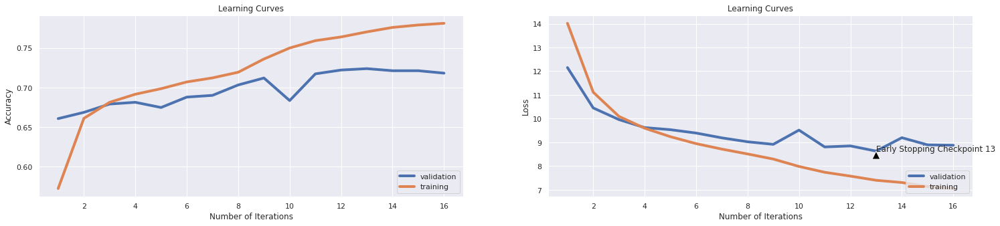

              precision    recall  f1-score
neutral        0.813278  0.736150  0.772794
antivax        0.750000  0.273649  0.400990
provax         0.639669  0.840391  0.726420
macro avg      0.734316  0.616730  0.633401
weighted avg   0.735003  0.718230  0.705851
Accuracy: 0.71823 

Total time: 55.28 seconds
Grid Search: 54, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.5338007010515774, 0.6199924887330996, 0.6735102653980971, 0.6895968953430145, 0.7008012018027041, 0.7118177265898848, 0.73278668002003, 0.7541311967951928, 0.758137205808713, 0.7627691537305958]
Validation accuracy scores: [0.6516213847502191, 0.6726555652936022, 0.6761612620508326, 0.6875547765118317, 0.686678352322524, 0.6967572304995618, 0.7169149868536372, 0.7204206836108676, 0.7142857142857143, 0.6958808063102542]
Training f1 scores: [0.44559743054498285, 0.5623495416124153, 0.6302746718796665, 0.646207104833018, 0.656770753

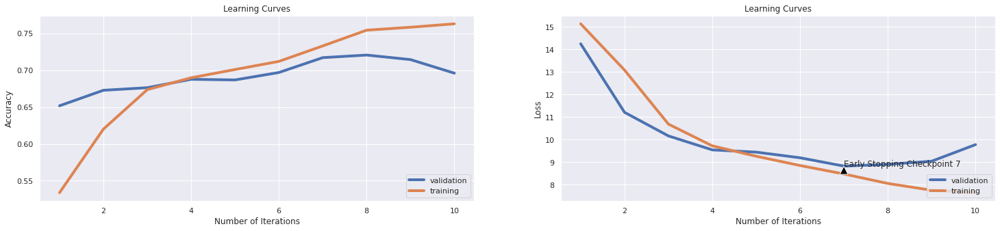

              precision    recall  f1-score
neutral        0.702556  0.851643  0.769949
antivax        0.520115  0.611486  0.562112
provax         0.777605  0.542888  0.639386
macro avg      0.666759  0.668673  0.657149
weighted avg   0.709181  0.695881  0.690296
Accuracy: 0.69588 

Total time: 38.55 seconds
Grid Search: 55, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.4103029544316475, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4

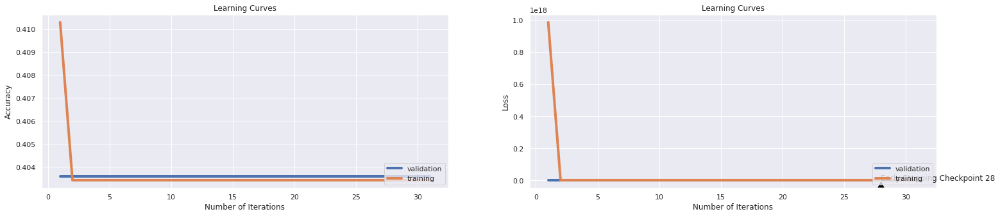

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.000000  0.000000  0.000000
antivax        0.000000  0.000000  0.000000
provax         0.403593  1.000000  0.575086
macro avg      0.134531  0.333333  0.191695
weighted avg   0.162888  0.403593  0.232101
Accuracy: 0.40359 

Total time: 135.60 seconds
Grid Search: 56, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6254381572358538, 0.7190786179268903, 0.735227841762644, 0.7400475713570356, 0.7449298948422634, 0.7453054581872809, 0.7449298948422634, 0.7431146720080121, 0.7454932398597897]
Validation accuracy scores: [0.6814198071866784, 0.7252410166520596, 0.724364592462752, 0.7274320771253286, 0.7042068361086766, 0.7269938650306749, 0.7252410166520596, 0.717353198948291, 0.6765994741454864]
Training f1 scores: [0.5616714308190942, 0.704527677687706, 0.7256025663791301, 0.7316488533437971, 0.7378401576275392, 0.7376444598730921, 0.

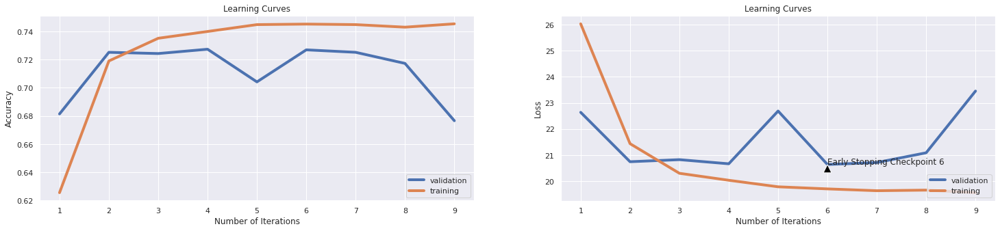

              precision    recall  f1-score
neutral        0.643873  0.892958  0.748230
antivax        0.774510  0.266892  0.396985
provax         0.731152  0.558089  0.633005
macro avg      0.716512  0.572646  0.592740
weighted avg   0.696043  0.676599  0.656166
Accuracy: 0.67660 

Total time: 41.15 seconds
Grid Search: 57, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4668252378567852, 0.5357411116675013, 0.6643089634451678, 0.6931021532298448, 0.7187030545818728, 0.7414872308462694, 0.7548823234852279, 0.76721331997997, 0.7677766649974962, 0.7719704556835253, 0.7709689534301453]
Validation accuracy scores: [0.46669588080631025, 0.656441717791411, 0.6748466257668712, 0.6849255039439088, 0.7046450482033304, 0.7059596844872918, 0.71034180543383, 0.7230499561787905, 0.7191060473269062, 0.6884312007011394, 0.7248028045574058]
Training f1 scores: [0.30240220536447054, 0.4298991508553104

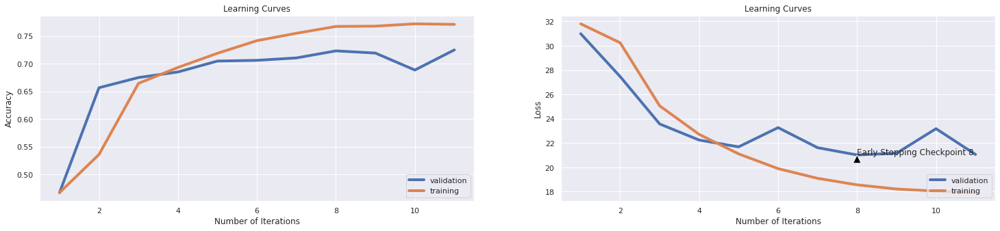

              precision    recall  f1-score
neutral        0.821990  0.737089  0.777228
antivax        0.538983  0.537162  0.538071
provax         0.687984  0.770901  0.727087
macro avg      0.682986  0.681718  0.680795
weighted avg   0.731197  0.724803  0.725970
Accuracy: 0.72480 

Total time: 50.27 seconds
Grid Search: 58, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.6085378067100651, 0.6553580370555834, 0.6686905358037055, 0.6759514271407111, 0.6867801702553831, 0.6967951927891838, 0.7109414121181773, 0.7168252378567852, 0.725400600901352, 0.73078367551327, 0.7387956935403105]
Validation accuracy scores: [0.6757230499561788, 0.6148115687992989, 0.6161262050832603, 0.6665205959684487, 0.6765994741454864, 0.6735319894829097, 0.6700262927256793, 0.6801051709027169, 0.677475898334794, 0.679666958808063, 0.6827344434706398]
Training f1 scores: [0.5477317477700107, 0.6100267277287394, 0.623

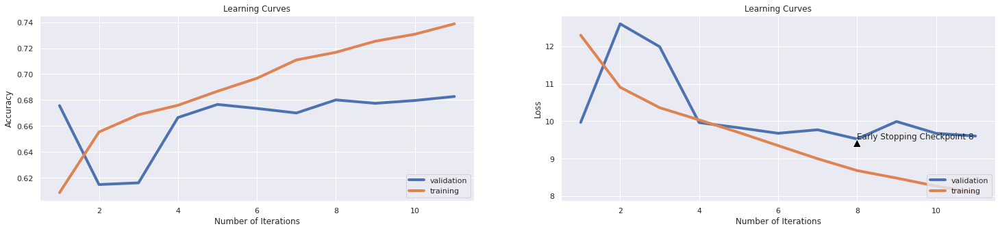

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.777985  0.783099  0.780533
antivax        0.000000  0.000000  0.000000
provax         0.598347  0.786102  0.679493
macro avg      0.458777  0.523067  0.486676
weighted avg   0.604571  0.682734  0.638511
Accuracy: 0.68273 

Total time: 49.14 seconds
Grid Search: 59, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6436529794692039, 0.6943540310465699, 0.7272158237356035, 0.7373560340510766, 0.7410490736104156, 0.743865798698047]
Validation accuracy scores: [0.6638913234005258, 0.7024539877300614, 0.7138475021910605, 0.6932515337423313, 0.7208588957055214, 0.7142857142857143]
Training f1 scores: [0.5906207174930371, 0.6542223819540386, 0.7118372416020755, 0.7272858852297888, 0.7306475306959718, 0.7342807262349669]
Validation f1 scores: [0.6191327090039587, 0.6815853742475964, 0.6967225822421387, 0.680418279602323, 0.7254865127324013, 0.718

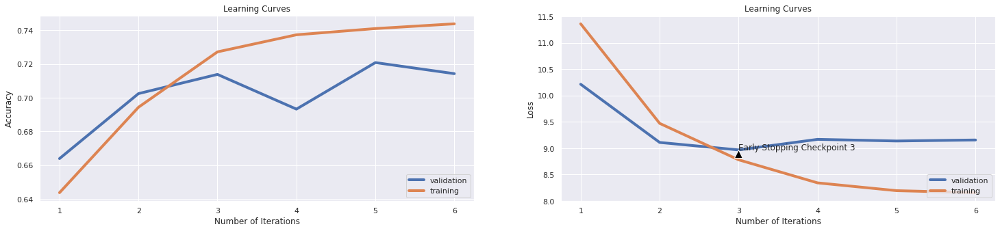

              precision    recall  f1-score
neutral        0.759857  0.796244  0.777625
antivax        0.511561  0.597973  0.551402
provax         0.737805  0.656895  0.695003
macro avg      0.669741  0.683704  0.674677
weighted avg   0.718750  0.714286  0.714936
Accuracy: 0.71429 

Total time: 26.76 seconds
Grid Search: 60, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.5445668502754131, 0.6367050575863795, 0.6765147721582374, 0.6944166249374061, 0.7045568352528793, 0.7095017526289434, 0.7175763645468203, 0.743865798698047, 0.7601402103154732, 0.767964446670005, 0.7729719579369053, 0.7768527791687532, 0.7766024036054081]
Validation accuracy scores: [0.5810692375109553, 0.6603856266432954, 0.6726555652936022, 0.6853637160385626, 0.6831726555652936, 0.6814198071866784, 0.7007011393514461, 0.6971954425942156, 0.7156003505696757, 0.7256792287467134, 0.7055214723926381, 0.7142857142857143, 0.717

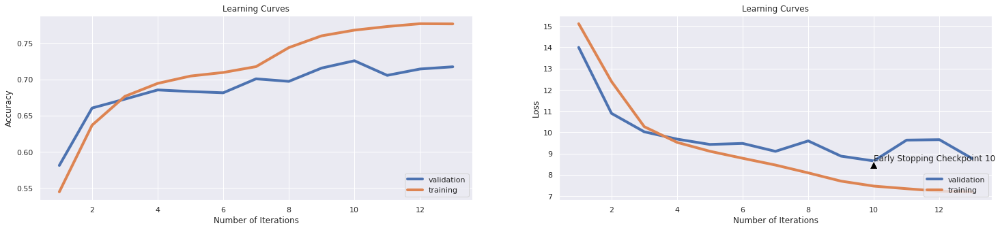

              precision    recall  f1-score
neutral        0.783028  0.762441  0.772598
antivax        0.650000  0.351351  0.456140
provax         0.664516  0.782845  0.718843
macro avg      0.699181  0.632212  0.649194
weighted avg   0.717942  0.717353  0.709855
Accuracy: 0.71735 

Total time: 56.38 seconds
Grid Search: 61, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.46920380570856285, 0.5404356534802204, 0.6364546820230346, 0.6680020030045067, 0.6750125187781673, 0.6795818728092138, 0.6842764146219329, 0.6887205808713069, 0.6932273410115173, 0.6965448172258387, 0.700550826239359, 0.7062468703054582, 0.7120681021532298, 0.7159489233850777, 0.7183274912368552, 0.7207060590886329, 0.7245868803204807, 0.7275287931897847, 0.7299699549323986, 0.7309714571857787, 0.73228592889334, 0.7345393089634452, 0.7358537806710065, 0.7374186279419128, 0.7385453179769654, 0.7393590385578368, 0.7405483224

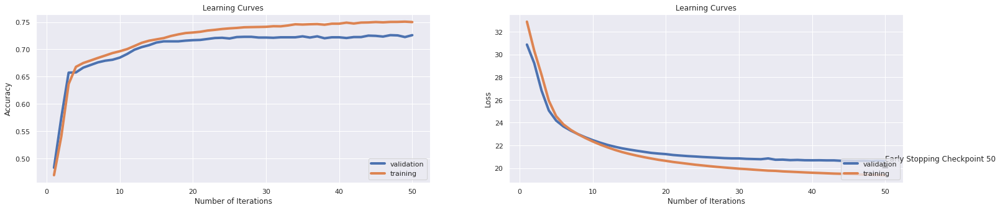

              precision    recall  f1-score
neutral        0.781395  0.788732  0.785047
antivax        0.625000  0.422297  0.504032
provax         0.687190  0.751357  0.717842
macro avg      0.697862  0.654129  0.668974
weighted avg   0.723088  0.726117  0.721473
Accuracy: 0.72612 

Total time: 311.72 seconds
Grid Search: 62, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4669504256384577, 0.4675763645468202, 0.4684526790185278, 0.46989233850776163, 0.47414872308462697, 0.48303705558337506, 0.4918627941912869, 0.5058212318477716, 0.5239734601902855, 0.5383074611917876, 0.5565222834251377, 0.5694792188282424, 0.5866299449173761, 0.5992739108662994, 0.6126064096144216, 0.6213695543314972, 0.6298823234852279, 0.6410866299449174, 0.649

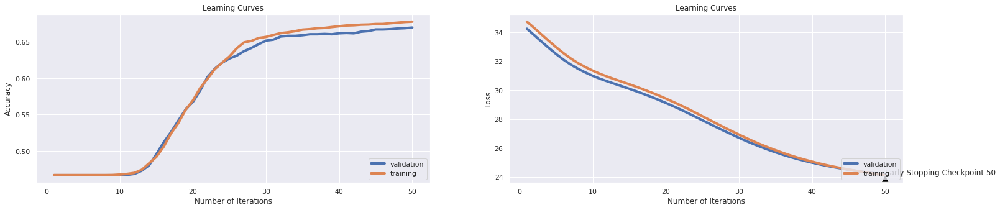

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.754973  0.784038  0.769231
antivax        0.000000  0.000000  0.000000
provax         0.589286  0.752443  0.660944
macro avg      0.448086  0.512160  0.476725
weighted avg   0.590175  0.669588  0.625750
Accuracy: 0.66959 

Total time: 307.41 seconds
Grid Search: 63, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.13488983475212818, 0.13507761642463695, 0.13564096144216325, 0.1362669003505258, 0.13683024536805208, 0.13708062093139708, 0.1378943415122684, 0.1391462193289935, 0.1407736604907361, 0.1428392588883325, 0.14415373059589384, 0.1458437656484727, 0.14678267401101652, 0.14922383575363043, 0.15103905858788183, 0.15266649974962443, 0.15548322483725588, 0.15811216825237856, 0.16186780170255383, 0.16512268402603905, 0.168064596895343, 0.17050575863795694, 0.174949924887331, 0.17820480721081622, 0.18158487731597395, 0.18577866800

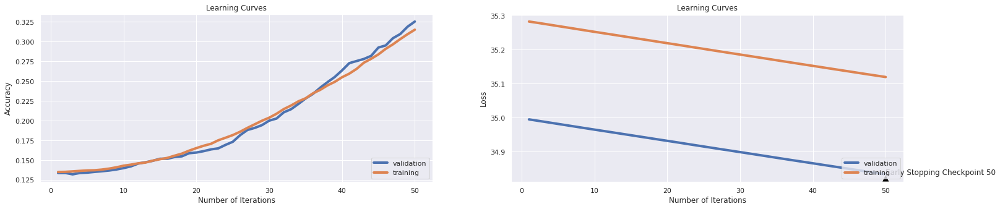

              precision    recall  f1-score
neutral        0.506964  0.170892  0.255618
antivax        0.132212  0.371622  0.195035
provax         0.412466  0.488599  0.447316
macro avg      0.350547  0.343704  0.299323
weighted avg   0.420216  0.325153  0.325128
Accuracy: 0.32515 

Total time: 303.75 seconds
Grid Search: 64, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.5105157736604907, 0.6444041061592388, 0.6701301952929394, 0.675701051577366, 0.6796444667000501, 0.6859664496745118, 0.688470205307962, 0.6904106159238859, 0.6945418127190787, 0.6964196294441662, 0.6982974461692539, 0.6991111667501252, 0.7029293940911367, 0.7024912368552829, 0.7028668002003005, 0.7064972458688032, 0.7067476214321482, 0.7092513770655984, 0.7115673510265398, 0.7141962944416625, 0.7163870806209314, 0.7188908362543815, 0.721457185778668, 0.7245868803204807, 0.7272158237356035, 0.7299073610415624, 0.7316599899849775,

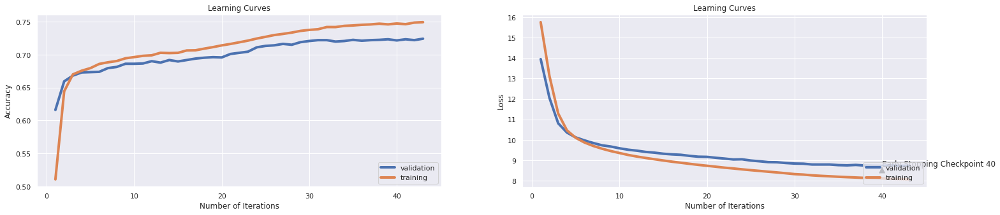

              precision    recall  f1-score
neutral        0.785647  0.781221  0.783427
antivax        0.670588  0.385135  0.489270
provax         0.671415  0.767644  0.716312
macro avg      0.709217  0.644667  0.663003
weighted avg   0.724619  0.724365  0.718185
Accuracy: 0.72436 

Total time: 257.36 seconds
Grid Search: 65, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46976715072608916, 0.4828492739108663, 0.5011892839258888, 0.5210941412118177, 0.5515773660490736, 0.5805583375062594, 0.5923259889834752, 0.6054081121682524, 0.6165498247371056, 0.6270030045067602, 0.6335127691537306, 0.6375187781672509, 0.6454682023034551, 0.6517275913870806, 0.6567976965448172, 0.6575488232348523, 0.660177766649975, 0.6625563345017527, 0.6633700550826239, 0.6670005007511267, 0.667313470205308, 0.6705057586379569, 0.6726339509263896, 0.6735102653980971, 0.6748873309964948, 0.6764521782674011, 0.67845518277416

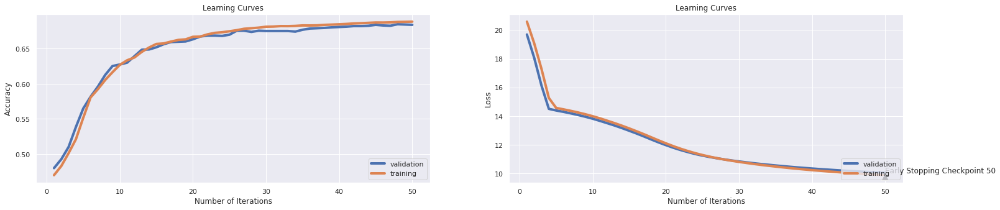

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.794521  0.762441  0.778150
antivax        0.000000  0.000000  0.000000
provax         0.594444  0.813246  0.686841
macro avg      0.462988  0.525229  0.488330
weighted avg   0.610713  0.684049  0.640364
Accuracy: 0.68405 

Total time: 301.09 seconds
Grid Search: 66, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.13000751126690036, 0.13000751126690036, 0.13000751126690036, 0.13000751126690036, 0.13000751126690036, 0.1299449173760641, 0.13000751126690036, 0.13000751126690036, 0.1300701051577366, 0.13000751126690036, 0.13013269904857286, 0.13025788683024536, 0.13032048072108163, 0.13057085628442663, 0.1306334501752629, 0.13057085628442663, 0.13082123184777167, 0.13057085628442663, 0.1308838257386079, 0.13132198297446168, 0.13176014021031549, 0.132135703555333, 0.13219829744616926, 0.13288683024536804, 0.13338758137205808, 0.13370055082623

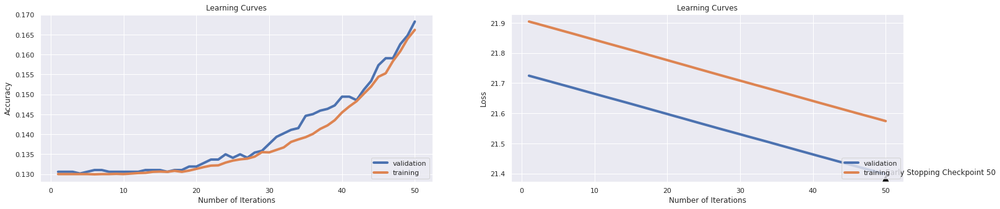

              precision    recall  f1-score
neutral        0.377778  0.015962  0.030631
antivax        0.129958  0.841216  0.225136
provax         0.367601  0.128122  0.190016
macro avg      0.291779  0.328433  0.148594
weighted avg   0.341526  0.168273  0.120187
Accuracy: 0.16827 

Total time: 308.84 seconds
Grid Search: 67, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.6637456184276415, 0.6837756634952429, 0.6997371056584877, 0.707185778668002, 0.7125062593890836, 0.7121306960440661, 0.7180771156735103, 0.7150726089133701, 0.7138833249874812]
Validation accuracy scores: [0.6901840490797546, 0.7002629272567923, 0.6993865030674846, 0.7112182296231376, 0.7177914110429447, 0.7169149868536372, 0.7063978965819456, 0.7278702892199824, 0.6989482909728308]
Training f1 scores: [0.6392971040253548, 0.669765677540513, 0.6888820765024328, 0.6983725503075858, 0.7046571455961183, 0.7034082908348487, 0.710

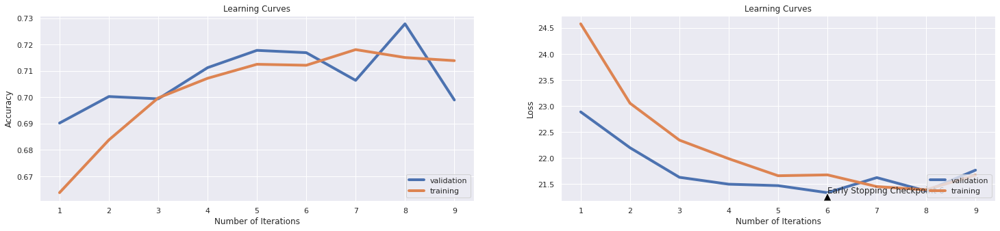

              precision    recall  f1-score
neutral        0.727731  0.813146  0.768071
antivax        0.546218  0.439189  0.486891
provax         0.701405  0.650380  0.674930
macro avg      0.658452  0.634238  0.643297
weighted avg   0.693562  0.698948  0.694008
Accuracy: 0.69895 

Total time: 49.57 seconds
Grid Search: 68, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6788307461191788, 0.7213945918878317, 0.7331622433650475, 0.7346644967451177, 0.7463695543314972, 0.7556960440660991, 0.7628317476214321, 0.7725338007010516, 0.7796069103655483]
Validation accuracy scores: [0.7191060473269062, 0.7283085013146363, 0.7230499561787905, 0.726555652936021, 0.7239263803680982, 0.7278702892199824, 0.7212971078001753, 0.7156003505696757, 0.7217353198948291]
Training f1 scores: [0.6519735581634921, 0.7129497104858097, 0.725881887938511, 0.7292281682153475, 0.7410487406984093, 0.7509869020402659, 0.758

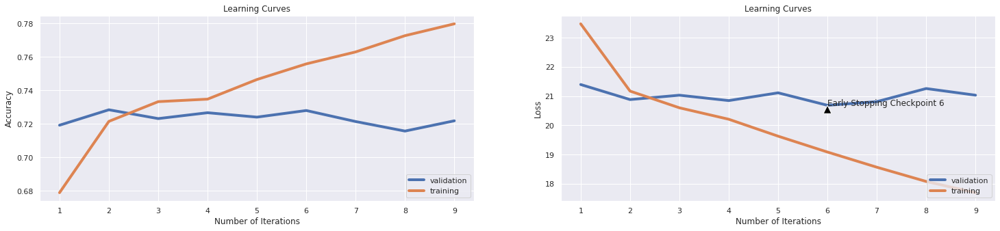

              precision    recall  f1-score
neutral        0.785305  0.772770  0.778987
antivax        0.588235  0.439189  0.502901
provax         0.685094  0.753529  0.717684
macro avg      0.686211  0.655163  0.666524
weighted avg   0.719299  0.721735  0.718434
Accuracy: 0.72174 

Total time: 49.58 seconds
Grid Search: 69, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.4668252378567852, 0.46813970956434653, 0.48322483725588383, 0.5175888833249875, 0.5590886329494241, 0.5958938407611417, 0.631634952428643, 0.6497245868803205, 0.6691286930395594, 0.6792063094641962, 0.6822108162243365, 0.6870931397095643, 0.6917250876314471, 0.6937280921382073, 0.6955433149724587, 0.6975463194792189, 0.6991737606409615, 0.7006760140210315, 0.7030545818728092, 0.7043690535803706, 0.7061842764146219, 0.7081872809213821, 0.7091261892839259, 0.7103154732

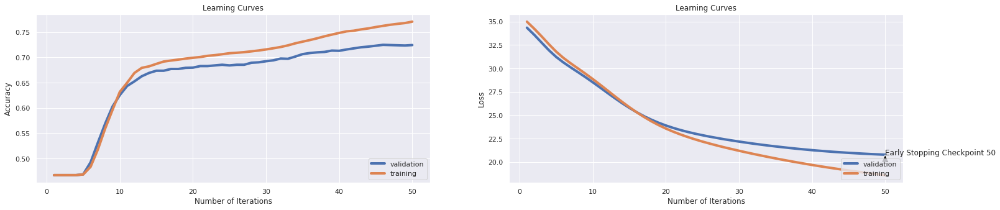

              precision    recall  f1-score
neutral        0.775137  0.796244  0.785549
antivax        0.689189  0.344595  0.459459
provax         0.675962  0.763301  0.716981
macro avg      0.713429  0.634713  0.653996
weighted avg   0.723962  0.724365  0.715578
Accuracy: 0.72436 

Total time: 276.54 seconds
Grid Search: 70, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.650350525788683, 0.674449173760641, 0.6858412618928392, 0.6984226339509264, 0.6972333500250375, 0.7023034551827742, 0.7044316474712068, 0.7058713069604406, 0.7020530796194292, 0.7061216825237857, 0.7101276915373059, 0.710378067100651]
Validation accuracy scores: [0.6713409290096407, 0.6989482909728308, 0.6770376862401403, 0.6849255039439088, 0.708150744960561, 0.71034180543383, 0.6928133216476775, 0.7037686240140227, 0.7120946538124452, 0.7042068361086766, 0.7072743207712533, 0.7125328659070991]
Training f1 scores: [0.61240691791433

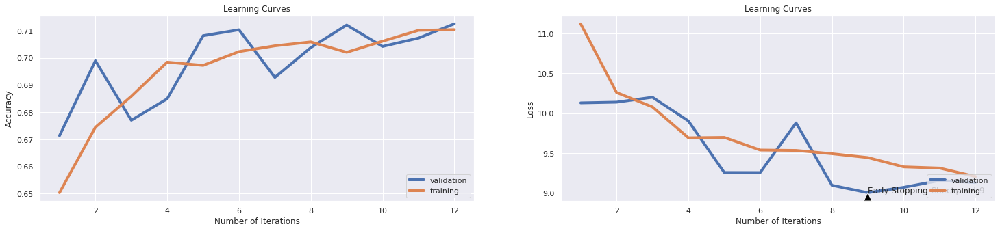

              precision    recall  f1-score
neutral        0.798787  0.741784  0.769231
antivax        0.560150  0.503378  0.530249
provax         0.668939  0.745928  0.705339
macro avg      0.675959  0.663697  0.668273
weighted avg   0.715427  0.712533  0.712446
Accuracy: 0.71253 

Total time: 68.53 seconds
Grid Search: 71, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6756384576865297, 0.7167000500751126, 0.7222083124687031, 0.7351026539809714, 0.742864296444667, 0.7543815723585378, 0.7597020530796195, 0.7645843765648472, 0.7724086129193791]
Validation accuracy scores: [0.7134092900964066, 0.71034180543383, 0.7195442594215601, 0.7217353198948291, 0.7221735319894829, 0.7234881682734443, 0.7199824715162139, 0.7252410166520596, 0.7287467134092901]
Training f1 scores: [0.6451455337812165, 0.703494220918427, 0.7105378472122791, 0.7257362460063048, 0.7341279565622472, 0.7456150073819128, 0.751753848993

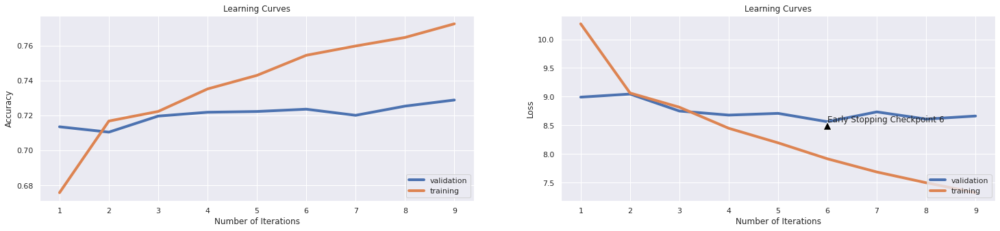

              precision    recall  f1-score
neutral        0.764184  0.809390  0.786138
antivax        0.676829  0.375000  0.482609
provax         0.696970  0.749186  0.722135
macro avg      0.712661  0.644525  0.663627
weighted avg   0.725726  0.728747  0.720936
Accuracy: 0.72875 

Total time: 52.74 seconds
Grid Search: 72, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.32761642463695545, 0.44053580370555834, 0.6047821732598898, 0.5799323985978968, 0.6075988983475212, 0.6352653980971458, 0.6562969454181272, 0.6708813219829745, 0.6841512268402604, 0.6920380570856285, 0.6944166249374061, 0.6962318477716575, 0.6983600400600901, 0.7017401101652478, 0.703242363545318, 0.7062468703054582, 0.7080620931397096, 0.7097521281922884, 0.7106284426639959, 0.7126940410615924, 0.7141337005508263, 0.715322984476715, 0.7172008012018027, 0.7183900851276915, 0.7202679018527791, 0.7220205307961943, 0.7238983475212819, 

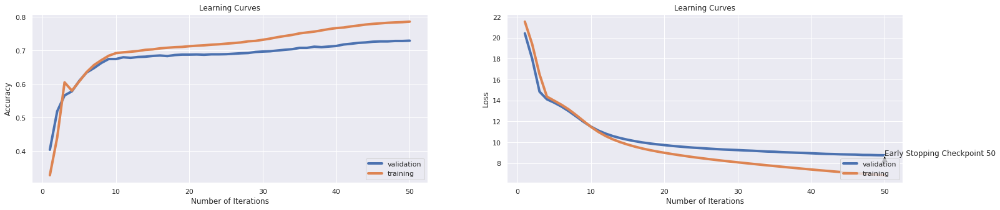

              precision    recall  f1-score
neutral        0.789524  0.778404  0.783924
antivax        0.688623  0.388514  0.496760
provax         0.676056  0.781759  0.725076
macro avg      0.718068  0.649559  0.668587
weighted avg   0.730641  0.729185  0.722925
Accuracy: 0.72918 

Total time: 285.01 seconds
Grid Search: 73, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.581685027541312, 0.6697546319479218, 0.7101276915373059, 0.7366675012518779, 0.7518152228342514, 0.7646469704556835, 0.7705307961942914, 0.7749123685528292, 0.7789183775663495, 0.7808587881822734, 0.7806084126189284, 0.7809213820731097, 0.7823610415623435, 0.7833625438157236, 0.7827366049073611, 0.7825488232348523, 0.7829243865798698, 0.7832373560340511, 0.7826114171256885, 0.7832999499248874, 0.782986980470706, 0.7830495743615423, 0.7829243865798698, 0.782986980470706, 0.782986980470706, 0.782986980470706, 0.7830495743

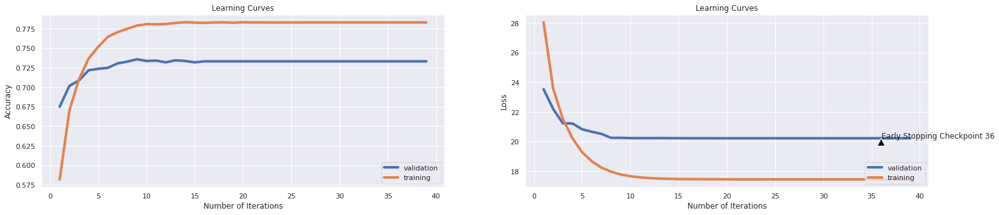

              precision    recall  f1-score
neutral        0.785380  0.786854  0.786116
antivax        0.657754  0.415541  0.509317
provax         0.692607  0.773073  0.730631
macro avg      0.711914  0.658489  0.675355
weighted avg   0.731383  0.733129  0.727819
Accuracy: 0.73313 

Total time: 130.27 seconds
Grid Search: 74, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46250625938908363, 0.4685778668002003, 0.5547696544817226, 0.6427766649974962, 0.6658738107160741, 0.6832123184777166, 0.6910991487230846, 0.6958562844266399, 0.7068728092138208, 0.706935403104657, 0.7121932899349024, 0.7152603905858789, 0.7187030545818728, 0.724649474211317, 0.7310340510766149, 0.7382949424136205, 0.7454306459689535, 0.752691537305959, 0.7597646469704556, 0.7626439659489234, 0.7668377566349525, 0.7702178267401102, 0.7695918878317476, 0.7754131196795193, 0.7772283425137707, 0.7772909364046069, 0.7794191286930

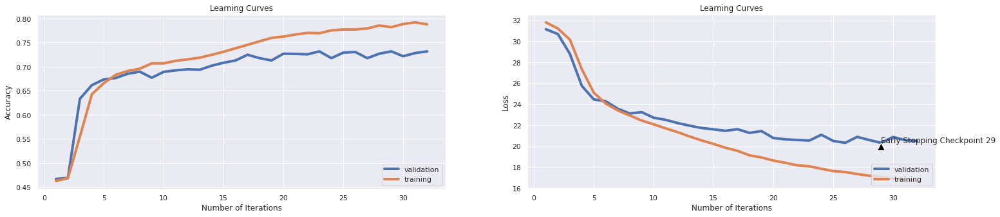

              precision    recall  f1-score
neutral        0.793169  0.784977  0.789051
antivax        0.728571  0.344595  0.467890
provax         0.672794  0.794788  0.728721
macro avg      0.731511  0.641453  0.661887
weighted avg   0.736207  0.731814  0.723044
Accuracy: 0.73181 

Total time: 108.77 seconds
Grid Search: 75, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.46357035553329995, 0.4668252378567852, 0.5629694541812719, 0.6552954431647471, 0.682336004006009, 0.6947295943915874, 0.7019904857285929, 0.7123810716074112, 0.7252754131196795, 0.7386079118678017, 0.7491862794191287, 0.752691537305959, 0.7635828743114672, 0.7608913370055083, 0.76871557336004, 0.7742864296444667, 0.7774787180771157, 0.7783550325488232, 0.7831121682523786, 0.7829243865798698, 0.7899349023535303, 0.7831747621432148]
Validation accuracy scores: [0.46669588080631025, 0.46669588080631025, 0.6463628396143734, 0

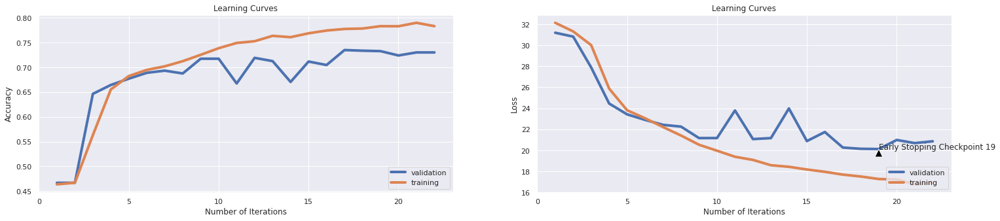

              precision    recall  f1-score
neutral        0.796172  0.781221  0.788626
antivax        0.522346  0.631757  0.571865
provax         0.736064  0.702497  0.718889
macro avg      0.684861  0.705158  0.693127
weighted avg   0.736395  0.730061  0.732364
Accuracy: 0.73006 

Total time: 87.32 seconds
Grid Search: 76, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5961442163244868, 0.6716324486730095, 0.6906609914872308, 0.7017401101652478, 0.7084376564847271, 0.7127566349524287, 0.7165748622934401, 0.7194541812719079, 0.7215197796695042, 0.7215197796695042, 0.7227716574862293, 0.722458688032048, 0.7235227841762644]
Validation accuracy scores: [0.6595092024539877, 0.6805433829973707, 0.6757230499561788, 0.6770376862401403, 0.684487291849255, 0.6818580192813322, 0.6809815950920245, 0.6805433829973707, 0.6809815950920245, 0.6809815950920245, 0.6836108676599474, 0.6818580192813322, 0.681419

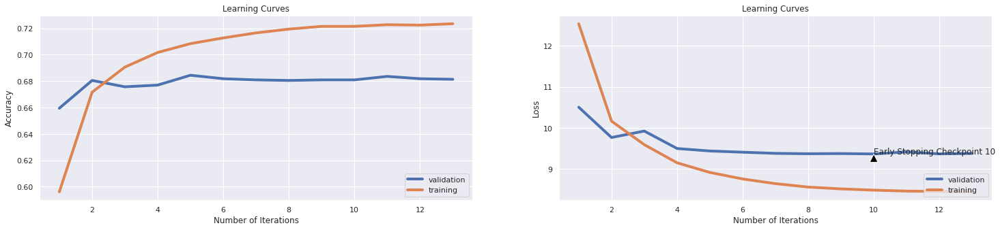

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.799209  0.758685  0.778420
antivax        0.000000  0.000000  0.000000
provax         0.587726  0.811075  0.681569
macro avg      0.462312  0.523253  0.486663
weighted avg   0.610190  0.681420  0.638362
Accuracy: 0.68142 

Total time: 45.29 seconds
Grid Search: 77, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.5406234351527291, 0.6124812218327491, 0.649849774661993, 0.6691286930395594, 0.67864296444667, 0.6856534802203305, 0.692163244867301, 0.6982974461692539, 0.7014271407110666, 0.7029293940911367, 0.7077491236855283, 0.7108162243365047, 0.7124436654982473, 0.7139459188783175, 0.7159489233850777, 0.7161367050575864, 0.7193289934902354, 0.7195167751627441, 0.7229594391587381, 0.721957936905358, 0.7232724086129194]
Validation accuracy scores: [0.5723049956178791, 0.6134969325153374, 0.6638913234005258, 0.6730937773882559, 0.676599474145486

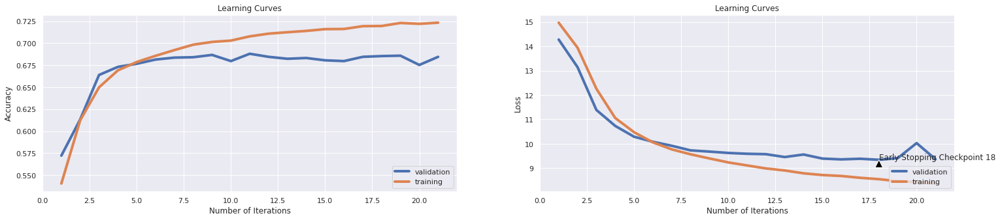

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.808511  0.749296  0.777778
antivax        0.000000  0.000000  0.000000
provax         0.589961  0.829533  0.689531
macro avg      0.466157  0.526276  0.489103
weighted avg   0.615433  0.684487  0.641276
Accuracy: 0.68449 

Total time: 70.06 seconds
Grid Search: 78, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.4953680520781172, 0.5836880320480721, 0.6290060090135203, 0.6628693039559339, 0.6795818728092138, 0.6898472709063596, 0.6993615423134703, 0.703743114672008, 0.7063094641962945, 0.7092513770655984, 0.7139459188783175, 0.7091261892839259, 0.7150726089133701, 0.7149474211316975, 0.7173885828743115, 0.7170756134201302]
Validation accuracy scores: [0.5267309377738826, 0.6139351446099912, 0.6577563540753725, 0.656441717791411, 0.6765994741454864, 0.6801051709027169, 0.6840490797546013, 0.6875547765118317, 0.6678352322524101, 0.68054338

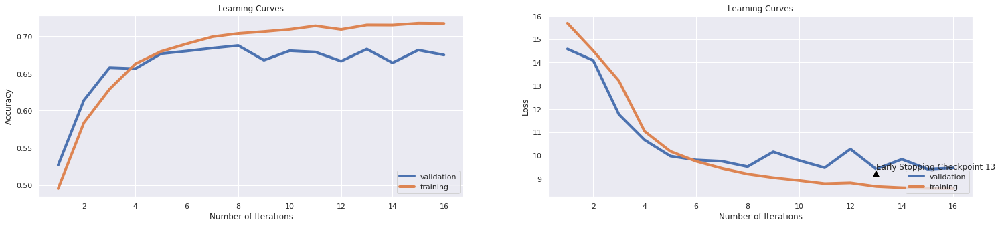

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.740017  0.817840  0.776985
antivax        0.000000  0.000000  0.000000
provax         0.605430  0.726384  0.660415
macro avg      0.448482  0.514742  0.479133
weighted avg   0.589710  0.674847  0.629155
Accuracy: 0.67485 

Total time: 61.87 seconds
Grid Search: 79, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5913870806209314, 0.6489734601902855, 0.6705683525287932, 0.6771407110665999, 0.6913495242864296, 0.7044942413620431, 0.7146970455683526, 0.7207060590886329, 0.7310966449674512, 0.7374812218327491, 0.7446169253880821, 0.746056584877316, 0.7496244366549825, 0.7506259389083625]
Validation accuracy scores: [0.633216476774759, 0.6222611744084137, 0.6818580192813322, 0.6862401402278703, 0.6577563540753725, 0.6888694127957932, 0.6919368974583698, 0.6932515337423313, 0.6897458369851008, 0.6932515337423313, 0.69237510955302

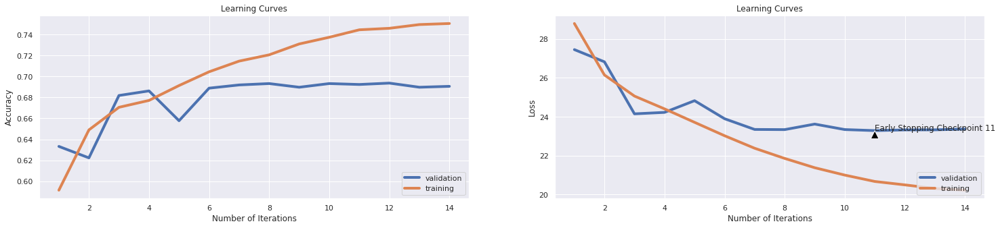

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.776645  0.786854  0.781716
antivax        0.000000  0.000000  0.000000
provax         0.613466  0.801303  0.694915
macro avg      0.463370  0.529386  0.492211
weighted avg   0.610048  0.690622  0.645287
Accuracy: 0.69062 

Total time: 61.58 seconds
Grid Search: 80, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6017150726089133, 0.6885953930896345, 0.7144466700050075, 0.7319729594391587, 0.7383575363044567, 0.7474962443665498, 0.7436780170255383, 0.7508763144717076, 0.7503129694541812]
Validation accuracy scores: [0.677475898334794, 0.6862401402278703, 0.6498685363716039, 0.7063978965819456, 0.7195442594215601, 0.7274320771253286, 0.7046450482033304, 0.7046450482033304, 0.7156003505696757]
Training f1 scores: [0.5230833749810768, 0.6441022924720511, 0.6863567260923372, 0.7178227655563748, 0.7259842367495165, 0.7368561468710425, 

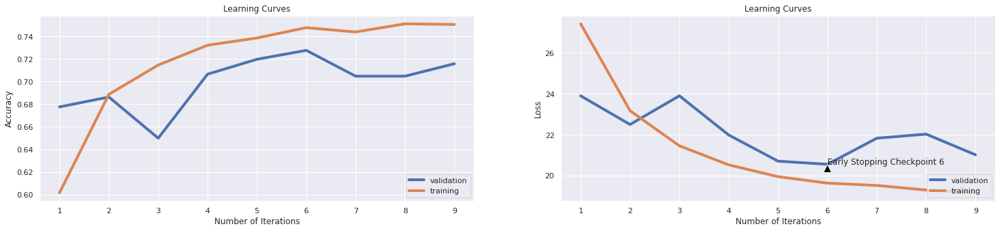

              precision    recall  f1-score
neutral        0.705882  0.867606  0.778433
antivax        0.691860  0.402027  0.508547
provax         0.736579  0.640608  0.685250
macro avg      0.711441  0.636747  0.657410
weighted avg   0.716453  0.715600  0.705818
Accuracy: 0.71560 

Total time: 40.00 seconds
Grid Search: 81, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.44466700050075114, 0.46688783174762144, 0.5207185778668002, 0.6444667000500751, 0.6797696544817226, 0.6946670005007511, 0.7061216825237857, 0.71457185778668, 0.7293440160240361, 0.745555833750626, 0.754444166249374, 0.7592638958437656, 0.7655232849273911, 0.7703430145217827, 0.7717826740110165, 0.7792313470205308, 0.7792939409113671, 0.7820480721081623]
Validation accuracy scores: [0.46669588080631025, 0.46669588080631025, 0.5929009640666082, 0.6603856266432954, 0.6822962313759859, 0.6910604732690623, 0.68492550394390

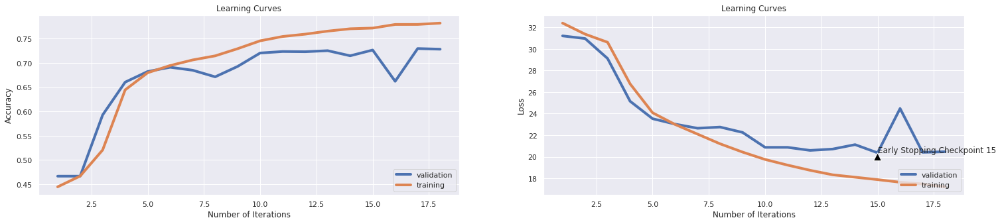

              precision    recall  f1-score
neutral        0.781104  0.784038  0.782568
antivax        0.565693  0.523649  0.543860
provax         0.715655  0.729642  0.722581
macro avg      0.687484  0.679109  0.683003
weighted avg   0.726748  0.728309  0.727394
Accuracy: 0.72831 

Total time: 79.26 seconds
Grid Search: 82, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 0.01, Schelduler: Exponential
Training accuracy scores: [0.5937030545818728, 0.6593014521782674, 0.6664371557336004, 0.6765773660490736, 0.686529794692038, 0.6972959439158738, 0.7059964947421131, 0.7161367050575864, 0.7207686529794692, 0.7267776664997496, 0.730095142714071, 0.7336629944917376, 0.7354156234351528, 0.7361667501251877, 0.7379819729594391, 0.7377315973960942, 0.7374812218327491]
Validation accuracy scores: [0.6647677475898335, 0.6560035056967572, 0.6809815950920245, 0.6687116564417178, 0.6787905346187555, 0.6801051709027169, 0.6652059596844873, 0.6822962313759859, 0.6

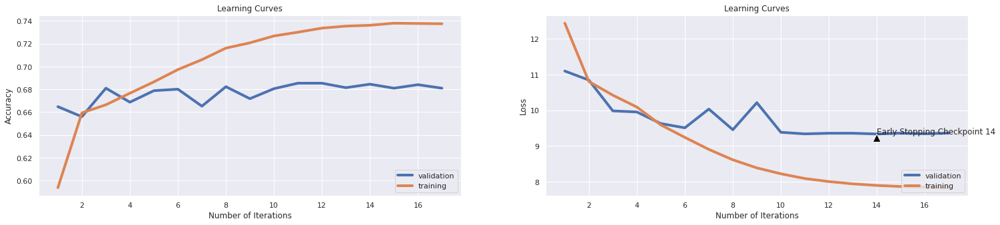

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.795074  0.757746  0.775962
antivax        0.000000  0.000000  0.000000
provax         0.589582  0.811075  0.682815
macro avg      0.461552  0.522940  0.486259
weighted avg   0.609009  0.680982  0.637718
Accuracy: 0.68098 

Total time: 73.39 seconds
Grid Search: 83, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6046569854782173, 0.6857160741111668, 0.6894091136705057, 0.6976715072608913, 0.6974837255883826, 0.6982974461692539, 0.7011767651477215]
Validation accuracy scores: [0.6765994741454864, 0.6822962313759859, 0.6735319894829097, 0.677475898334794, 0.6809815950920245, 0.6831726555652936, 0.6805433829973707]
Training f1 scores: [0.5367697800494936, 0.6417380551499036, 0.6445251965241677, 0.6538999827109608, 0.6529076257101153, 0.6542153398148418, 0.6564824680154518]
Validation f1 scores: [0.6369043783976269, 0.642833232765185, 0.631

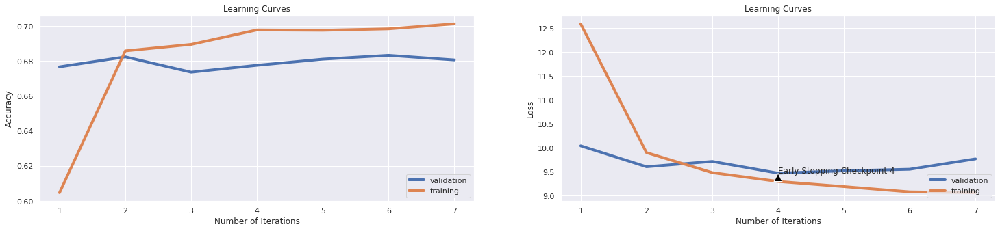

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.862676  0.690141  0.766823
antivax        0.000000  0.000000  0.000000
provax         0.572028  0.888165  0.695874
macro avg      0.478235  0.526102  0.487566
weighted avg   0.633474  0.680543  0.638723
Accuracy: 0.68054 

Total time: 30.15 seconds
Grid Search: 84, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: OneCycle
Training accuracy scores: [0.5104531797696544, 0.6037180771156735, 0.650851276915373, 0.6760766149223836, 0.6872183274912369, 0.6947921882824236, 0.7024912368552829, 0.7078743114672008, 0.7083750625938908, 0.7129444166249375, 0.715322984476715, 0.7167626439659489, 0.7178893340010015, 0.7198923385077617, 0.7227716574862293, 0.721707561342013, 0.7226464697045568]
Validation accuracy scores: [0.5727432077125328, 0.6481156879929886, 0.6437335670464505, 0.670464504820333, 0.6862401402278703, 0.6814198071866784, 0.6862401402278703, 0.6827344434706398, 0.68492

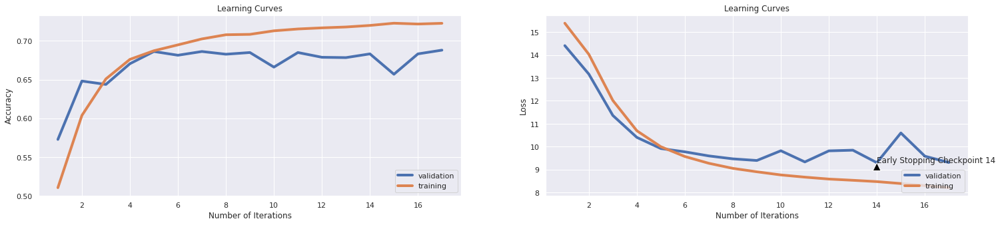

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.821689  0.739906  0.778656
antivax        0.000000  0.000000  0.000000
provax         0.591081  0.849077  0.696970
macro avg      0.470923  0.529661  0.491875
weighted avg   0.622035  0.687993  0.644688
Accuracy: 0.68799 

Total time: 74.44 seconds
Grid Search: 85, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.4668252378567852, 0.4668252378567852, 0.47014271407110664, 0.4943665498247371, 0.5604656985478217, 0.6088507761642463, 0.6512268402603906, 0.6658112168252378, 0.6695668502754131, 0.6738232348522785, 0.6758888332498748, 0.6780796194291437, 0.6815222834251377, 0.6840886329494241, 0.6854656985478217, 0.6864672008012018, 0.6879068602904357, 0.6884076114171257, 0.6902228342513771, 0.6911617426139208, 0.6927891837756635, 0.6944166249374061, 0.6954807210816224, 0.6952303455182774, 0.6969203805708563, 0.6968577866800201, 0.6979218

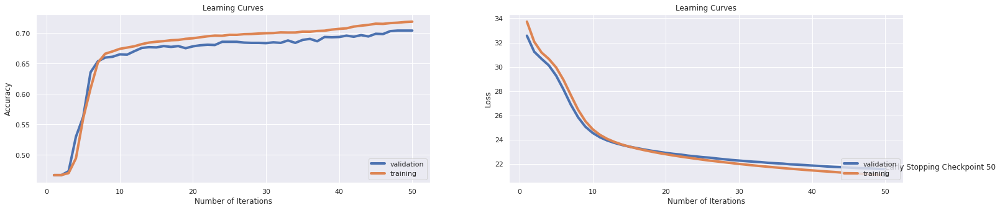

              precision    recall  f1-score
neutral        0.770852  0.789671  0.780148
antivax        0.705882  0.162162  0.263736
provax         0.638468  0.778502  0.701566
macro avg      0.705068  0.576778  0.581817
weighted avg   0.708996  0.703769  0.681449
Accuracy: 0.70377 

Total time: 298.09 seconds
Grid Search: 86, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.13025788683024536, 0.17388582874311467, 0.3520906359539309, 0.40266649974962443, 0.4034176264396595, 0.4034176264396595, 0.4034176264396595, 0.4054832248372559, 0.4166875312969454, 0.42926890335503254, 0.44541812719078616, 0.4983725588382574, 0.5718577866800201, 0.6115423134702053, 0.6039058587881823, 0.5714822233350025, 0.5407486229344016, 0.5213445167751627, 0.5071982974461693, 0.49812218327491237, 0.4872308462694041, 0.4836629944917376, 0.48247371056584876, 0.4813470205307962, 0.4808462694041062, 0.48153480220330497, 

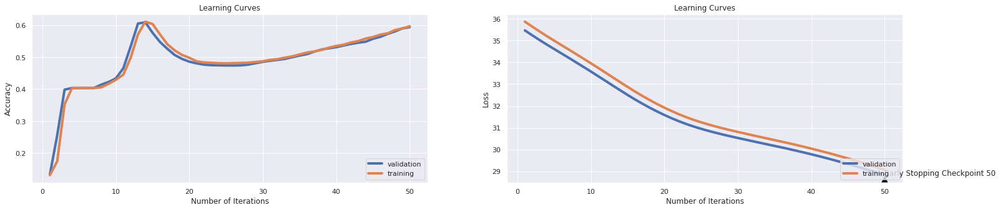

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.567986  0.929577  0.705128
antivax        0.000000  0.000000  0.000000
provax         0.679035  0.397394  0.501370
macro avg      0.415674  0.442324  0.402166
weighted avg   0.539131  0.594216  0.531430
Accuracy: 0.59422 

Total time: 302.25 seconds
Grid Search: 87, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.1

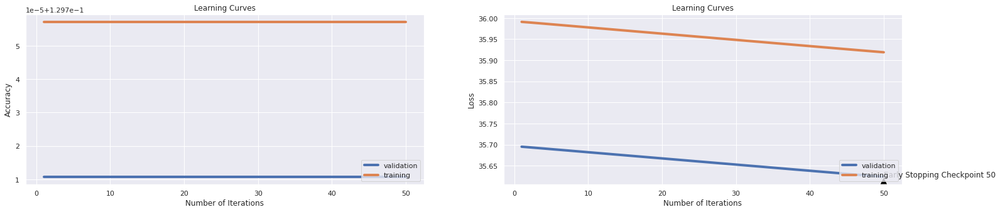

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.000000  0.000000  0.000000
antivax        0.129711  1.000000  0.229635
provax         0.000000  0.000000  0.000000
macro avg      0.043237  0.333333  0.076545
weighted avg   0.016825  0.129711  0.029786
Accuracy: 0.12971 

Total time: 302.52 seconds
Grid Search: 88, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.4342764146219329, 0.47195793690535803, 0.5758012018027041, 0.6400225338007011, 0.6587381071607411, 0.6684401602403606, 0.6730721081622434, 0.6760140210315473, 0.6785803705558338, 0.6804581872809213, 0.682836755132699, 0.685778668002003, 0.6861542313470206, 0.6870931397095643, 0.6902228342513771, 0.6905358037055583, 0.6906609914872308, 0.6915998998497747, 0.692163244867301, 0.692663995993991, 0.6934777165748623, 0.6935403104656985, 0.6936029043565348, 0.6936029043565348, 0.6939158738107161, 0.6949173760640961, 0.6951677516274412,

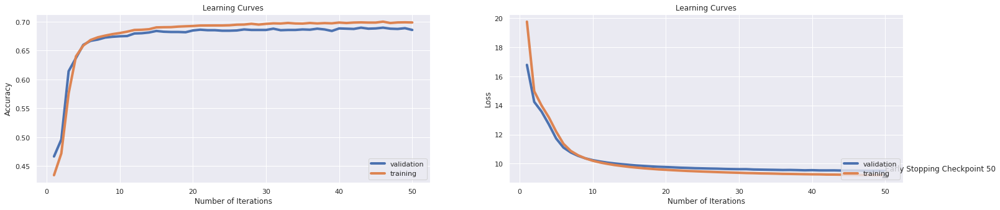

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.793635  0.772770  0.783064
antivax        0.000000  0.000000  0.000000
provax         0.595984  0.805646  0.685134
macro avg      0.463206  0.526139  0.489399
weighted avg   0.610922  0.685802  0.641968
Accuracy: 0.68580 

Total time: 302.58 seconds
Grid Search: 89, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.16036554832248373, 0.296757636454682, 0.39371557336004004, 0.40373059589384075, 0.4044191286930396, 0.40485728592889336, 0.40604656985478216, 0.41117926890335504, 0.41649974962443664, 0.43214822233350025, 0.453242363545318, 0.48165998998497744, 0.513269904857286, 0.5432523785678518, 0.5802453680520782, 0.6131071607411117, 0.6248748122183275, 0.6200550826239359, 0.6060340510766149, 0.5990235353029544, 0.5950801201802705, 0.5940786179268903, 0.5968327491236856, 0.5999624436654982, 0.6014646970455684, 0.60578367551327, 0.607160741

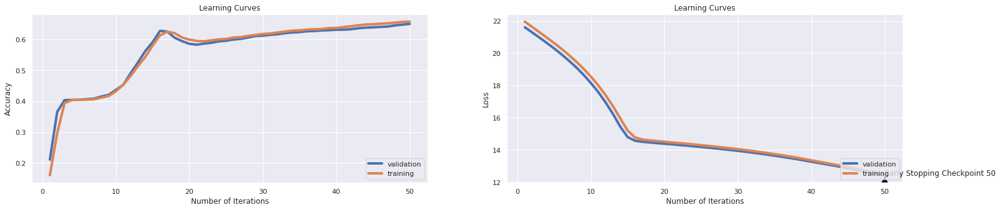

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.665936  0.855399  0.748870
antivax        0.000000  0.000000  0.000000
provax         0.625821  0.621064  0.623433
macro avg      0.430585  0.492154  0.457434
weighted avg   0.563366  0.649869  0.601108
Accuracy: 0.64987 

Total time: 294.98 seconds
Grid Search: 90, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713570355532, 0.12975713

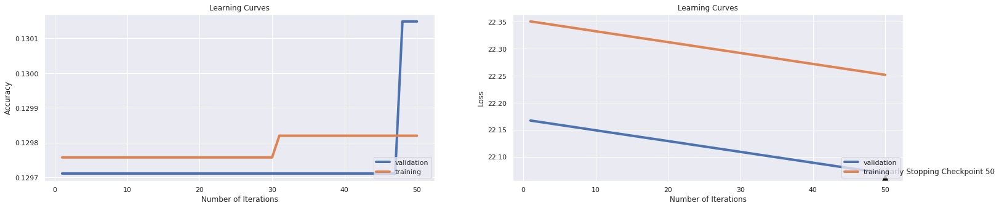

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.000000  0.000000  0.000000
antivax        0.129768  1.000000  0.229724
provax         1.000000  0.001086  0.002169
macro avg      0.376589  0.333695  0.077298
weighted avg   0.420426  0.130149  0.030673
Accuracy: 0.13015 

Total time: 297.49 seconds
Grid Search: 91, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.6551702553830746, 0.689471707561342, 0.6975463194792189, 0.7063720580871307, 0.7054331497245869, 0.7086880320480721, 0.7103154732098147, 0.7131947921882824]
Validation accuracy scores: [0.6888694127957932, 0.7112182296231376, 0.708150744960561, 0.7107800175284837, 0.7125328659070991, 0.7063978965819456, 0.7112182296231376, 0.6989482909728308]
Training f1 scores: [0.6177994837994237, 0.6731794337802439, 0.6849982127843146, 0.6944445112610644, 0.6941940587359756, 0.6961648362914566, 0.7006902557040363, 0.7020502000521869]
Valid

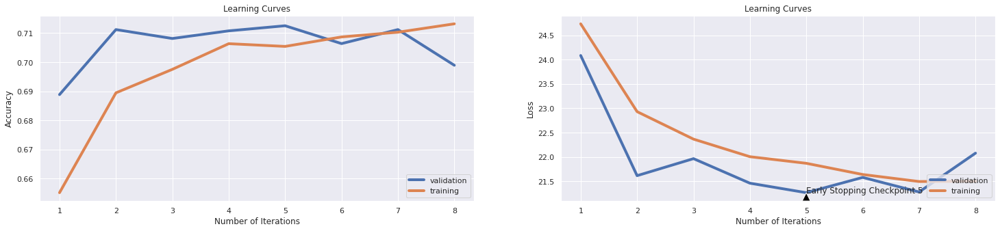

              precision    recall  f1-score
neutral        0.853837  0.658216  0.743372
antivax        0.634483  0.310811  0.417234
provax         0.609422  0.870793  0.717032
macro avg      0.699247  0.613273  0.625879
weighted avg   0.726740  0.698948  0.690438
Accuracy: 0.69895 

Total time: 119.52 seconds
Grid Search: 92, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6442789183775663, 0.7111917876815222, 0.7238357536304457, 0.73278668002003, 0.7424887330996495, 0.7493114672008012, 0.756134201301953, 0.7609539308963446, 0.7692789183775663, 0.7732849273910867, 0.7816099148723085]
Validation accuracy scores: [0.6950043821209465, 0.7147239263803681, 0.7248028045574058, 0.7191060473269062, 0.7370727432077125, 0.7309377738825592, 0.7318141980718668, 0.7340052585451359, 0.7221735319894829, 0.7344434706397897, 0.7366345311130588]
Training f1 scores: [0.5901411922402446, 0.6935895862360187, 0.711

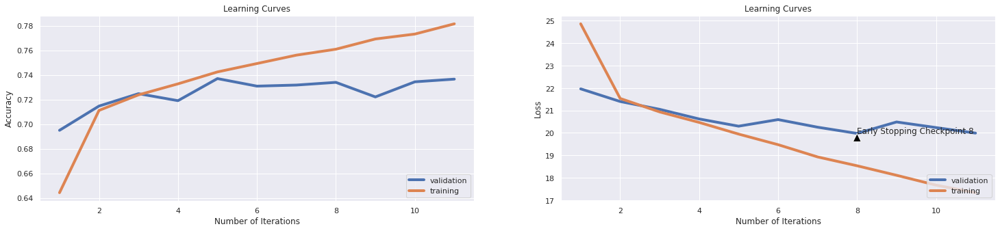

              precision    recall  f1-score
neutral        0.794200  0.797183  0.795689
antivax        0.635417  0.412162  0.500000
provax         0.695397  0.770901  0.731205
macro avg      0.708338  0.660082  0.675631
weighted avg   0.733728  0.736635  0.731310
Accuracy: 0.73663 

Total time: 113.76 seconds
Grid Search: 93, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.44973710565848773, 0.5224086129193791, 0.5266649974962444, 0.5114546820230346, 0.4959939909864797, 0.48679268903355033, 0.48253630445668505, 0.4800325488232349, 0.4805332999499249, 0.4809088632949424, 0.4831622433650476, 0.48566599899849777, 0.4918627941912869, 0.49981221832749123, 0.5132073109664497, 0.5208437656484727, 0.5344892338507762, 0.5539559339008513, 0.5677891837756635, 0.5882573860791187, 0.6024036054081122, 0.621056584877316, 0.6320105157736605, 0.6450926389584376, 0.6523535302954432, 0.6621181772658988, 0.668502

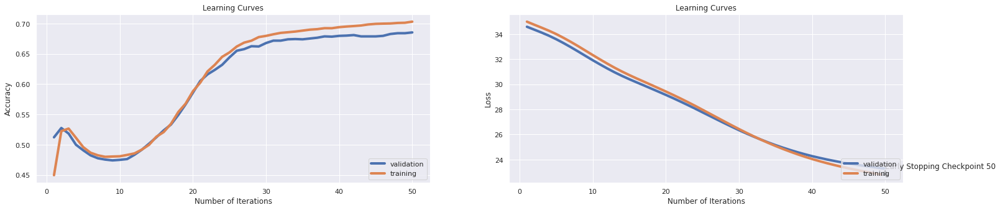

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.769369  0.801878  0.785287
antivax        0.000000  0.000000  0.000000
provax         0.605802  0.770901  0.678452
macro avg      0.458390  0.524260  0.487913
weighted avg   0.603559  0.685364  0.640309
Accuracy: 0.68536 

Total time: 335.04 seconds
Grid Search: 94, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 0.01, Schelduler: None
Training accuracy scores: [0.6447796695042564, 0.6638082123184778, 0.6685027541311968, 0.665122684026039, 0.6716950425638458, 0.6703805708562844]
Validation accuracy scores: [0.6524978089395267, 0.6581945661700263, 0.6695880806310254, 0.6669588080631026, 0.6656441717791411, 0.6660823838737949]
Training f1 scores: [0.6016375379451201, 0.6217193944138557, 0.6255606070504319, 0.6230415513588128, 0.62898075520748, 0.6278671846925975]
Validation f1 scores: [0.6154028854438199, 0.6213737840725907, 0.6305397987200835, 0.6249338949295029, 0.6255779765299763, 0.62373157

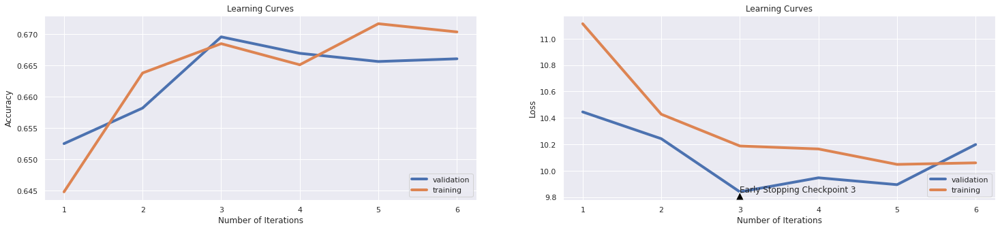

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score
neutral        0.700622  0.846009  0.766482
antivax        0.000000  0.000000  0.000000
provax         0.621486  0.672096  0.645801
macro avg      0.440703  0.506035  0.470761
weighted avg   0.577805  0.666082  0.618355
Accuracy: 0.66608 

Total time: 78.25 seconds
Grid Search: 95, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6548572859288934, 0.6799574361542313, 0.6897220831246871, 0.7048072108162243, 0.7172633950926389, 0.7331622433650475, 0.7377941912869304, 0.7444291437155733, 0.7503755633450175, 0.7576990485728593, 0.7601402103154732, 0.7633324987481221, 0.7667751627441162, 0.7692789183775663, 0.7701552328492739, 0.7735353029544316]
Validation accuracy scores: [0.6682734443470639, 0.6765994741454864, 0.6761612620508326, 0.6906222611744084, 0.7199824715162139, 0.7164767747589833, 0.7296231375985978, 0.7269938650306749, 0.7230499561787905, 0.724364592

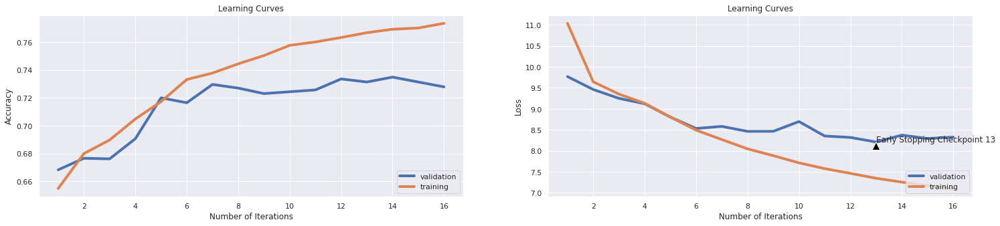

              precision    recall  f1-score
neutral        0.768051  0.799061  0.783249
antivax        0.677419  0.425676  0.522822
provax         0.692308  0.742671  0.716606
macro avg      0.712593  0.655803  0.674225
weighted avg   0.725725  0.727870  0.722572
Accuracy: 0.72787 

Total time: 204.19 seconds
Grid Search: 96, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-06, Schelduler: None
Training accuracy scores: [0.5023785678517777, 0.521657486229344, 0.5210941412118177, 0.5172759138708062, 0.5346144216324487, 0.5479469203805708, 0.5591512268402604, 0.5687906860290436, 0.6000876314471708, 0.6622433650475713, 0.6620555833750625, 0.6512894341512269, 0.6510390585878818, 0.6529794692038057, 0.657486229344016, 0.6605533299949925, 0.6639334001001502, 0.6732598898347522, 0.6765773660490736, 0.6789559339008513, 0.682836755132699, 0.6864046069103655, 0.6886579869804708, 0.6914121181772659, 0.692914371557336, 0.6947295943915874, 0.6954807210816224, 0.6

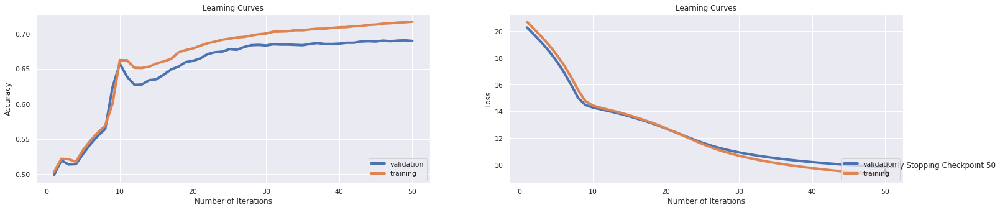

              precision    recall  f1-score
neutral        0.786325  0.777465  0.781870
antivax        0.000000  0.000000  0.000000
provax         0.606998  0.809989  0.693953
macro avg      0.464441  0.529151  0.491941
weighted avg   0.611955  0.689746  0.644970
Accuracy: 0.68975 

Total time: 318.03 seconds
Best grid is: Grid Search: 85, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
param_grid = {
  'neurons': [[75], [220, 90]],
  'activation_functions': ['SELU', 'ReLU'],
  'optimizers': ['SGD', 'Nesterov', 'Adadelta', 'Adam'],
  'loss_functions': ['CrossEntropy', 'Hinge'],
  'learning_rates': [{'val': 1e-2, 'schelduler' : 'Exponential'}, {'val': 1e-3, 'schelduler' : None}, {'val' : 5e-6, 'schelduler' : 'OneCycle'}],
  'classes': ['neutral', 'antivax', 'provax'],
  'batch_size': 32,
  'epochs': 50,
  'early_stopping_patience': 3,
  'input_normalization' : False,
  'L2_reg': 0.1,
  'accuracy_threshold': 0.7
}

customGridSearch(param_grid, tfidf_training_set, tfidf_validation_set)

## **Best TF-IDF Model**

Training accuracy scores: [0.3097771657486229, 0.5118928392588883, 0.6144842263395093, 0.5633450175262894, 0.5733600400600901, 0.6052203304957436, 0.6250625938908363, 0.6435903855783676, 0.653542814221332, 0.6603029544316474, 0.6663119679519279, 0.6679394091136706, 0.6709439158738107, 0.6723209814722083, 0.6732598898347522, 0.6738232348522785, 0.6760140210315473, 0.6767025538307461, 0.6775162744116174, 0.67864296444667, 0.6797696544817226, 0.6805833750625939, 0.6812719078617927, 0.6820230345518278, 0.6828993490235353, 0.6852779168753129, 0.685778668002003, 0.6870931397095643, 0.6882824236354532, 0.6898472709063596, 0.6905983975963946, 0.6917876815222834, 0.692914371557336, 0.6941036554832248, 0.6947295943915874, 0.6966700050075113, 0.6972333500250375, 0.6986730095142714, 0.6998622934401603, 0.7006134201301953, 0.7023660490736104, 0.7038057085628443, 0.7049949924887331, 0.7053705558337506, 0.706434651977967, 0.7065598397596394, 0.7074987481221833, 0.7081872809213821, 0.7087506259389084,

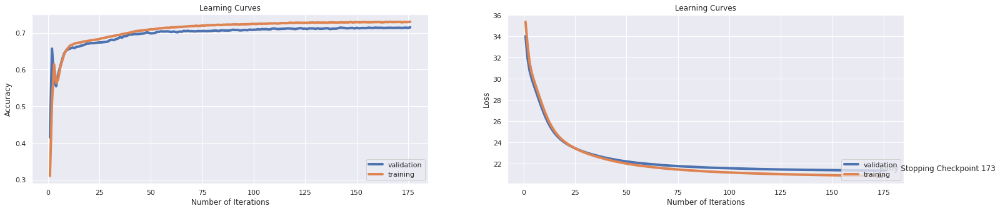

              precision    recall  f1-score
neutral        0.764759  0.790610  0.777470
antivax        0.701493  0.317568  0.437209
provax         0.664756  0.755700  0.707317
macro avg      0.710336  0.621293  0.640665
weighted avg   0.716192  0.715162  0.705021
Accuracy: 0.71516 






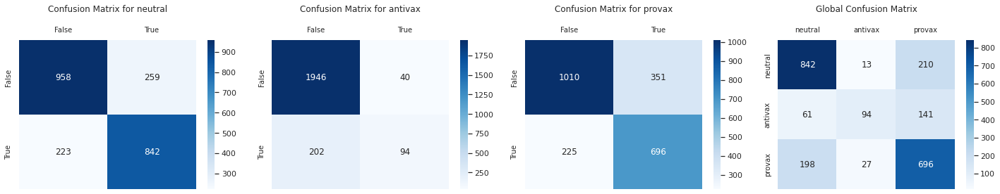

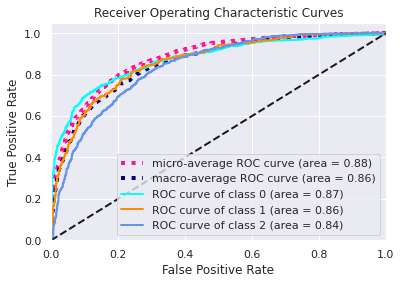

In [ ]:
#Grid Search: 13, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.01, Schelduler: None

# Hyperparameters
batch_size = 32
epochs = 170
early_stopping_patience = 3
L2_reg = 0.1
learning_rate = 1e-2

activation_function = activation_functions['SELU']()
layers = [{'neurons': 75,  'activation_fun': activation_function},
          {'neurons': 3, 'activation_fun': None}
          ]

model = NeuralNet(layers, tfidf_training_set[0].shape[1])

optimizer = optimizers['Adadelta'](model.parameters(), learning_rate, L2_reg)
loss_function = loss_functions['CrossEntropy'](reduction = 'sum')
schelduler = None

# This training proccess yielded the below loss vs epoch graphs
### model.trainNNWithOptions(tfidf_training_set, optimizer, loss_function, tfidf_validation_set, schelduler, stats = True, batch_size = batch_size, epochs = epochs, early_stopping_params = {'patience': early_stopping_patience})
# Simply training without validation set for test set evaluation
model.trainNN(tfidf_training_set, optimizer, loss_function, schelduler, epochs, batch_size) 
scores = modelEvaluation(model, tfidf_validation_set, ['neutral', 'antivax', 'provax'], cm_plot = True, roc_plot = True)